# MIRI PSF Photometry With Space_Phot

**Author**: Ori Fox<br>

**Submitted**: August, 2023<br>
**Updated**: November, 2023<br>

**Use case**: PSF Photometry on Level3 data using dedicated package Space_Phot (https://github.com/jpierel14/space_phot). Space_phot is built on Astropy's Photutils package. Unlike photutils, space_phot can be used on Level3 data. This is because has built in functionality that can generate a resampled Level3 PSF at a given detector position. Such use cases are particularly useful for faint, point source targets or deep upper limits where observers need to take advantage of the combined image stack. For a large number of bright sources, users may find space_phot to be too slow and should consider other packages, such as DOLPHOT and/or Photutils. **NOTE:** A companion notebook exists that illustrates how to use Photutils for the same Level2 data set.<br>
**Important Note**: When not to use. Due to the sensitivity of the space_phot parameters, this tool is not meant to be used for a large sample of stars (i.e., Section 5 below). If a user would like to use space_phot on more than one source, they should carefully construct a table of parameters that are carefully refined for each source.
**Data**: MIRI Data PID 1028 (Calibration Program; Single Star Visit 006 A5V dwarf 2MASSJ17430448+6655015) and MIRI Data PID 1171 (LMC; Multiple Stars).<br>
**Tools**: photutils, space_phot drizzlepac, jupyter <br>
**Cross-Instrument**: NIRCam, MIRI.<br>
**Documentation**: This notebook is part of a STScI's larger post-pipeline Data Analysis Tools Ecosystem and can be downloaded directly from the JDAT Notebook Github directory.<br>
**Pipeline Version**: JWST Pipeline<br>


## Table of contents
1. [Introduction](#intro)<br>
    1.1 [Setup](#webbpsf)<br>
    1.2 [Python imports](#py_imports)<br>
2. [Download Data](#data)<br>
3. [Bright, Single Object](#bso)<br>
    3.1 [Multiple, Level2 Files](#bso2)<br>
    3.2 [Single, Level3 Mosaicked File](#bso3)<br>
4. [Faint/Upper Limit, Single Object](#fso)<br>
    4.1 [Multiple, Level2 Files](#fso2)<br>
    4.2 [Single, Level3 Mosaicked File](#fso3)<br>
5. [Stellar Field (LMC)](#lmv)<br>
    5.1 [Multiple, Level2 Files](#lmc2)<br>
    5.2 [Single, Level3 Mosaicked File](#lmc3)<br>

1.<font color='white'>-</font>Introduction <a class="anchor" id="intro"></a>
------------------

GOALS:<br>

PSF Photometry can be obtained using:<br>

* grid of PSF models from WebbPSF<br>
* single effective PSF (ePSF) NOT YET AVAILABLE<br>
* grid of effective PSF NOT YET AVAILABLE<br>

The notebook shows:<br>

* how to obtain the PSF model from WebbPSF (or build an ePSF)<br>
* how to perform PSF photometry on the image<br>

**Data**:<br>

MIRI Data PID 1028 (Calibration Program), F770W <br>
MIRI Data PID 1171 (LMC), F560W/F770W

### 1.1<font color='white'>-</font>Setup WebbPSF and Synphot Directories<a class="anchor" id="webbpsf"></a> ###

In [1]:
import space_phot
from importlib.metadata import version
version('space_phot')



The following task in the stsci.skypac package can be run with TEAL:
                                    skymatch                                    


The following tasks in the drizzlepac package can be run with TEAL:
    astrodrizzle       config_testbed      imagefindpars           mapreg       
       photeq            pixreplace           pixtopix            pixtosky      
  refimagefindpars       resetbits          runastrodriz          skytopix      
     tweakback            tweakreg           updatenpol


'0.2.5'

In [2]:
import os
import glob
import shutil
import tarfile
import requests
from urllib.parse import urlparse

# Set environmental variables
os.environ["WEBBPSF_PATH"] = "./webbpsf-data/webbpsf-data"
os.environ["PYSYN_CDBS"] = "./grp/redcat/trds/"

# WEBBPSF Data
boxlink = 'https://stsci.box.com/shared/static/qxpiaxsjwo15ml6m4pkhtk36c9jgj70k.gz'                                                           
boxfile = './webbpsf-data/webbpsf-data-1.0.0.tar.gz'
synphot_url = 'http://ssb.stsci.edu/trds/tarfiles/synphot5.tar.gz'
synphot_file = './synphot5.tar.gz'

webbpsf_folder = './webbpsf-data'
synphot_folder = './grp'


def download_file(url, dest_path, timeout=60):
    parsed_url = urlparse(url)
    if parsed_url.scheme not in ["http", "https"]:
        raise ValueError(f"Unsupported URL scheme: {parsed_url.scheme}")

    response = requests.get(url, stream=True, timeout=timeout)
    response.raise_for_status()
    with open(dest_path, "wb") as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)


# Gather webbpsf files
psfExist = os.path.exists(webbpsf_folder)
if not psfExist:
    os.makedirs(webbpsf_folder)
    download_file(boxlink, boxfile)
    gzf = tarfile.open(boxfile)
    gzf.extractall(webbpsf_folder, filter='data')

# Gather synphot files
synExist = os.path.exists(synphot_folder)
if not synExist:
    os.makedirs(synphot_folder)
    download_file(synphot_url, synphot_file)
    gzf = tarfile.open(synphot_file)
    gzf.extractall('./', filter='data')

### 1.2<font color='white'>-</font>Python Imports<a class="anchor" id="py_imports"></a> ###

In [3]:
from astropy.io import fits
from astropy.table import QTable
from astropy.nddata import extract_array
from astropy.coordinates import SkyCoord
from astropy import wcs
from astropy.wcs.utils import skycoord_to_pixel
from astropy import units as u
from astropy.visualization import simple_norm
from astroquery.mast import Observations
from importlib.metadata import version
import time
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import warnings
%matplotlib inline

# JWST models
from jwst.datamodels import ImageModel

# Background and PSF Functions
from photutils.background import MMMBackground, MADStdBackgroundRMS, LocalBackground

# Photutils library and tools
from photutils.aperture import CircularAperture
from photutils.detection import DAOStarFinder

# set up crds if necessary
from crds import client
if os.environ.get("CRDS_PATH") is None:
    client.set_crds_server('https://jwst-crds.stsci.edu')
    os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
    os.environ["CRDS_PATH"] = ""

2.<font color='white'>-</font>Download Data<a class="anchor" id="data"></a>
------------------

In [4]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1028 and a specific filter 'F770W'
obs = Observations.query_criteria(proposal_id=1028, filters=['F770W'])

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])

# Download the selected products from the MAST database (UNCOMMENT TO DOWNLOAD)
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01028/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01028*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)

 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


In [5]:
# Query the MAST (Mikulski Archive for Space Telescopes) database for observations
# with proposal ID 1171 and a specific filters 'F550W' and 'F770W'
obs = Observations.query_criteria(proposal_id=1171, filters=['F560W', 'F770W'])

# Get a list of products associated with the located observation
plist = Observations.get_product_list(obs)

# Filter the product list to include only specific product subgroups: 'RATE', 'CAL', 'I2D', and 'ASN'
fplist = Observations.filter_products(plist, productSubGroupDescription=['CAL', 'I2D', 'ASN'])

# Download the selected products from the MAST database (UNCOMMENT TO DOWNLOAD)
Observations.download_products(fplist)

# Define source and destination directories
source_dir = 'mastDownload/JWST/'
destination_dir = 'mast/01171/'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)

# Use glob to find all files matching the pattern 'mastDownload/JWST/j*/jw01537*cal.fits'
files_to_copy = glob.glob(os.path.join(source_dir, 'j*/jw01171*'))

# Copy the matching files to the destination directory
for file_path in files_to_copy:
    shutil.copy(file_path, destination_dir)

 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


 [Done]


3.<font color='white'>-</font>Bright, Single Object<a class="anchor" id="bso"></a>
------------------

The purpose of this section is to illustrate how to perform PSF photometry on a single, bright object. While aperture photometry is feasible in isolated cases, the user may find PSF photometry preferable in crowded fields or complicated backgrounds.

### 3.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="bso2"></a> ###

Generally, PSF photometry for data from a space telescope is most accurately performed on pre-mosaiced data. In the case of HST, that corresponds to FLT files rather than DRZ. And in the case of JWST, this corresponds to Level2 files rather than Level3. The reason is that a mosaiced PSF changes the inherent PSF as a function of position on the detector so that there is no adequate model (theoretical or empirical) to use.<br>

In this example, we aim to fit a source simultaneously across multiple Level 2 images. A more basic approach would be to fit each Level 2 file individually and then average together the measured fluxes. However, this approach more easily corrects for bad pixels or cosmic rays that are only in one image and allows for a more accurate photometric solution by reducing the number of free parameters per source.<br>

Useful references:<br>
HST Documentation on PSF Photometry: https://www.stsci.edu/hst/instrumentation/wfc3/data-analysis/psf<br>
WFPC2 Stellar Photometry with HSTPHOT: https://ui.adsabs.harvard.edu/abs/2000PASP..112.1383D/abstract<br>
Space-Phot Documentation on Level2 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images<br>

In [6]:
# Define Level 3 File
lvl3 = ['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [7]:
# Create Level 2 Data List from ASN files
prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')

with open(asn[0], "r") as fi:
    lvl2 = []
    for ln in fi:
        #print(ln)
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])
print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


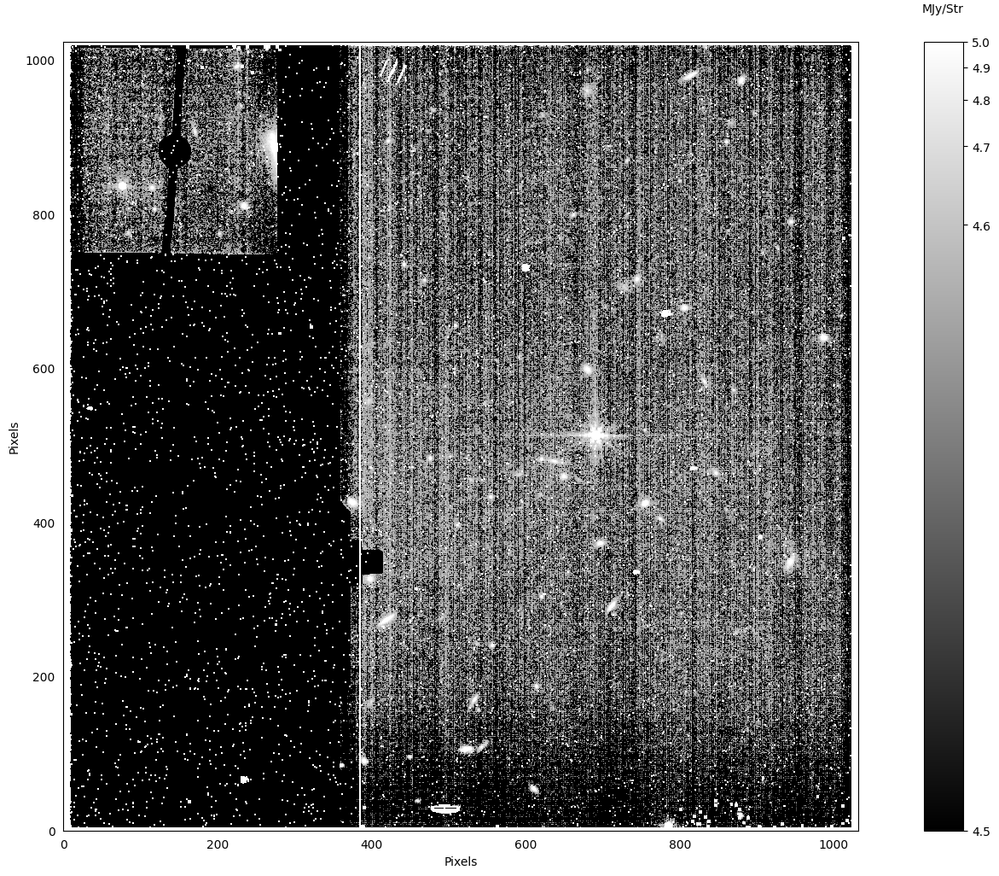

In [8]:
# Examine the First Image (Before DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


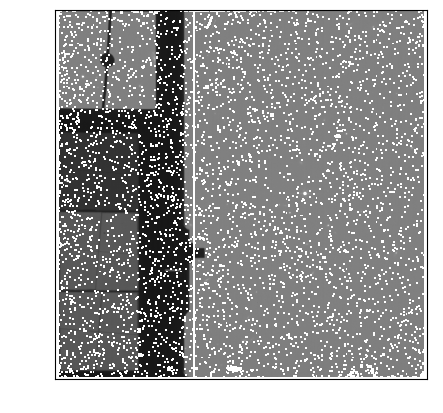

In [9]:
# Examine the First Image (Before DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [10]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

In [11]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    hdul = fits.open(file, mode='update')
    data = fits.open(file)['SCI', 1].data
    dq = fits.open(file)['DQ', 1].data
    data[dq >= 10] = np.nan
    hdul['SCI', 1].data = data
    hdul.flush()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


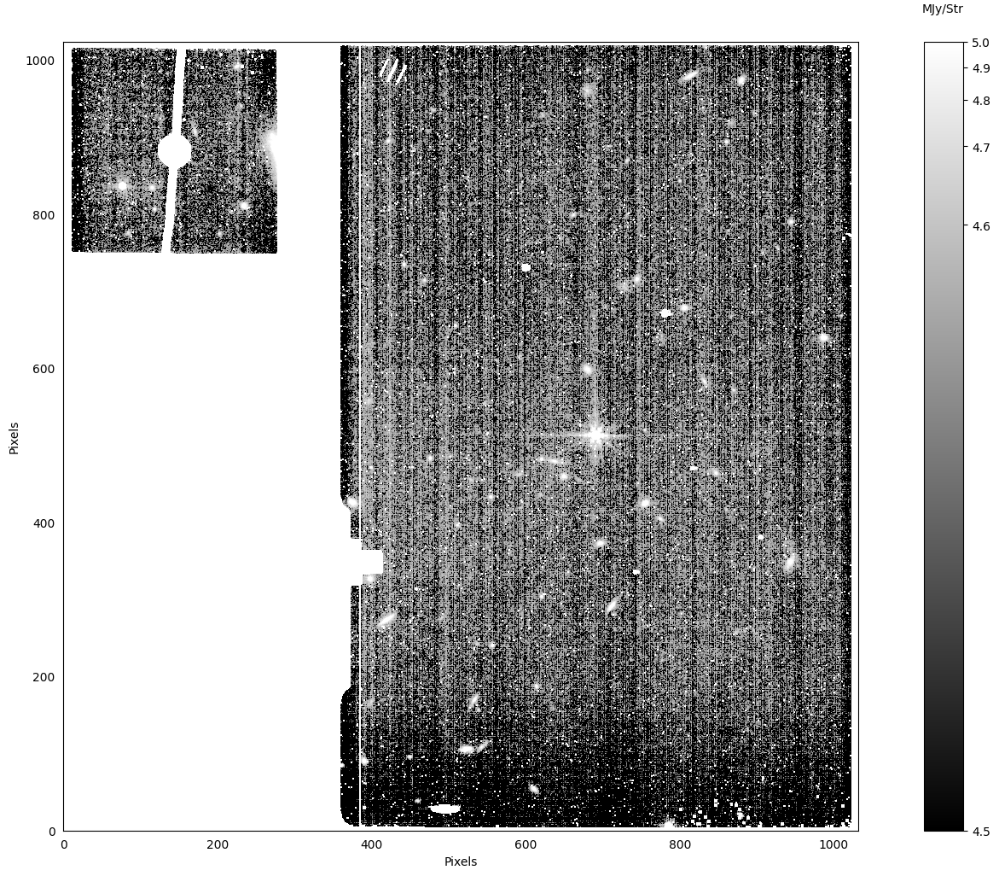

In [12]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

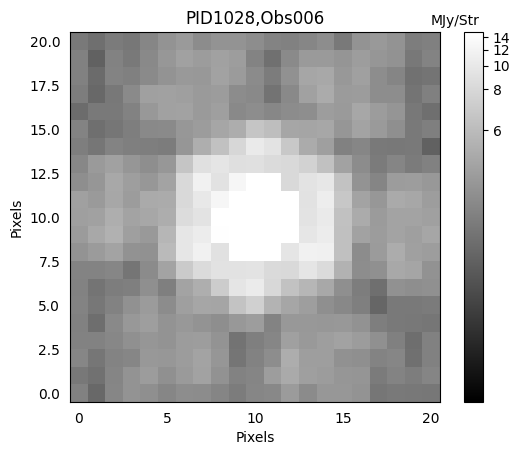

In [13]:
# Zoom in to see the source. In this case, our source is from MIRI Program ID #1028, a Calibration Program.
# We are using Visit 006, which targets the A5V dwarf 2MASSJ17430448+6655015
# Reference Link: http://simbad.cds.unistra.fr/simbad/sim-basic?Ident=2MASSJ17430448%2B6655015&submit=SIMBAD+search
source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.3, max_cut=15)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


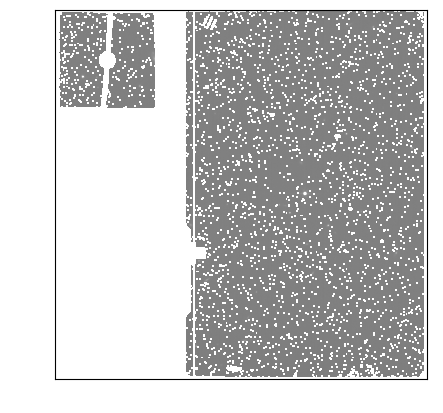

In [14]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

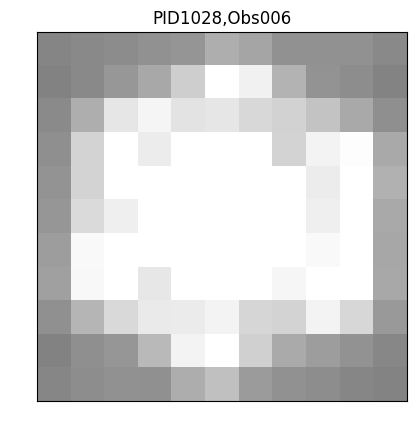

In [15]:
# Zoom in to see the source
source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))
ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
plt.title('PID1028,Obs006')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [16]:
# Get the PSF from WebbPSF using defaults.
jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days


 [Done]


Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.58446788), array(691.01192923)) pixels


    Position 1/1 centroid: (121.51240355224516, 121.46005973914637)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.0823346), array(703.49975178)) pixels


    Position 1/1 centroid: (121.51086191643049, 121.4622239877099)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(507.07857065), array(701.00356235)) pixels


    Position 1/1 centroid: (121.51028045414718, 121.46207330662133)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(502.58093657), array(694.50845109)) pixels


    Position 1/1 centroid: (121.51039393601155, 121.46118840344465)


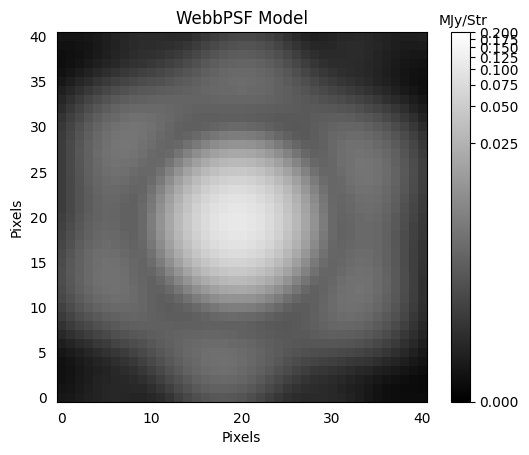

In [17]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psfs[0].data, (41, 41), (122, 122))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.2)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.

All fitting is performed with Astropy's Photutils. As with any photometry program, the printed statistical errors are good indicators of your success.

There are different fitting techniques, but when the fit_flux parameter is set to 'single', the source is fit simultaneously in all Level2 images. There is good reason for this outlined in a paper for PSF fitting in Hubble: https://iopscience.iop.org/article/10.1086/316630/pdf

As a result, the flux and corresponding error take into account a single overall fit. As part of this, the fitting therefore assumes a constant zero point across all images. While this is not exactly true, it is typically true to within 1\% and good enough for our purposes. Users can alternatively fit with the fit_flux parameter set to 'multi', which treats each image independently. The final flux must therefore be averaged.

When you run space_phot, you will see some additional diagnositics displayed in the cell. At the top, the % value printed is the fraction of flux remaining in the residual and can be considered a good indicator of a successful model and subtraction. Next are three columns displaying the original, the model, and the residual, respectively, for each Level2 image. Finally, there are corner plots suggesting the success of the fits (more documentation and explanation of these plots is coming).

In this case, you will notice a systematic trend in the residuals. The PSF is oversubtracted in the centermost pixel and undersubtracted in the wings. The cause is unknown. It may be due to a poor PSF model. The user should consider generating more complex PSF models, but that is beyond the scope of this notebook. Nonetheless, the residual value is pretty good so the overall statistical error is relatively small.

Finished PSF psf_photometry with median residuals of 0.51%


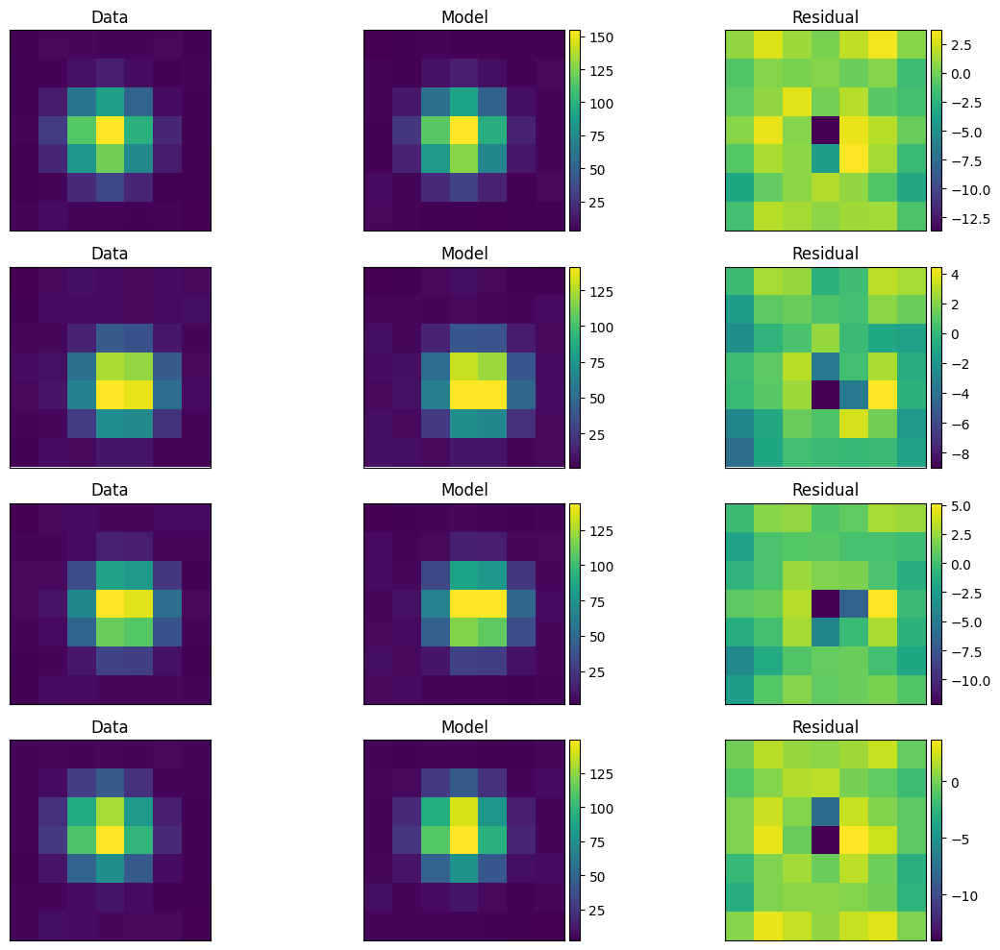

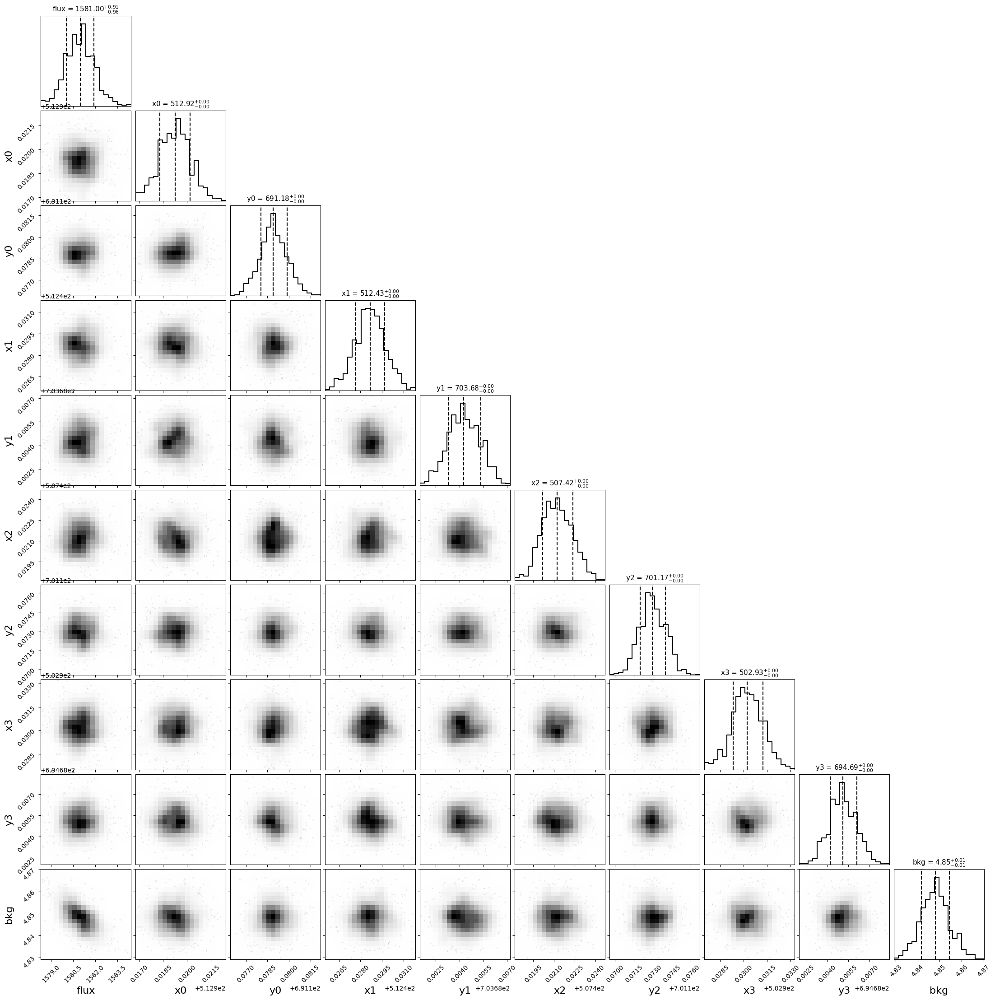

        ra         ...                     exp                    
------------------ ... -------------------------------------------
 265.7686991527498 ... jw01028006001_02101_00001_mirimage_cal.fits
 265.7686999566884 ... jw01028006001_02101_00002_mirimage_cal.fits
265.76869903605876 ... jw01028006001_02101_00003_mirimage_cal.fits
 265.7686993057716 ... jw01028006001_02101_00004_mirimage_cal.fits


In [18]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
jwst_obs.psf_photometry(
    psfs,
    source_location,
    bounds={
        'flux': [-10000, 10000],
        'centroid': [-2, 2],
        'bkg': [0, 50],
    },
    fit_width=7,
    fit_centroid='pixel',
    fit_bkg=True,
    fit_flux='single'
)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [19]:
jwst_obs.psf_result.phot_cal_table

ra,ra_err,dec,dec_err,x,x_err,y,y_err,mjd,flux,fluxerr,filter,zp,mag,magerr,zpsys,exp
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str5,float64,float64,float64,str2,str43
265.7686991527498,3.099540890616481e-08,66.91716542956232,4.048719404181611e-08,512.9192521779092,0.0009912539572151388,691.1789323524354,0.0009563241719186291,59724.05148232454,4.5371420228399123e-10,2.852756244950574e-13,F770W,-6.100000000000001,17.258044065296325,0.0006824488620271102,ab,jw01028006001_02101_00001_mirimage_cal.fits
265.7686999566884,3.352016619828646e-08,66.91716487104617,4.394696873077919e-08,512.4286880677503,0.001076894112232071,703.6842835829042,0.0010368242317971,59724.05578601667,4.5371420166173293e-10,2.852756241038086e-13,F770W,-6.100000000000005,17.258044066785384,0.0006824488620271102,ab,jw01028006001_02101_00002_mirimage_cal.fits
265.76869903605876,3.1266381483874284e-08,66.91716518069518,4.4621714323511696e-08,507.4212362399611,0.0011091861404591997,701.1729884581454,0.0010211801064166273,59724.06012231296,4.537142017433026e-10,2.85275624155096e-13,F770W,-6.100000000000005,17.258044066590188,0.0006824488620271102,ab,jw01028006001_02101_00003_mirimage_cal.fits
265.7686993057716,3.2071170608105604e-08,66.9171648958011,4.1145000295728096e-08,502.930257671631,0.0010041131008088537,694.6851429757894,0.0009782351171748044,59724.064394164816,4.5371420201722124e-10,2.8527562432732406e-13,F770W,-6.100000000000005,17.2580440659347,0.0006824488620271102,ab,jw01028006001_02101_00004_mirimage_cal.fits


In [20]:
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).
mag_lvl2_arr = jwst_obs.psf_result.phot_cal_table['mag']
magerr_lvl2_arr = jwst_obs.psf_result.phot_cal_table['magerr']

# Print Magnitude from Table
print(mag_lvl2_arr, '\n\n', magerr_lvl2_arr)

       mag        
------------------
17.258044065296325
17.258044066785384
17.258044066590188
  17.2580440659347 

         magerr       
---------------------
0.0006824488620271102
0.0006824488620271102
0.0006824488620271102
0.0006824488620271102


In [21]:
jwst_obs_fast = space_phot.observation2(lvl2[0])

In [22]:
centers = [ref_x, ref_y]
jwst_obs_fast.fast_psf(psfs[0], centers)

id,group_id,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,flux,fluxerr,mag,magerr,zp
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,float64,float64,float64,float64,float64
1,1,0.0,691.0119292269616,512.5844678797273,1668.262907461838,691.1736423963373,512.9081319598845,1861.7546481805002,0.0008250237966256669,0.0008332862486822065,1.735206001748099,25,1,0.4383646707471202,-0.02855987894871027,0,5.34290715540476e-10,4.97973488176964e-13,17.08055593139924,0.0010114644093132223,-6.100000000000001


### 3.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="bso3"></a> ###

Despite the above discussion on performing PSF photometry on the pre-mosaiced data products, space_phot has the functionality to create a mosaiced Level3 PSF at a given single position on the detector based on the Level2 images. The advantage to this is the ability to perform PSF photometry on the deep, stacked data in cases where faint sources are expected to have prohibitively low signal-to-noise in Level2 data. The disadvantage is the amount of time required to make mosaiced Level3 PSF, so that this method is most useful when dealing with a small number of low signal-to-noise sources.<br>

Useful references:<br>
Space-Phot Documentation on Level3 Fitting: https://space-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#level-3-psf<br>

In [23]:
# Level3 data file the same as above
lvl3

['./mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

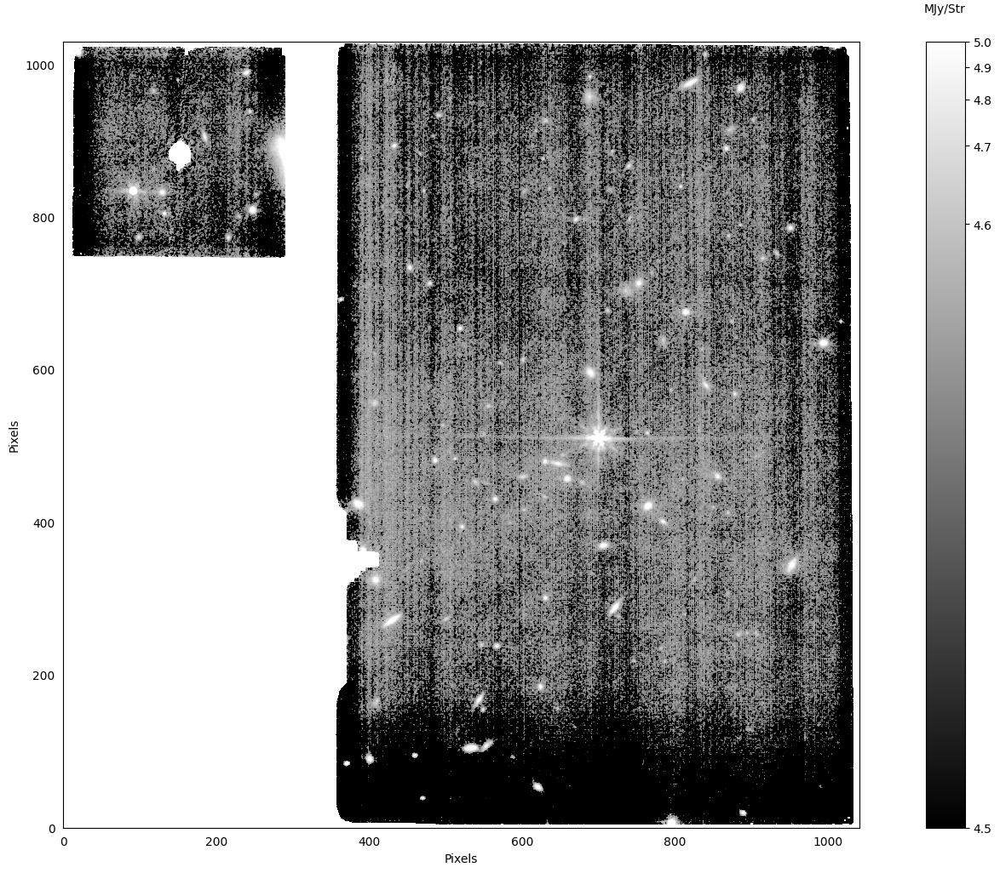

In [24]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

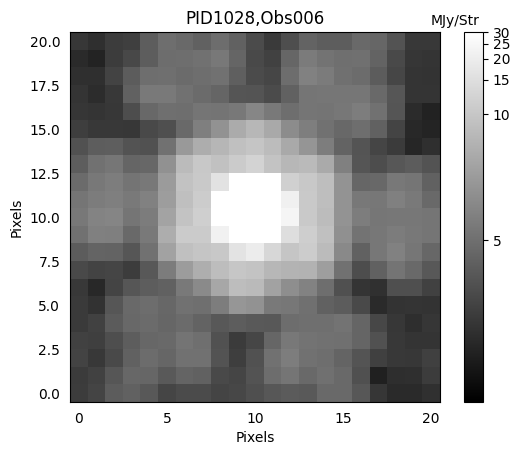

In [25]:
source_location = SkyCoord('17:43:04.4879', '+66:55:01.837', unit=(u.hourangle, u.deg))

ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=30)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

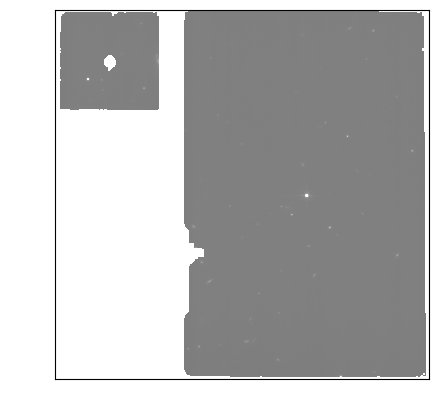

In [26]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [27]:
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

# Get PSF from WebbPSF
jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0



MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.58446788), array(691.01192923)) pixels


    Position 1/1 centroid: (201.5124035522455, 201.4600597391466)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(512.0823346), array(703.49975178)) pixels


    Position 1/1 centroid: (201.51086191643108, 201.4622239877097)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(507.07857065), array(701.00356235)) pixels


    Position 1/1 centroid: (201.51028045414768, 201.46207330662145)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(502.58093657), array(694.50845109)) pixels


    Position 1/1 centroid: (201.5103939360115, 201.46118840344508)


2024-12-10 20:16:18,517 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-12-10 20:16:18,519 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-12-10 20:16:18,521 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-12-10 20:16:18,523 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-12-10 20:16:18,525 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-12-10 20:16:18,526 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-12-10 20:16:18,528 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-12-10 20:16:18,922 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2024-12-10 20:16:18,937 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2024-12-10 20:16:18,937 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-12-10 20:16:19,407 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c62d33210>,).


2024-12-10 20:16:19,408 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2024-12-10 20:16:20,254 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c62d33210>,).


2024-12-10 20:16:20,254 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2024-12-10 20:16:20,437 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c62d33210>,).


2024-12-10 20:16:20,438 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2024-12-10 20:16:20,618 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c62d33210>,).


2024-12-10 20:16:20,620 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:16:20,620 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:16:20,621 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:16:20,621 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:16:20,623 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:16:20,624 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:16:20,624 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:16:20,625 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:16:20,626 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:16:20,627 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:16:20,627 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:16:20,628 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:16:20,629 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:16:20,630 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:16:20,630 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:16:20,631 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:16:20,633 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-12-10 20:16:20,633 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-12-10 20:16:20,634 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-12-10 20:16:20,634 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-12-10 20:16:20,634 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11091579557784445 arcsec.


2024-12-10 20:16:20,728 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-12-10 20:16:21,316 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:16:22,080 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:16:22,884 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:16:23,646 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:16:24,321 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-12-10 20:16:24,323 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,324 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,324 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,325 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,326 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,326 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,327 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,328 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,328 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,329 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,330 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,330 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:16:24,351 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  265.737936402 66.941000865 265.701076764 66.912745077 265.773940411 66.898123015 265.810862277 66.926361876


2024-12-10 20:16:24,798 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2024-12-10 20:16:24,798 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-12-10 20:16:24,974 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1030, 1042) from temp_psf_cals_i2d.fits>,).


2024-12-10 20:16:24,975 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2024-12-10 20:16:24,981 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-12-10 20:16:24,981 - stpipe - INFO - Results used jwst version: 1.16.1


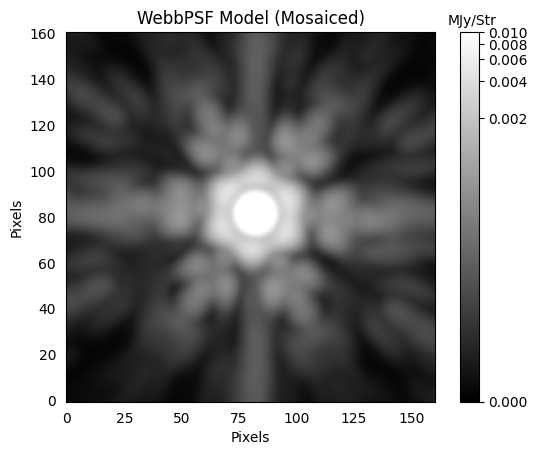

In [28]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)

plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model (Mosaiced)')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

#### Notes on the PSF Fitting in Space_Phot: <br> 

https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
As noted above, improved documentation will be coming. For now, here are some important points to consider.
See detailed notes in Section 3.1 above about the fitting process and diagnostics

In addition, consider here that jwst3_obs is generating a Level3 PSF by using the JWST pipeline to resample and combine multiple Level2 PSFs. The Level2 PSFs are generated at the precise location of the source in each Level2 file to account for detector level effects. The resampling uses default resampling paramters. However, users should be aware that if they performed customized resampling for their Level2 data products, they should use similar resampling steps for their PSF below.

Finished PSF psf_photometry with median residuals of 0.60%


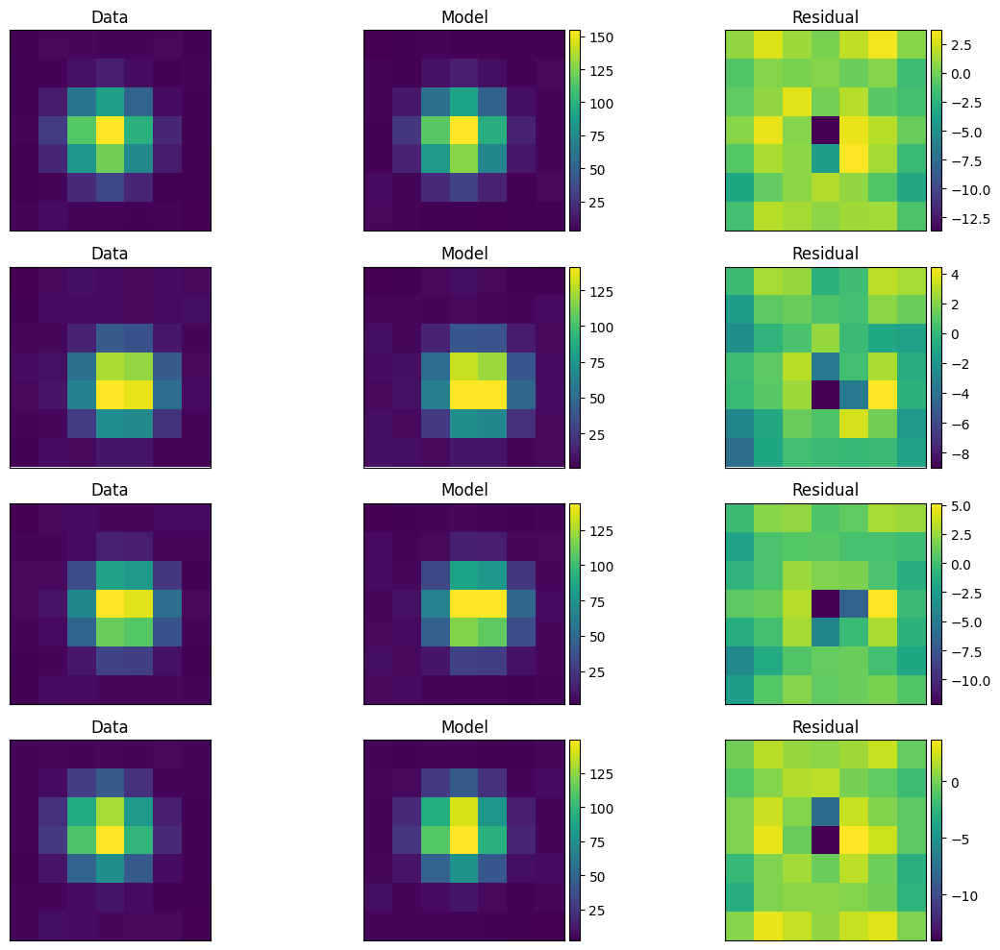

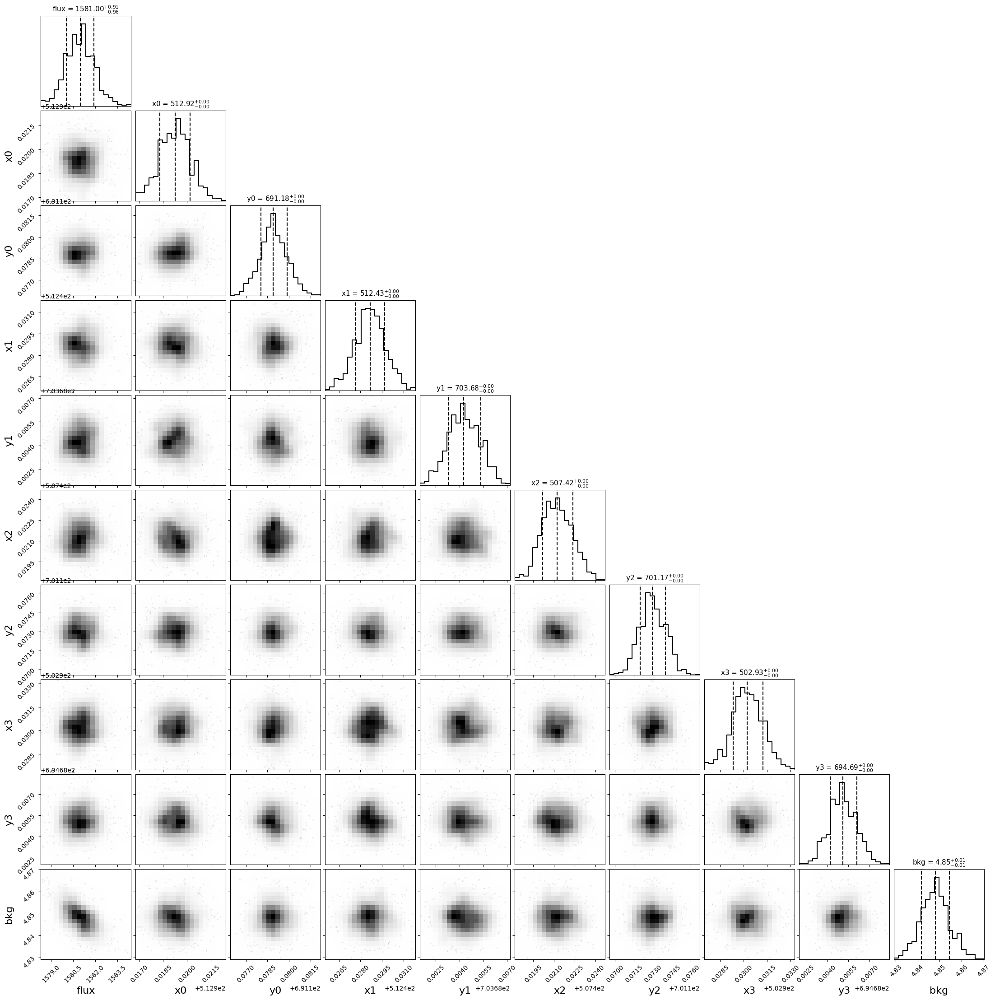

In [29]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# See detailed notes in Section 3.1 above about the fitting process and diagnostics
jwst3_obs.psf_photometry(
    psf3,
    source_location,
    bounds={
        'flux': [-10000, 10000],
        'centroid': [-2, 2],
        'bkg': [0, 50],
    },
    fit_width=9,
    fit_bkg=True,
    fit_flux=True
)

jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [30]:
mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]

print(round(mag_lvl2_arr[0], 4), round(magerr_lvl2_arr[0], 4))
print(round(mag_lvl3psf, 5), round(magerr_lvl3psf, 5))

17.258 0.0007
17.28632 0.0007


## Good agreement between Level2 and level3 results!

4.<font color='white'>-</font>Faint/Upper Limit, Single Object<a class="anchor" id="fso"></a>
------------------

The purpose of this section is to illustrate how to calculate an upper limit using PSF photometry a blank part of the sky. 

### 4.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="fso2"></a> ###

In [31]:
# Level 3 Files
lvl3 = ['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']
lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

In [32]:
# Create Level 2 Data List from ASN files
prefix = "./mast/01028/"
asn = glob.glob(prefix+'jw01028-o006_*_image3_00004_asn.json')

with open(asn[0], "r") as fi:
    lvl2 = []
    for ln in fi:
        if ln.startswith('                    "expname":'):
            x = ln[2:].split(':')
            y = x[1].split('"')
            lvl2.append(prefix+y[1])

print(lvl2)

['./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00002_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00003_mirimage_cal.fits', './mast/01028/jw01028006001_02101_00004_mirimage_cal.fits']


In [33]:
# Change all DQ flagged pixels to NANs

# Reference for JWST DQ Flag Definitions: https://jwst-pipeline.readthedocs.io/en/latest/jwst/references_general/references_general.html
# In this case, we choose all DQ > 10, but users are encouraged to choose their own values accordingly.
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


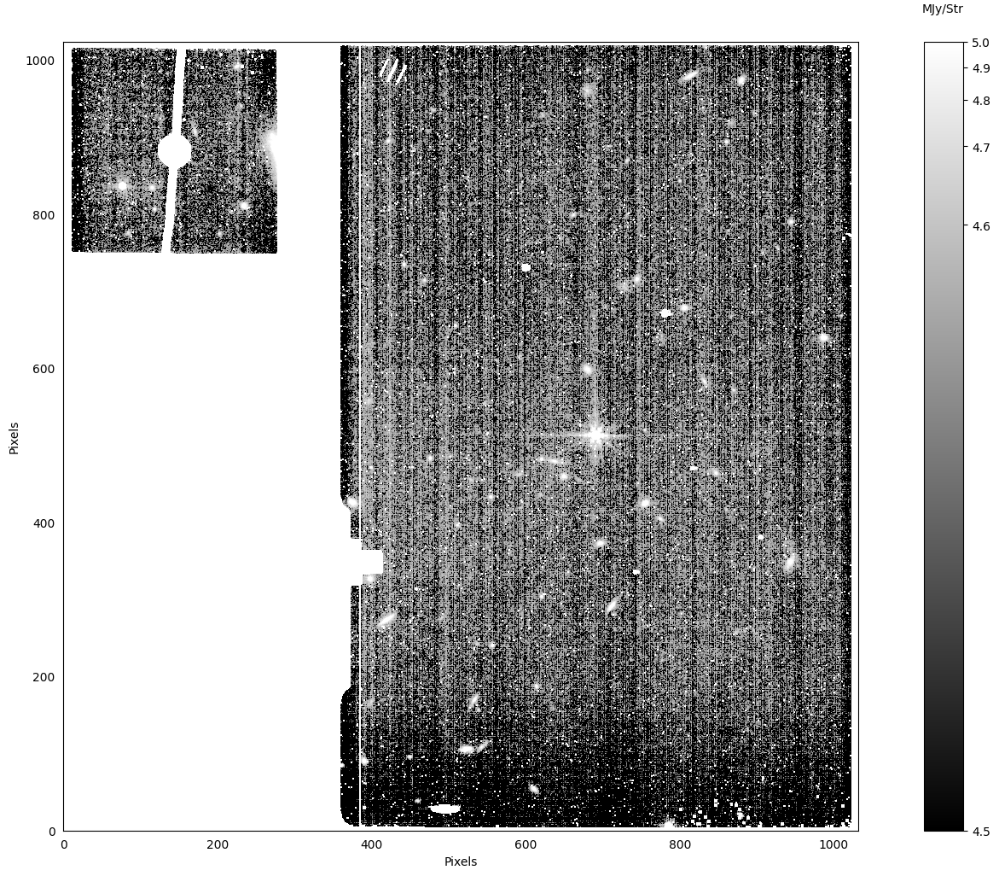

In [34]:
# Examine the First Image (After DQ Flags Set)
ref_image = lvl2[0]
print(ref_image)
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

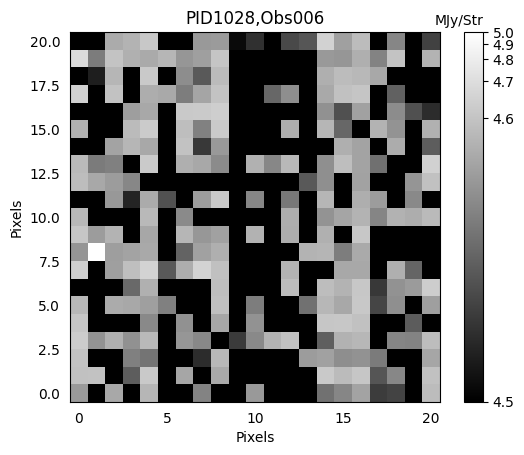

In [35]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=5)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


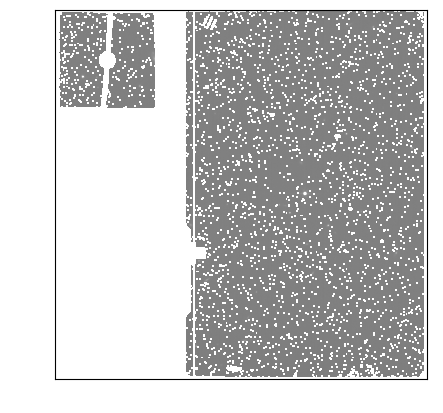

In [36]:
# Examine the First Image
ref_image = lvl2[0]
print(ref_image)
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

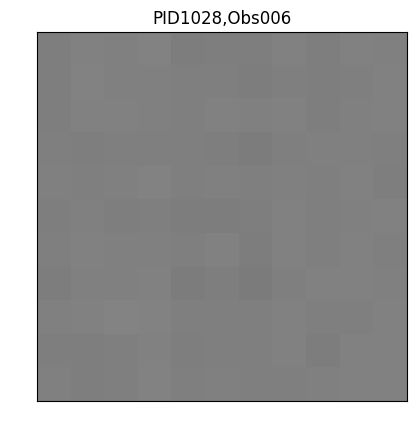

In [37]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
plt.title('PID1028,Obs006')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [38]:
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

# Get PSF from WebbPSF
jwst_obs = space_phot.observation2(lvl2)
psfs = space_phot.get_jwst_psf(jwst_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits
iterating query, tdelta=3.0



MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.86069511), array(559.08387297)) pixels


    Position 1/1 centroid: (121.51420939304742, 121.52381573784315)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


    Position 1/1 centroid: (121.5174643701714, 121.52330511426992)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


    Position 1/1 centroid: (121.51685314039858, 121.52145590349731)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


    Position 1/1 centroid: (121.51503596024747, 121.51983614651763)


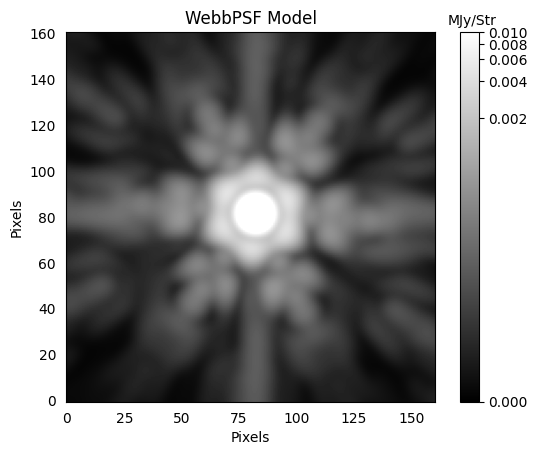

In [39]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)

plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

Finished PSF psf_photometry with median residuals of 138.25%


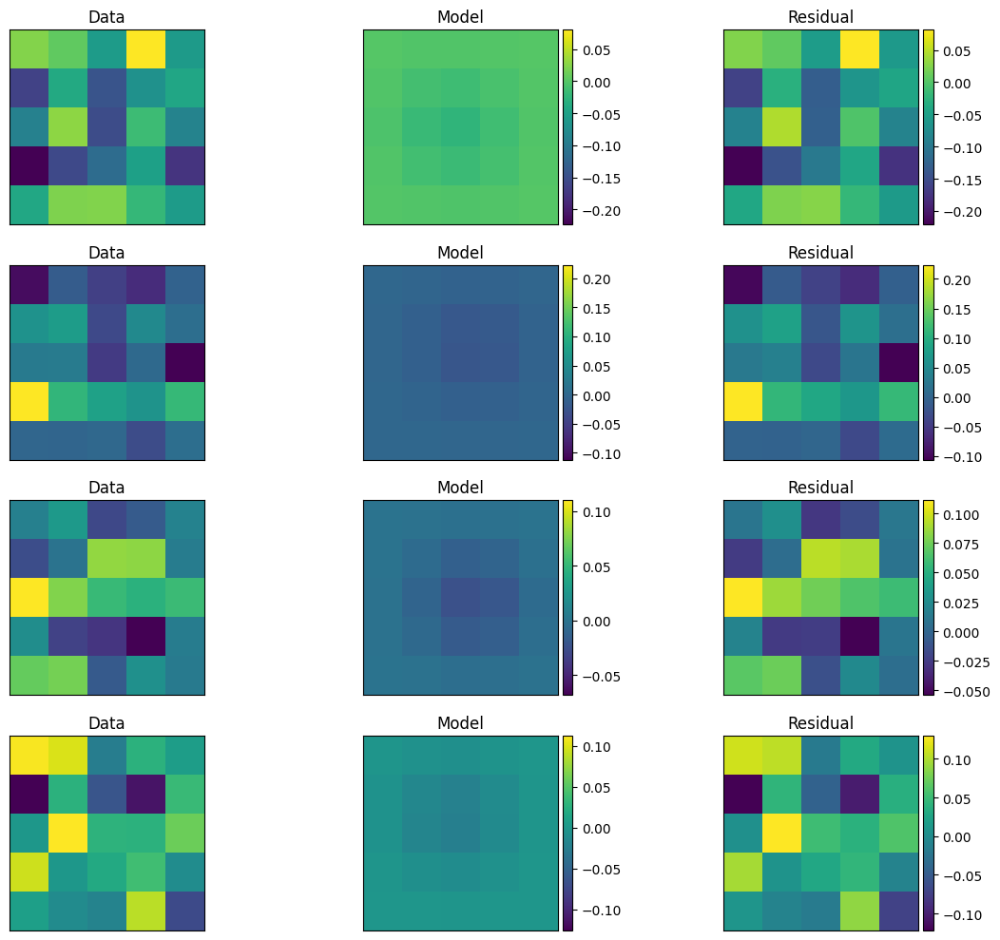

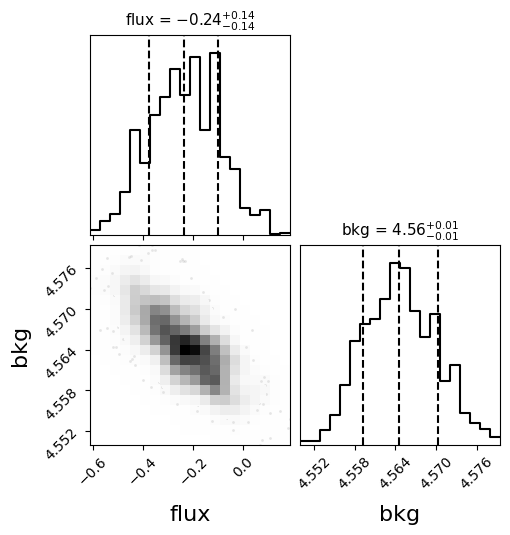

        ra         ...                     exp                    
------------------ ... -------------------------------------------
 265.7501383333533 ... jw01028006001_02101_00001_mirimage_cal.fits
 265.7501383333496 ... jw01028006001_02101_00002_mirimage_cal.fits
265.75013833334884 ... jw01028006001_02101_00003_mirimage_cal.fits
 265.7501383333493 ... jw01028006001_02101_00004_mirimage_cal.fits


In [40]:
# Do PSF Photometry using space_phot (details of fitting are in documentation)
# https://st-phot.readthedocs.io/en/latest/examples/plot_a_psf.html#jwst-images
jwst_obs.psf_photometry(
    psfs,
    source_location,
    bounds={
        'flux': [-10, 1000],
        'bkg': [0, 50],
    },
    fit_width=5,
    fit_bkg=True,
    fit_centroid='fixed',
    fit_flux='single'
)
jwst_obs.plot_psf_fit()
plt.show()

jwst_obs.plot_psf_posterior(minweight=.0005)
plt.show()

print(jwst_obs.psf_result.phot_cal_table)

In [41]:
# As noted above, As a result, the flux and corresponding error take into account a single overall fit. 
# Therefore, there is no need to average the resulting magnitudes or errors. They should all be the same to within their individual zero-point differences (typically <1%).

# Print Upper Limits
magupper_lvl2psf = jwst_obs.upper_limit(nsigma=5)
magupper_lvl2psf

array([25.61655762, 25.61655763, 25.61655763, 25.61655762])

### 4.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="fso3"></a> ###

In [42]:
# Level3 data file the same as above.
lvl3

['mast/01028/jw01028-o006_t001_miri_f770w_i2d.fits']

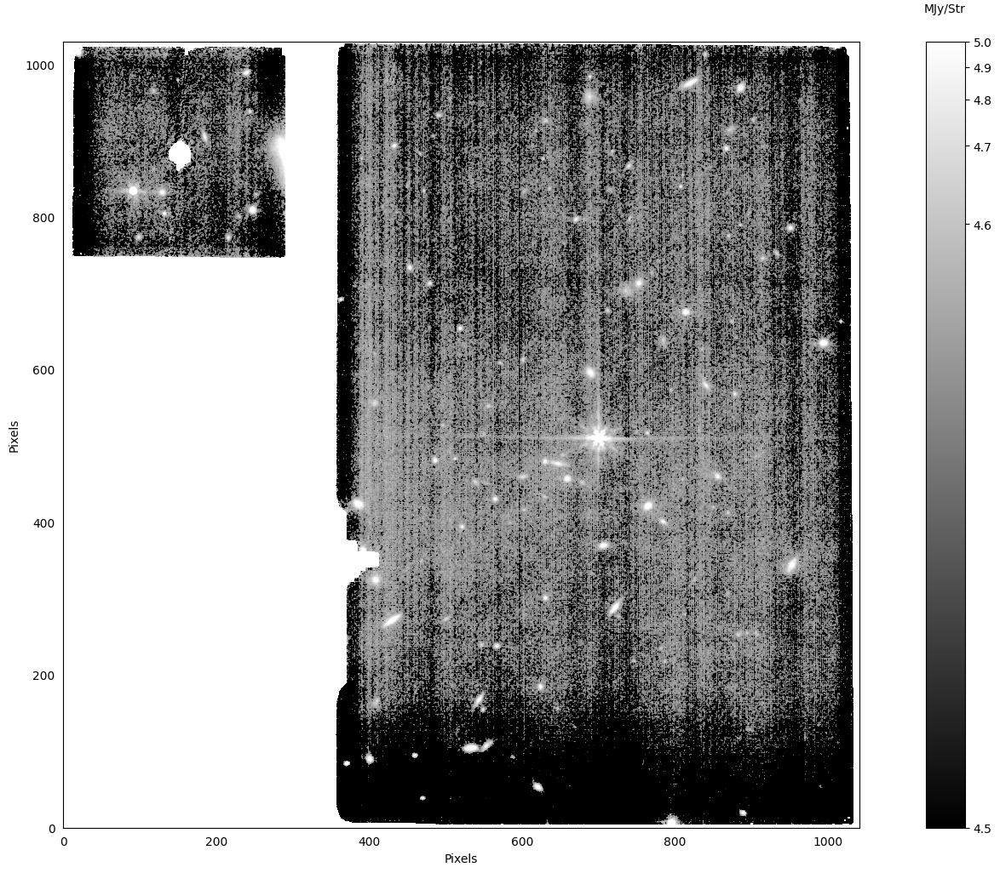

In [43]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_data, stretch='log', min_cut=4.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

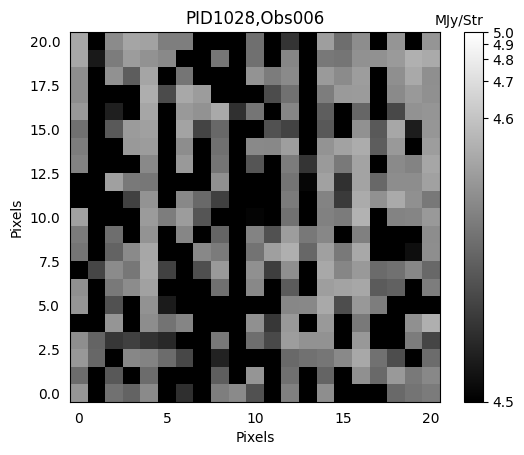

In [44]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))
ref_wcs = ref_fits.get_fits_wcs()
ref_y, ref_x = skycoord_to_pixel(source_location, ref_wcs)
ref_cutout = extract_array(ref_data, (21, 21), (ref_x, ref_y))

# The scale should highlight the background noise so it is possible to see all faint sources.
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=4.5, max_cut=5)
plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('PID1028,Obs006')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

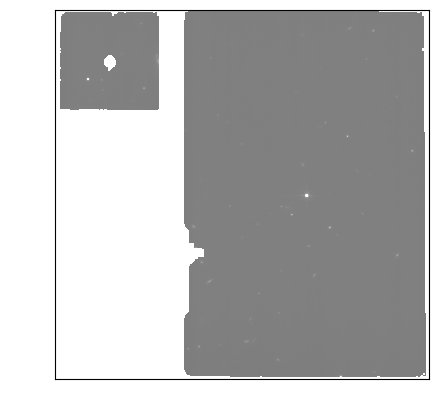

In [45]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]
ref_fits = fits.open(ref_image)
ref_data = fits.open(ref_image)['SCI', 1].data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

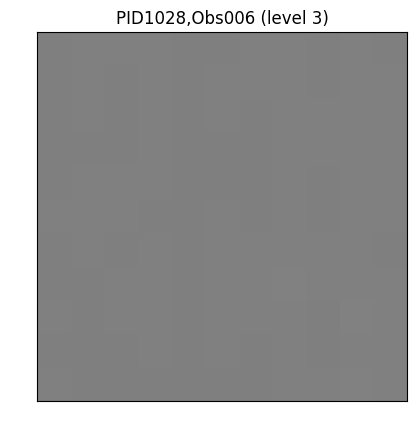

In [46]:
# Pick a blank part of the sky to calculate the upper limit
source_location = SkyCoord('17:43:00.0332', '+66:54:42.677', unit=(u.hourangle, u.deg))

ref_y, ref_x = skycoord_to_pixel(source_location, wcs.WCS(ref_fits['SCI', 1], ref_fits))
ref_cutout = extract_array(ref_data, (11, 11), (ref_x, ref_y))
norm1 = simple_norm(ref_cutout, stretch='linear', min_cut=-1, max_cut=10)

plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
plt.title('PID1028,Obs006 (level 3)')
plt.gca().tick_params(labelcolor='none', axis='both', color='none')
plt.show()

In [47]:
# The function get_jwst_psf is a space_phot wrapper for the WebbPSF calc_psf function and uses a lot of the same keywords.
# There are more advanced methods for generating your WebbPSF, but those are beyond the scope of this notebook.
# The defaults used by get_jwst_psf in this notebook are:
# oversample=4
# normalize='last'
# Non-distorted PSF
# Useful reference: https://webbpsf.readthedocs.io/en/latest/api/webbpsf.JWInstrument.html#webbpsf.JWInstrument.calc_psf

# Get PSF from WebbPSF
jwst3_obs = space_phot.observation3(lvl3[0])
psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location)

Setting up sim to match ./mast/01028/jw01028006001_02101_00001_mirimage_cal.fits


iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-05-25T01:14:08.073
                        MJD: 59724.05148232639

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022052501-NRCA3_FP1-59.fits
	Date (MJD):	 59723.8076
	Delta time:	 -0.2439 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022052701-NRCA3_FP1-0.fits
	Date (MJD):	 59726.0139
	Delta time:	 1.9624 days
User requested choosing OPD time closest in time to 2022-05-25T01:14:08.073, which is O2022052501-NRCA3_FP1-59.fits, delta time -0.244 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/O2022052501-NRCA3_FP1-59.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F770W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.86069511), array(559.08387297)) pixels


    Position 1/1 centroid: (201.51420939304728, 201.52381573784302)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(772.32944238), array(571.63330681)) pixels


    Position 1/1 centroid: (201.5174643701711, 201.52330511426985)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(767.30763827), array(569.1357543)) pixels


    Position 1/1 centroid: (201.51685314039872, 201.5214559034972)

Running instrument: MIRI, filter: F770W
  Running detector: MIRIM
    Position 1/1: (array(762.80321923), array(562.61868067)) pixels


    Position 1/1 centroid: (201.51503596024762, 201.51983614651743)


2024-12-10 20:17:18,426 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-12-10 20:17:18,428 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-12-10 20:17:18,430 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-12-10 20:17:18,432 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-12-10 20:17:18,434 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-12-10 20:17:18,435 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-12-10 20:17:18,436 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-12-10 20:17:18,633 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2024-12-10 20:17:18,647 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2024-12-10 20:17:18,647 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-12-10 20:17:19,119 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66aae650>,).


2024-12-10 20:17:19,120 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2024-12-10 20:17:19,976 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66aae650>,).


2024-12-10 20:17:19,977 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2024-12-10 20:17:20,275 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66aae650>,).


2024-12-10 20:17:20,276 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2024-12-10 20:17:20,622 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66aae650>,).


2024-12-10 20:17:20,624 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:17:20,624 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:17:20,625 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:17:20,625 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:17:20,627 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:17:20,628 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:17:20,629 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:17:20,629 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:17:20,631 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:17:20,631 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:17:20,632 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:17:20,632 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:17:20,634 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:17:20,634 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:17:20,635 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:17:20,635 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:17:20,637 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-12-10 20:17:20,637 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-12-10 20:17:20,638 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-12-10 20:17:20,638 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-12-10 20:17:20,639 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11091579557784445 arcsec.


2024-12-10 20:17:20,730 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-12-10 20:17:21,256 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:17:22,042 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:17:22,814 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:17:23,600 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1030, 1042)


2024-12-10 20:17:24,264 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-12-10 20:17:24,266 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,267 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,268 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,268 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,269 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,269 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,270 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,271 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,271 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,272 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,273 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,273 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01028006001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:17:24,293 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  265.737936402 66.941000865 265.701076764 66.912745077 265.773940411 66.898123015 265.810862277 66.926361876


2024-12-10 20:17:24,736 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2024-12-10 20:17:24,736 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-12-10 20:17:24,928 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1030, 1042) from temp_psf_cals_i2d.fits>,).


2024-12-10 20:17:24,929 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2024-12-10 20:17:24,934 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-12-10 20:17:24,934 - stpipe - INFO - Results used jwst version: 1.16.1


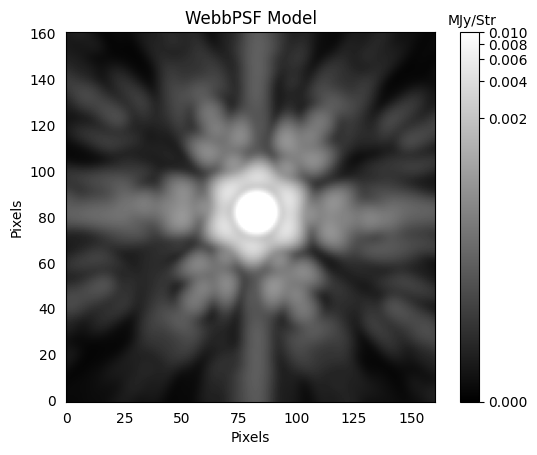

In [48]:
# The scale should highlight the background noise so it is possible to see all faint sources.
ref_cutout = extract_array(psf3.data, (161, 161), (200, 200))
norm1 = simple_norm(ref_cutout, stretch='log', min_cut=0.0, max_cut=0.01)

plt.imshow(ref_cutout, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.title('WebbPSF Model')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.gca().tick_params(axis='both', color='none')
plt.show()

Finished PSF psf_photometry with median residuals of -11.44%


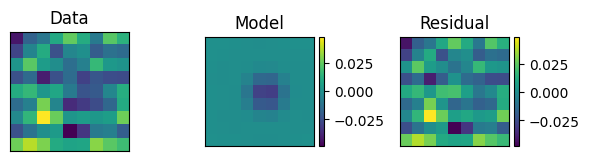

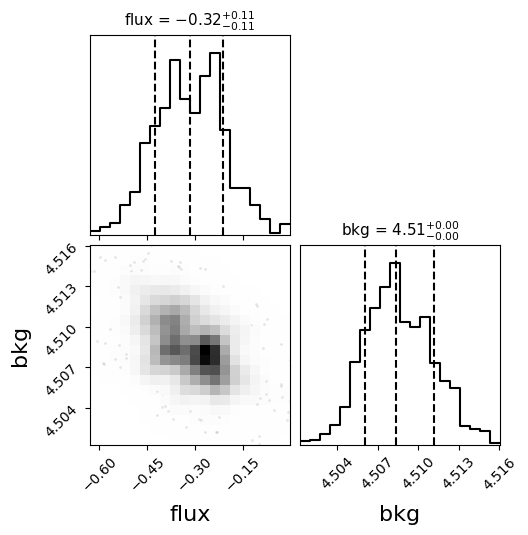

In [49]:
jwst3_obs.psf_photometry(
    psf3,
    source_location,
    bounds={
        'flux': [-1000, 1000],
        'bkg': [0, 50],
    },
    fit_width=9,
    fit_bkg=True,
    fit_centroid=False,
    fit_flux=True
)

jwst3_obs.plot_psf_fit()
plt.show()

jwst3_obs.plot_psf_posterior(minweight=.0005)
plt.show()

In [50]:
magupper_lvl3psf = jwst3_obs.upper_limit(nsigma=5)
print(round(magupper_lvl2psf[0], 4))
print(round(magupper_lvl3psf[0], 5))

25.6166
25.88997


## Note you can go significantly deeper with the Level3 combined data product

5.<font color='white'>-</font>Stellar Field (LMC)<a class="anchor" id="lmc"></a>
------------------

#### In this case, we are going to do the same steps as in Section 3, but for multiple stars. The purpose is to illustrate the workflow and runtime for using space_phot on a large number of stars. We suggest that space_phot may be less optimal for large numbers of bright stars. Other programs, such as DOLPHOT or Photutils, may be better suited for this use case. The primary advantage to space_phot is on faint, single sources. But it can be extended to a larger number if desired.

### 5.1<font color='white'>-</font>Multiple, Level2 Files<a class="anchor" id="lmc2"></a> ###

##### Now do the same thing for a larger group of stars and test for speed

In [51]:
# Level 3 Files
lvl3 = ["./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits"]
lvl3

['./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits']

In [52]:
# Level 2 Files
lvl2 = glob.glob('./mast/01171/jw01171004*cal.fits')
lvl2

['./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00001_mirimage_cal.fits']

In [53]:
# Find Stars in Level 3 File

# Get rough estimate of background (There are Better Ways to Do Background Subtraction)
bkgrms = MADStdBackgroundRMS()
mmm_bkg = MMMBackground()

ref_fits = ImageModel(lvl3[0])
w = ref_fits.get_fits_wcs()

std = bkgrms(ref_fits.data)
bkg = mmm_bkg(ref_fits.data)
data_bkgsub = ref_fits.data.copy()
data_bkgsub -= bkg        
fwhm_psf = 1.882 # pixels for F560W
threshold = 5.

daofind = DAOStarFinder(threshold=threshold * std, fwhm=fwhm_psf, exclude_border=True, min_separation=10)

found_stars = daofind(data_bkgsub)

In [54]:
found_stars.pprint_all(max_lines=10)

 id     xcentroid          ycentroid          sharpness       roundness1      roundness2      npix sky         peak               flux                mag         
--- ------------------ ------------------ ------------------ ----------- -------------------- ---- --- ------------------- ------------------ --------------------
  1  546.2615248590856   5.40090706700177 0.7041937380599614  0.46773428  0.04273256330788055   25 0.0 -0.8653272390365601 1.6463868618011475  -0.5413297293846483
  2  789.0983970730795  6.312157835017226 0.6691237944354219 -0.17942303  -0.8079555096758742   25 0.0 -0.5761210918426514 1.1000438928604126 -0.10352503572911273
  3  845.9799634503643 3.6757970986043205 0.6829976607805458 0.043498766 -0.42254093349077776   25 0.0  -1.171976923942566 1.1794757843017578 -0.17922257214246215
...                ...                ...                ...         ...                  ...  ... ...                 ...                ...                  ...
788 1005.1187213604594

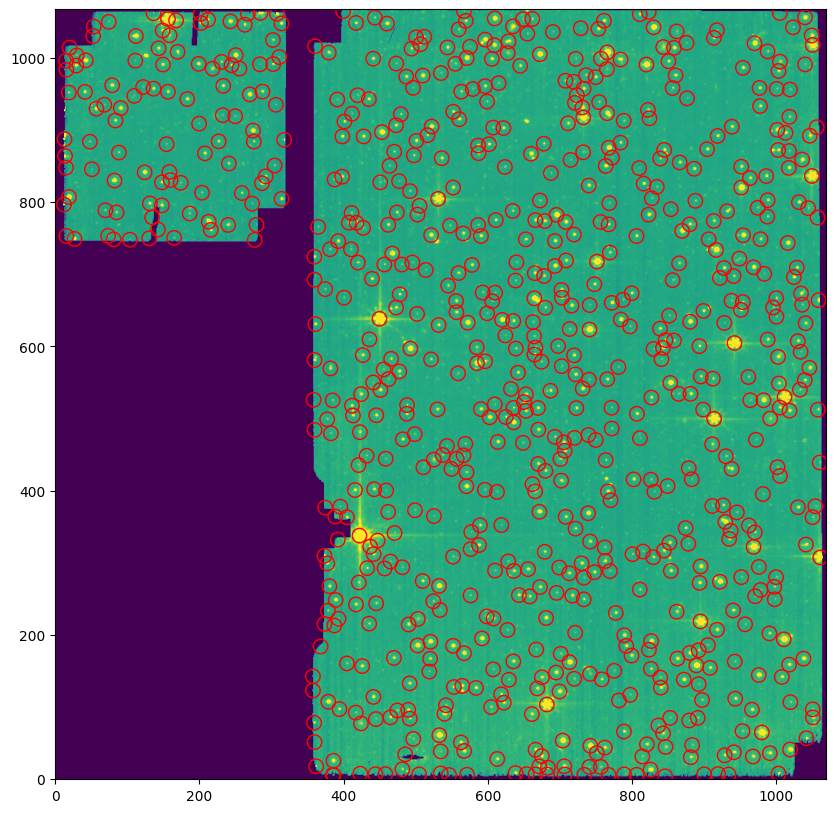

In [55]:
# plot the found stars
norm = simple_norm(data_bkgsub, 'sqrt', percent=99)
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(data_bkgsub, origin='lower', norm=norm)

xypos = zip(found_stars['xcentroid'], found_stars['ycentroid'])
aper = CircularAperture(xypos, r=10)
aper.plot(ax, color='red')

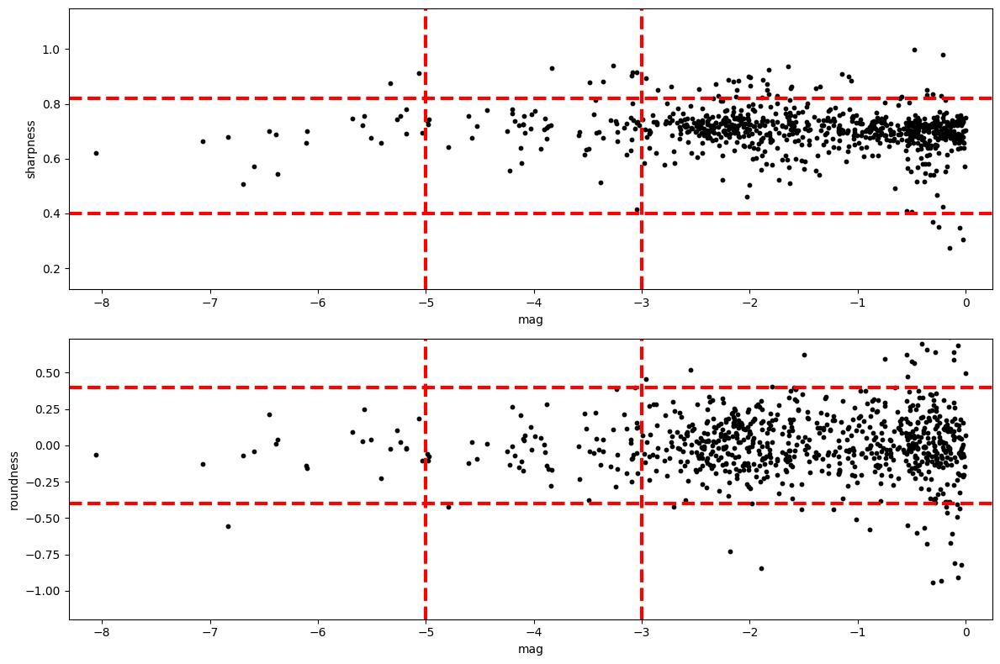

In [56]:
# Filter out only stars you want
plt.figure(figsize=(12, 8))
plt.clf()

ax1 = plt.subplot(2, 1, 1)

ax1.set_xlabel('mag')
ax1.set_ylabel('sharpness')

xlim0 = np.min(found_stars['mag']) - 0.25
xlim1 = np.max(found_stars['mag']) + 0.25
ylim0 = np.min(found_stars['sharpness']) - 0.15
ylim1 = np.max(found_stars['sharpness']) + 0.15

ax1.set_xlim(xlim0, xlim1)
ax1.set_ylim(ylim0, ylim1)

ax1.scatter(found_stars['mag'], found_stars['sharpness'], s=10, color='k')

sh_inf = 0.40
sh_sup = 0.82
#mag_lim = -5.0
lmag_lim = -3.0
umag_lim = -5.0

ax1.plot([xlim0, xlim1], [sh_sup, sh_sup], color='r', lw=3, ls='--')
ax1.plot([xlim0, xlim1], [sh_inf, sh_inf], color='r', lw=3, ls='--')
ax1.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax1.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

ax2 = plt.subplot(2, 1, 2)

ax2.set_xlabel('mag')
ax2.set_ylabel('roundness')

ylim0 = np.min(found_stars['roundness2']) - 0.25
ylim1 = np.max(found_stars['roundness2']) - 0.25

ax2.set_xlim(xlim0, xlim1)
ax2.set_ylim(ylim0, ylim1)

round_inf = -0.40
round_sup = 0.40

ax2.scatter(found_stars['mag'], found_stars['roundness2'], s=10, color='k')

ax2.plot([xlim0, xlim1], [round_sup, round_sup], color='r', lw=3, ls='--')
ax2.plot([xlim0, xlim1], [round_inf, round_inf], color='r', lw=3, ls='--')
ax2.plot([lmag_lim, lmag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')
ax2.plot([umag_lim, umag_lim], [ylim0, ylim1], color='r', lw=3, ls='--')

plt.tight_layout()

In [57]:
mask = ((found_stars['mag'] < lmag_lim) & (found_stars['mag'] > umag_lim) & (found_stars['roundness2'] > round_inf)
        & (found_stars['roundness2'] < round_sup) & (found_stars['sharpness'] > sh_inf) 
        & (found_stars['sharpness'] < sh_sup) & (found_stars['xcentroid'] > 100) & (found_stars['xcentroid'] < 700)
        & (found_stars['ycentroid'] > 100) & (found_stars['ycentroid'] < 700))

found_stars_sel = found_stars[mask]

print('Number of stars found originally:', len(found_stars))
print('Number of stars in final selection:', len(found_stars_sel))

Number of stars found originally: 790
Number of stars in final selection: 13


In [58]:
found_stars_sel

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int64,float64,float64,float64,float32,float64,int64,float64,float64,float64,float64
86,378.7558816433192,106.99517231293703,0.7364077918416378,-0.059391562,-0.06704534345138508,25,0.0,51.20432662963867,46.88838195800781,-4.177663115498585
93,699.4285739316663,121.30618337045195,0.6621937635659819,-0.45228603,-0.16121600597523705,25,0.0,21.92721176147461,19.500816345214844,-3.2251319805603025
138,502.6449423284217,185.07660708931144,0.6351195098960691,-0.36937103,-0.37435640137051696,25,0.0,30.200824737548828,24.987716674804688,-3.4943164325492058
141,520.4512004466732,190.2476066884721,0.8012885262482311,0.30771914,-0.08561803159241342,25,0.0,23.034168243408203,17.149253845214844,-3.085613072177968
144,591.9599066066671,194.8718750798144,0.7334114841843143,-0.36179662,-0.19144805342168533,25,0.0,21.18755340576172,16.44730567932129,-3.0402369100553313
169,388.990541620123,248.15789451654376,0.7118823356707229,0.16915432,0.21323040806731455,25,0.0,19.440757751464844,18.429296493530273,-3.1637718927398666
183,532.3925923035418,267.74287686139763,0.7174778066738734,-0.2787835,-0.16201501039505897,25,0.0,43.17793273925781,35.05239486694336,-3.8617942384933013
249,671.5101306788192,370.56221568412315,0.6690541020715319,0.22694585,-0.2501719039312765,25,0.0,21.814945220947266,17.284053802490234,-3.09411402382609
314,635.9221063124252,494.5522379657613,0.8149770327504342,-0.12416268,0.22344203180037933,25,0.0,29.927074432373047,23.478647232055664,-3.426682676437008


In [59]:
# Convert pixel to wcs coords
skycoords = w.pixel_to_world(found_stars_sel['xcentroid'], found_stars_sel['ycentroid'])
len(skycoords)

13

In [60]:
# Change all DQ flagged pixels to NANs
for file in lvl2:
    ref_fits = ImageModel(file)
    data = ref_fits.data
    dq = ref_fits.dq
    data[dq >= 10] = np.nan
    ref_fits.data = data
    ref_fits.save(file)

In [61]:
# Create a grid for fast lookup using WebbPSF. The larger the number of grid points, the better the photometric precision.
# Developer note. Would be great to have a fast/approximate look up table. 
jwst_obs = space_phot.observation2(lvl2)
grid = space_phot.util.get_jwst_psf_grid(jwst_obs, num_psfs=16)

Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days

 [Done]


Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/16: (0, 0) pixels


    Position 1/16 centroid: (201.39896123096594, 201.57462168473992)
    Position 2/16: (0, 341) pixels


    Position 2/16 centroid: (201.27298326538994, 201.8122962916395)
    Position 3/16: (0, 682) pixels


    Position 3/16 centroid: (201.26092649151903, 201.8273016561088)
    Position 4/16: (0, 1023) pixels


    Position 4/16 centroid: (201.30665784716913, 201.41346936543644)
    Position 5/16: (341, 0) pixels


    Position 5/16 centroid: (201.38945973576688, 201.62934762823934)
    Position 6/16: (341, 341) pixels


    Position 6/16 centroid: (201.48863769451324, 201.63972936419177)
    Position 7/16: (341, 682) pixels


    Position 7/16 centroid: (201.48210765199016, 201.6080741598635)
    Position 8/16: (341, 1023) pixels


    Position 8/16 centroid: (201.42818621943198, 201.61327684523178)
    Position 9/16: (682, 0) pixels


    Position 9/16 centroid: (201.405459701244, 201.64424228029097)
    Position 10/16: (682, 341) pixels


    Position 10/16 centroid: (201.52251762658082, 201.5881287591983)
    Position 11/16: (682, 682) pixels


    Position 11/16 centroid: (201.57423502982945, 201.5553583383486)
    Position 12/16: (682, 1023) pixels


    Position 12/16 centroid: (201.584920185908, 201.6735683999315)
    Position 13/16: (1023, 0) pixels


    Position 13/16 centroid: (201.44216164335302, 201.69986266797625)
    Position 14/16: (1023, 341) pixels


    Position 14/16 centroid: (201.51032408676687, 201.68044889871803)
    Position 15/16: (1023, 682) pixels


    Position 15/16 centroid: (201.62018700397059, 201.66506320800642)
    Position 16/16: (1023, 1023) pixels


    Position 16/16 centroid: (201.77312450805107, 201.60334597442935)
  Saving file: miri_mirim_f560w_fovp101_samp4_npsf16.fits


In [62]:
t = QTable([skycoords], names=["skycoord"])
t.write('skycoord.ecsv', overwrite=True)

Starting 1.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.68751895, -69.44522201)>


[1.869825303554535, nan, 1.875230292270058, nan]


Finished PSF psf_photometry with median residuals of 1.76%


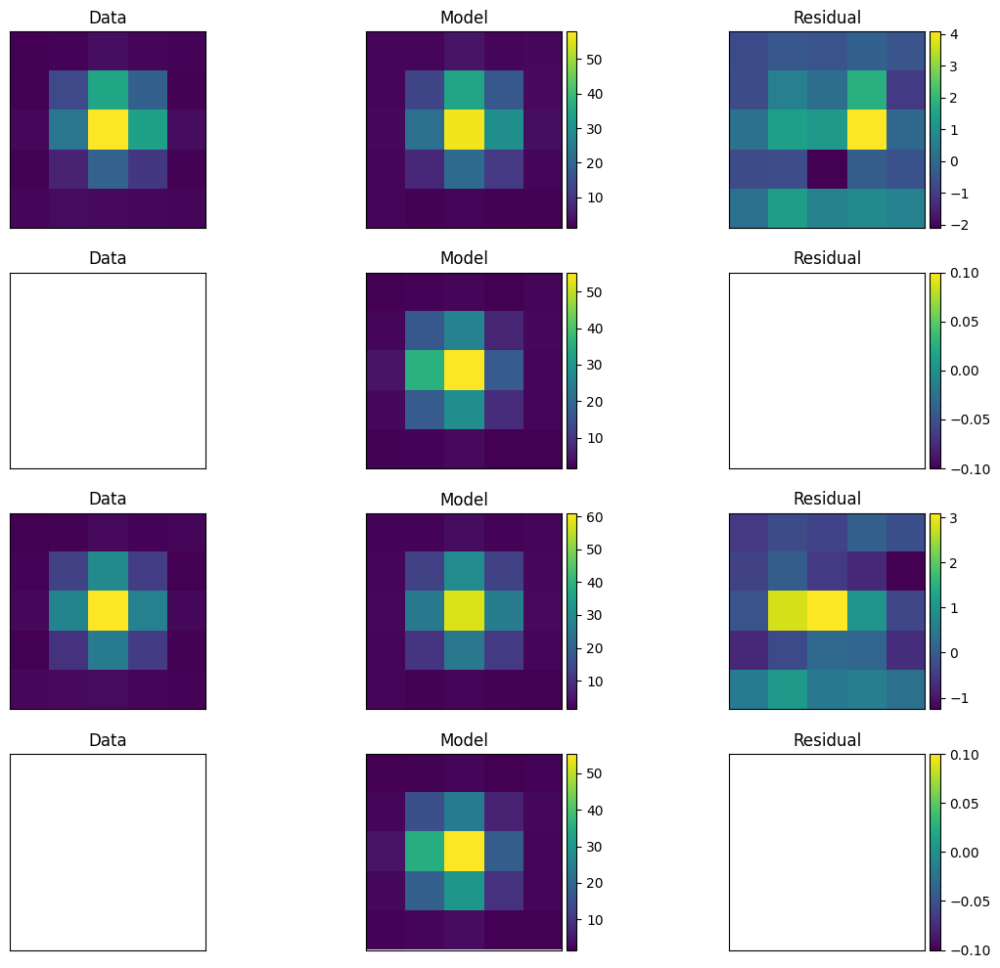

Finished PSF psf_photometry with median residuals of 1.70%


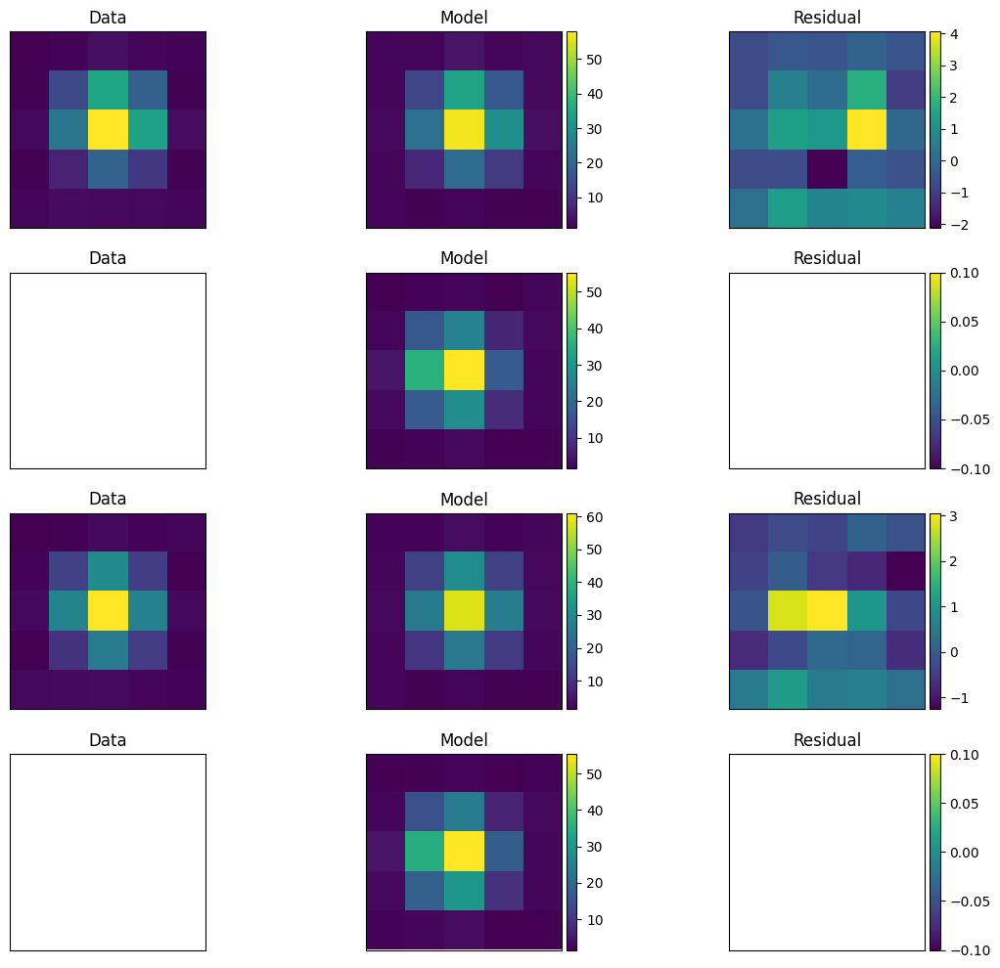

Elapsed Time for Photometry: 29.459651388999987
Starting 2.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70519786, -69.43753355)>


[1.7614484293419017, 1.8134855595066321, 1.7480259496590187, 1.943224255991454]


Finished PSF psf_photometry with median residuals of 3.74%


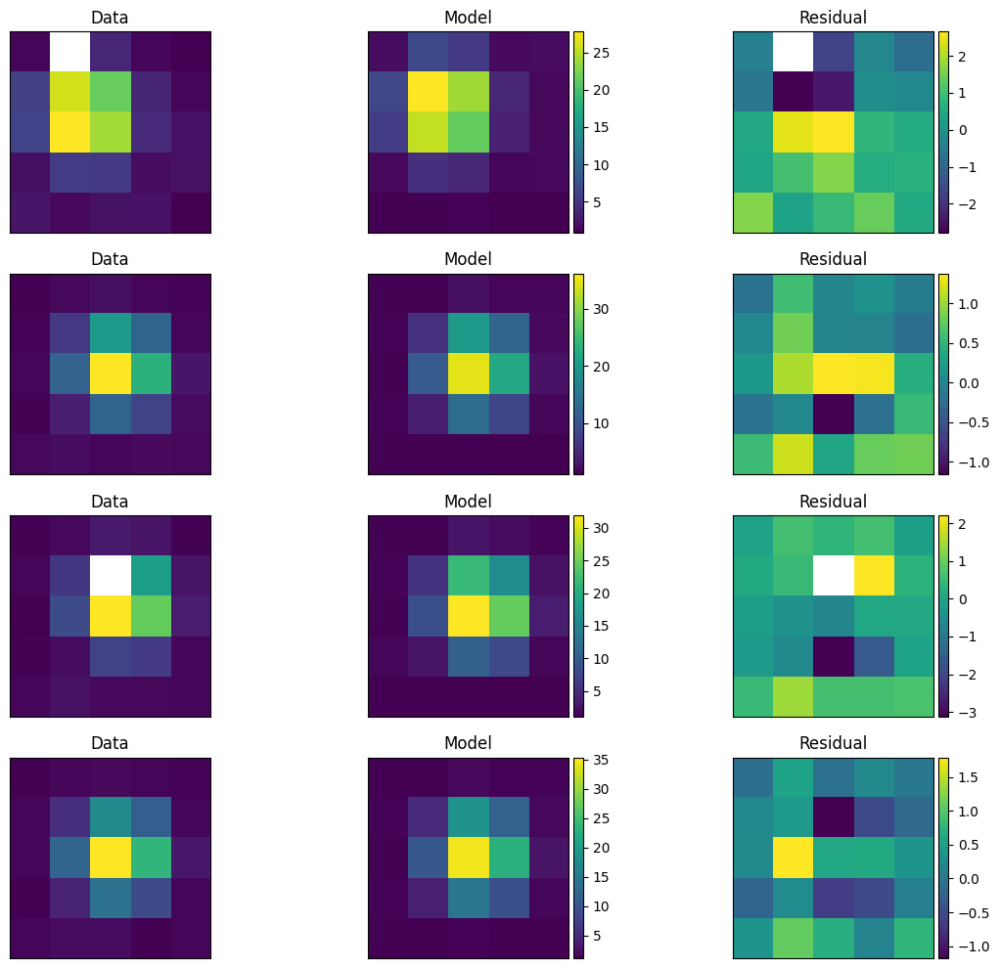

Finished PSF psf_photometry with median residuals of 3.71%


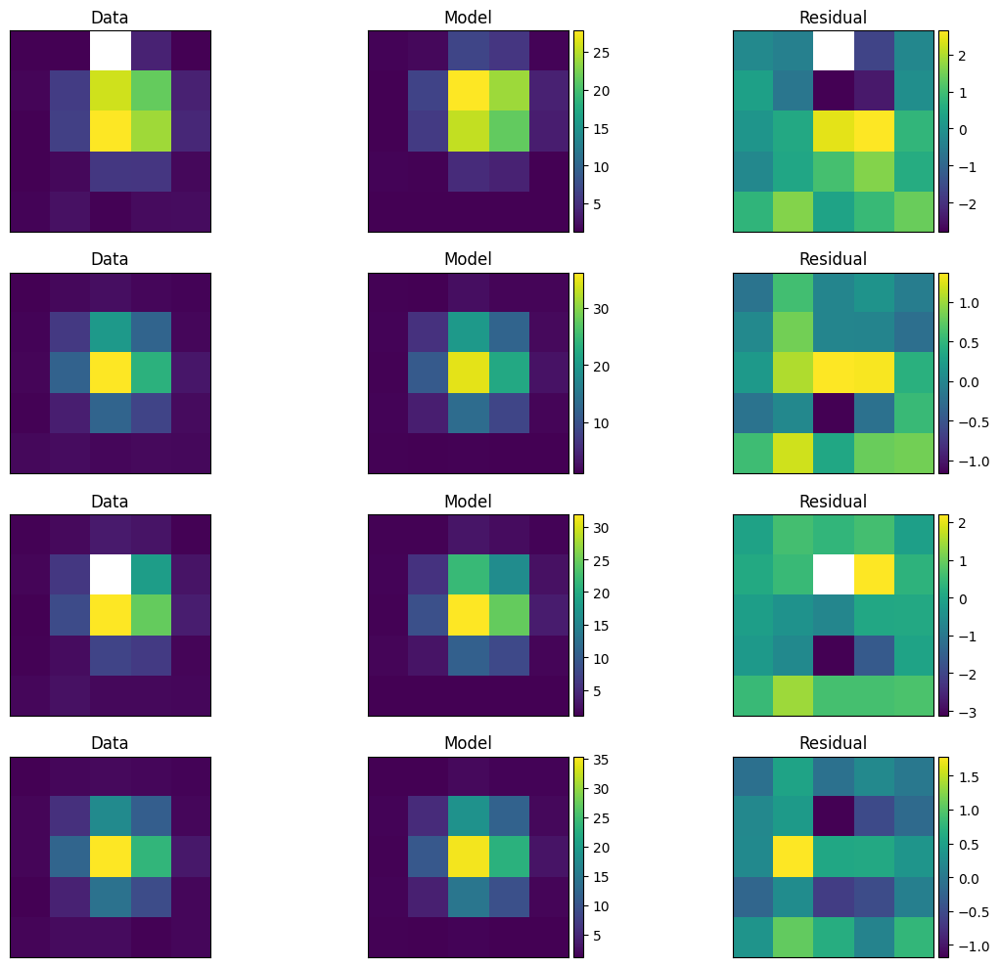

Elapsed Time for Photometry: 30.274453890000018
Starting 3.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.69947281, -69.44357619)>


[1.7704960215245196, 1.8189359360103365, 1.8464110786631958, 1.8683478434880576]


Finished PSF psf_photometry with median residuals of 1.12%


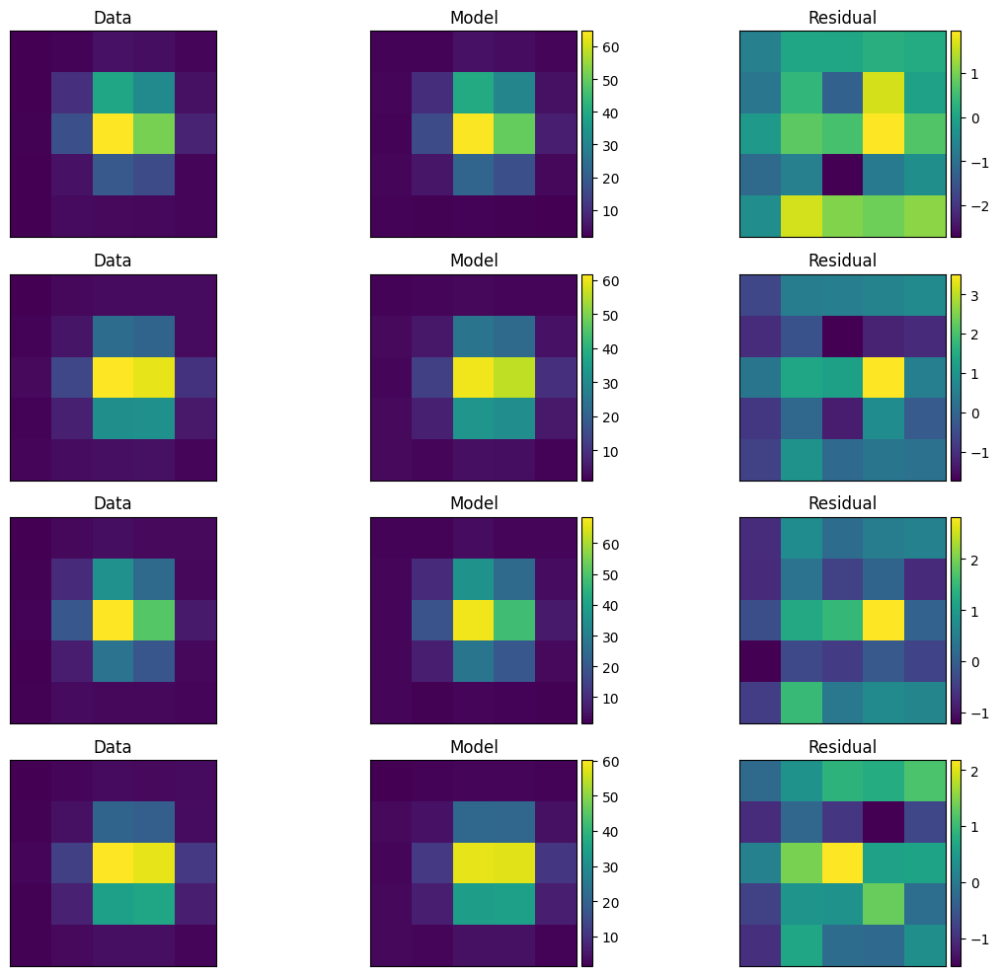

Finished PSF psf_photometry with median residuals of 1.12%


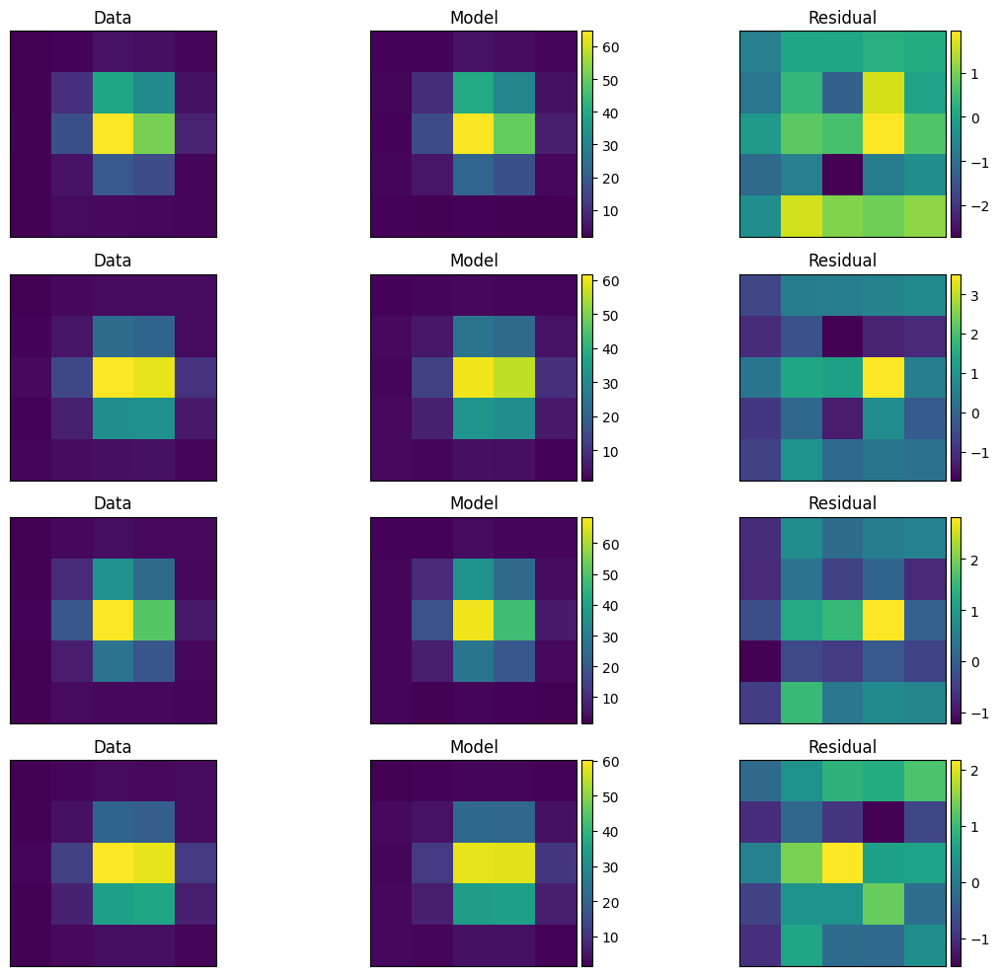

Elapsed Time for Photometry: 32.74837323199995
Starting 4.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70076349, -69.44322912)>


[1.7729037974078583, 1.7539834316196359, 1.8693315009785514, 1.8635000334623966]


Finished PSF psf_photometry with median residuals of 0.77%


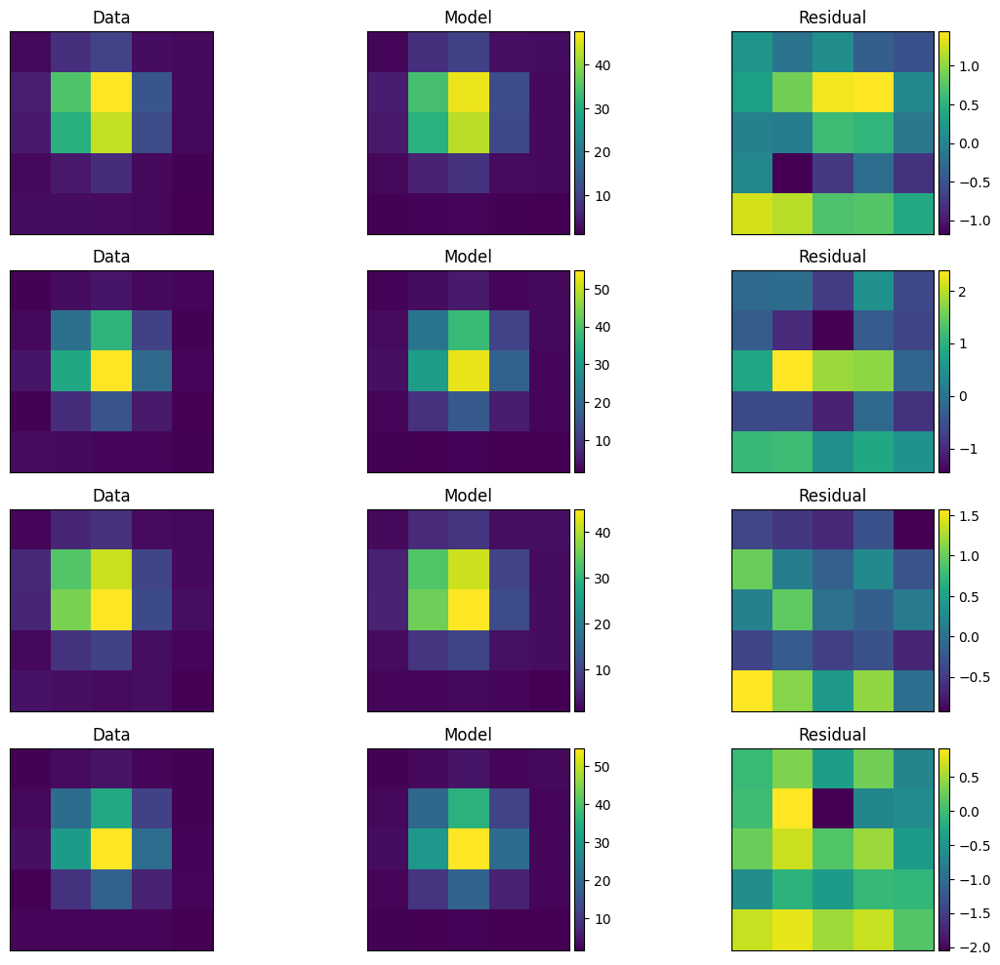

Finished PSF psf_photometry with median residuals of 0.79%


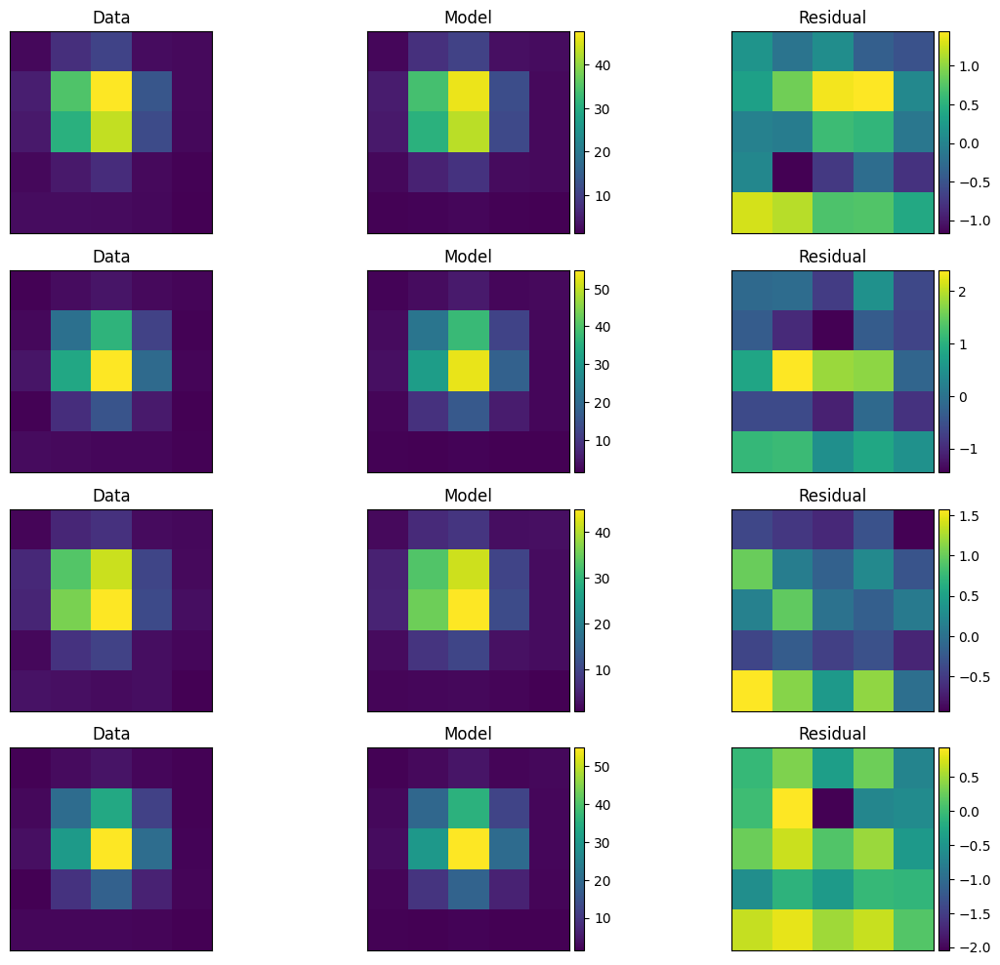

Elapsed Time for Photometry: 32.48154919800004
Starting 5.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70480666, -69.44154063)>


[1.829211658608597, 1.7340520685369318, 1.8180533992616752, 1.8822986582914987]


Finished PSF psf_photometry with median residuals of 2.44%


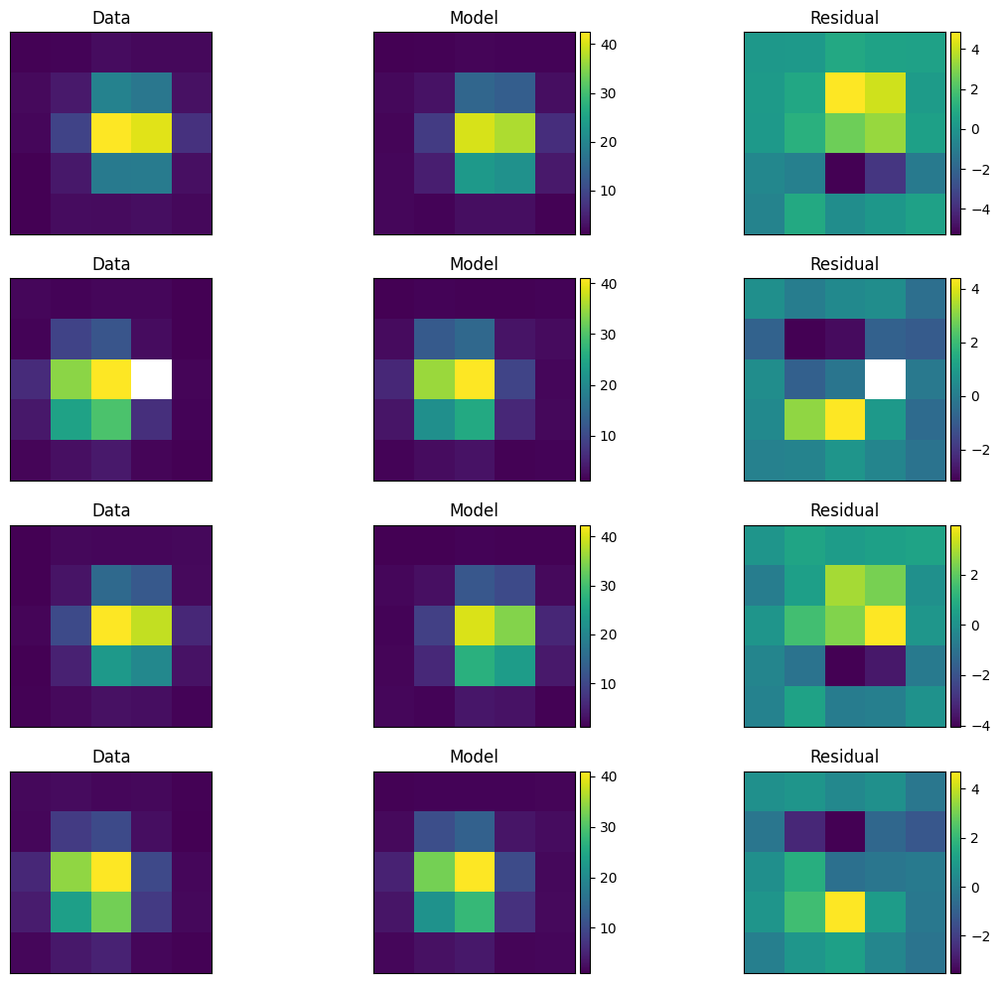

Finished PSF psf_photometry with median residuals of 2.42%


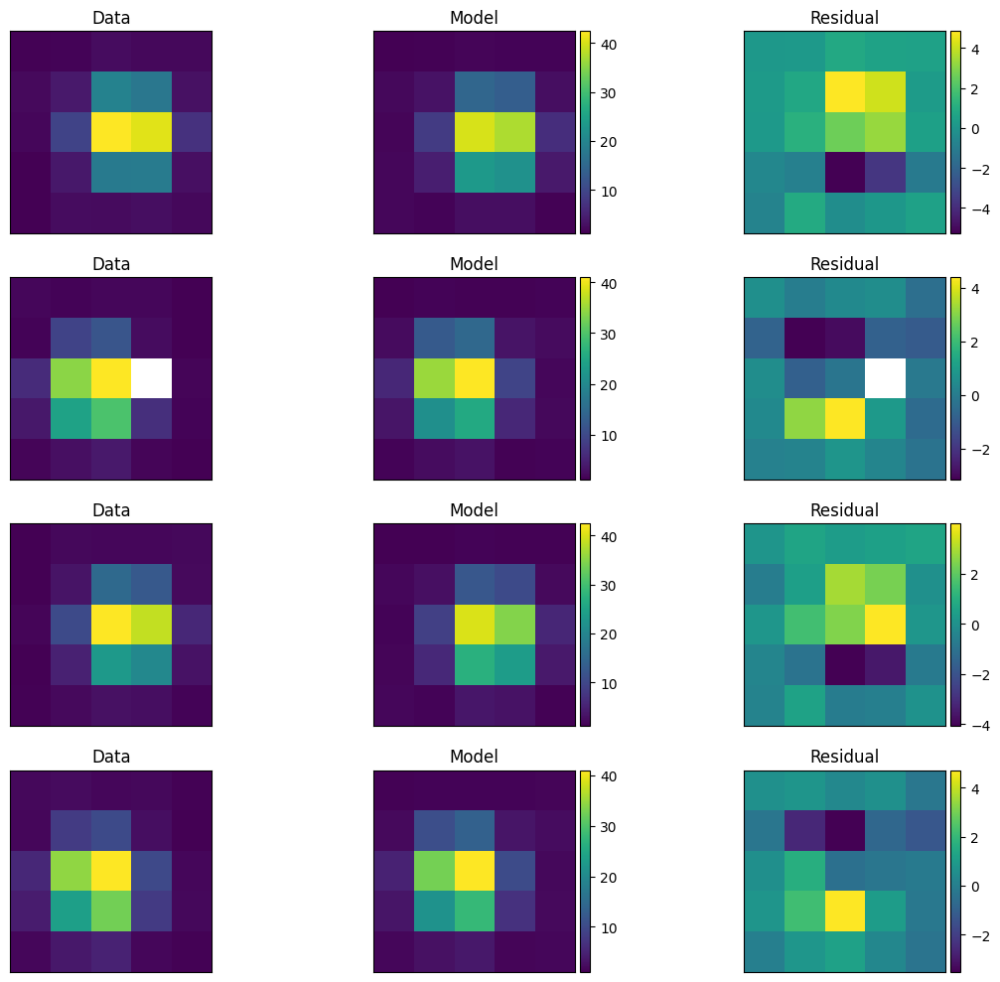

Elapsed Time for Photometry: 36.17453582300004
Starting 6.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.69801844, -69.44754524)>


[1.8947609114092452, nan, 1.8804607170599477, nan]


Finished PSF psf_photometry with median residuals of -0.27%


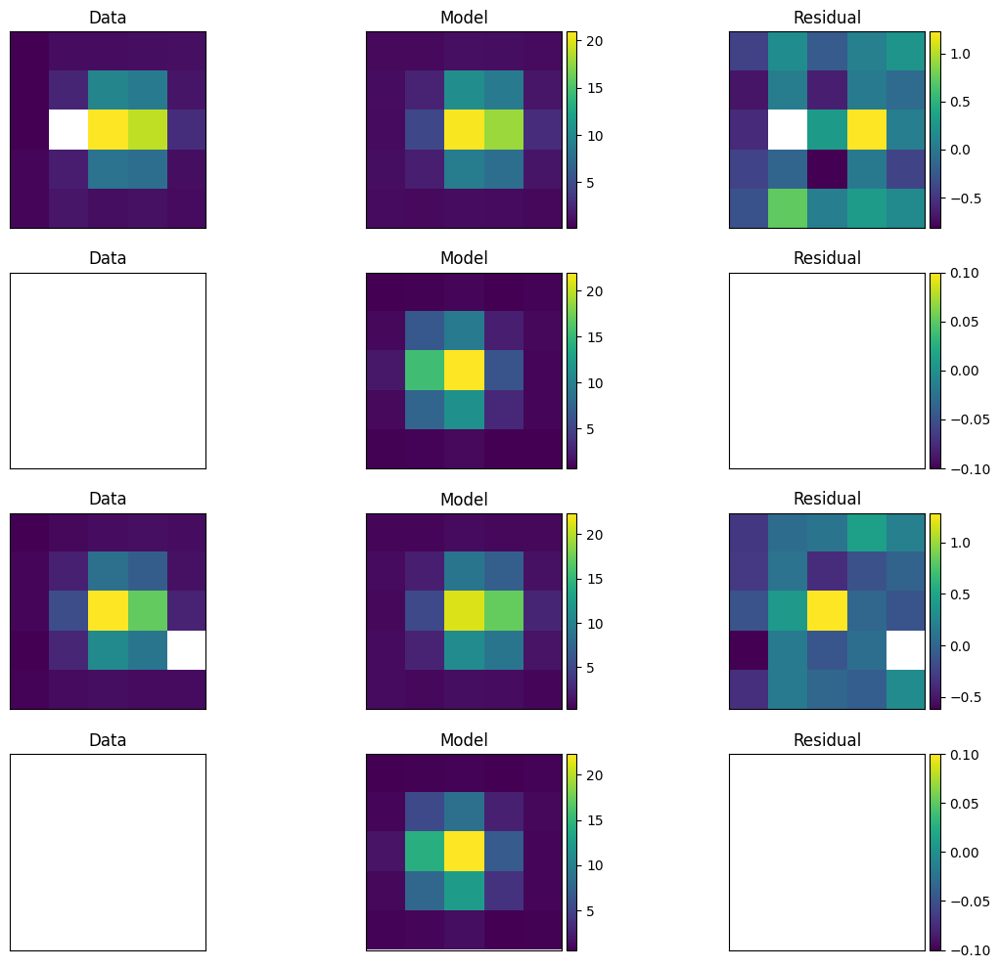

Finished PSF psf_photometry with median residuals of -0.27%


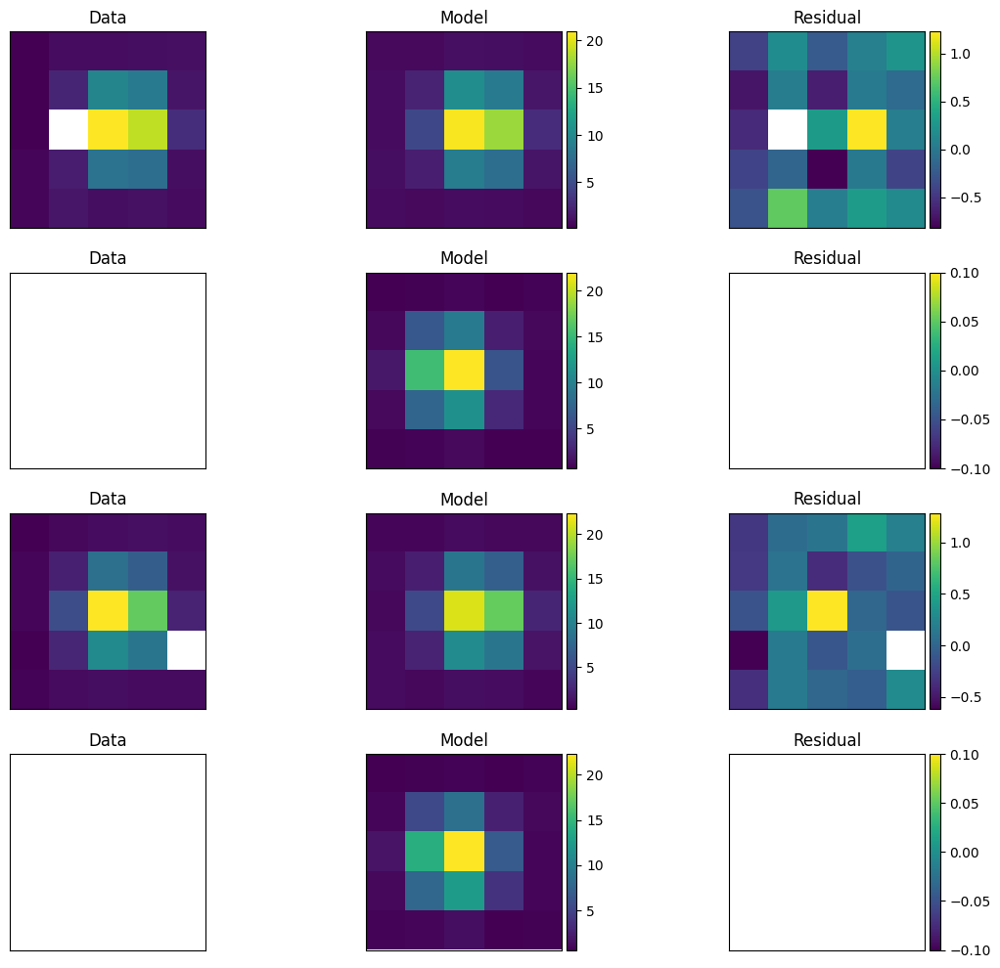

Elapsed Time for Photometry: 27.087839794000047
Starting 7.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70685609, -69.4443474)>


[1.7949211474651943, 1.8149203216207437, 1.7996749530022749, 1.9178177507027336]


Finished PSF psf_photometry with median residuals of 2.72%


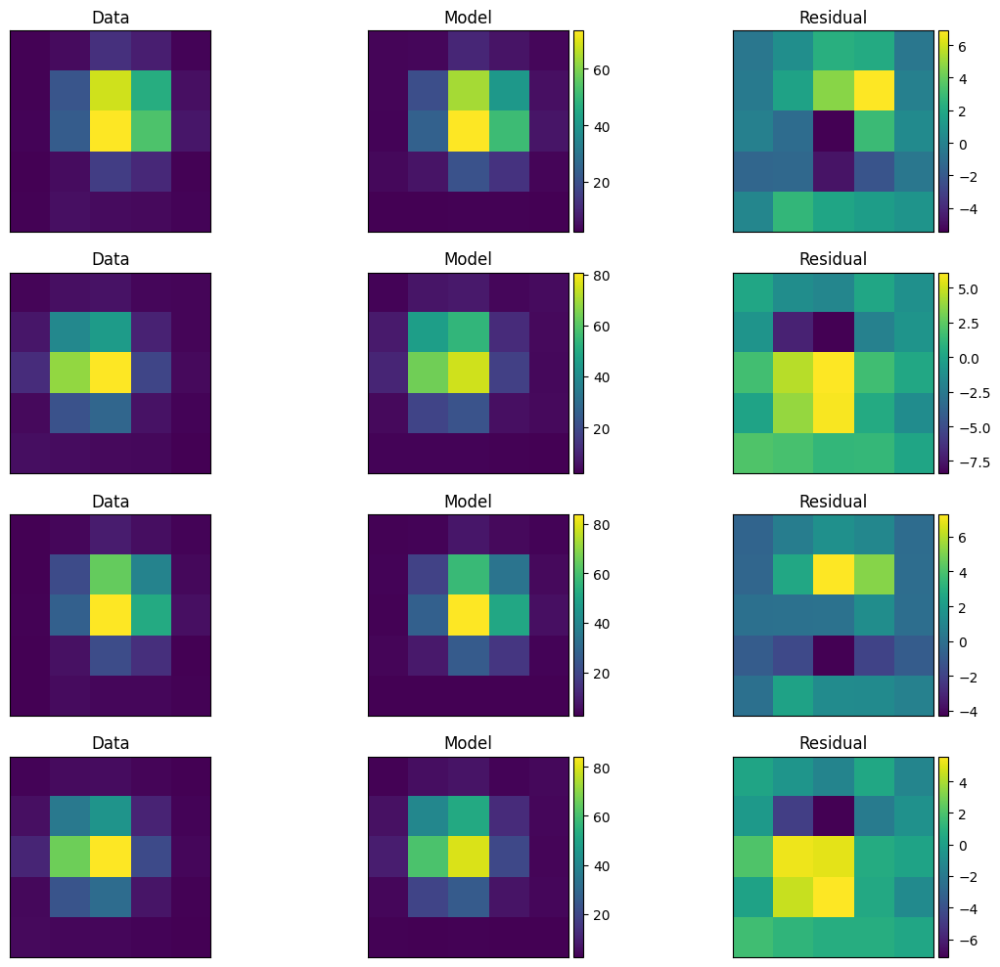

Finished PSF psf_photometry with median residuals of 2.71%


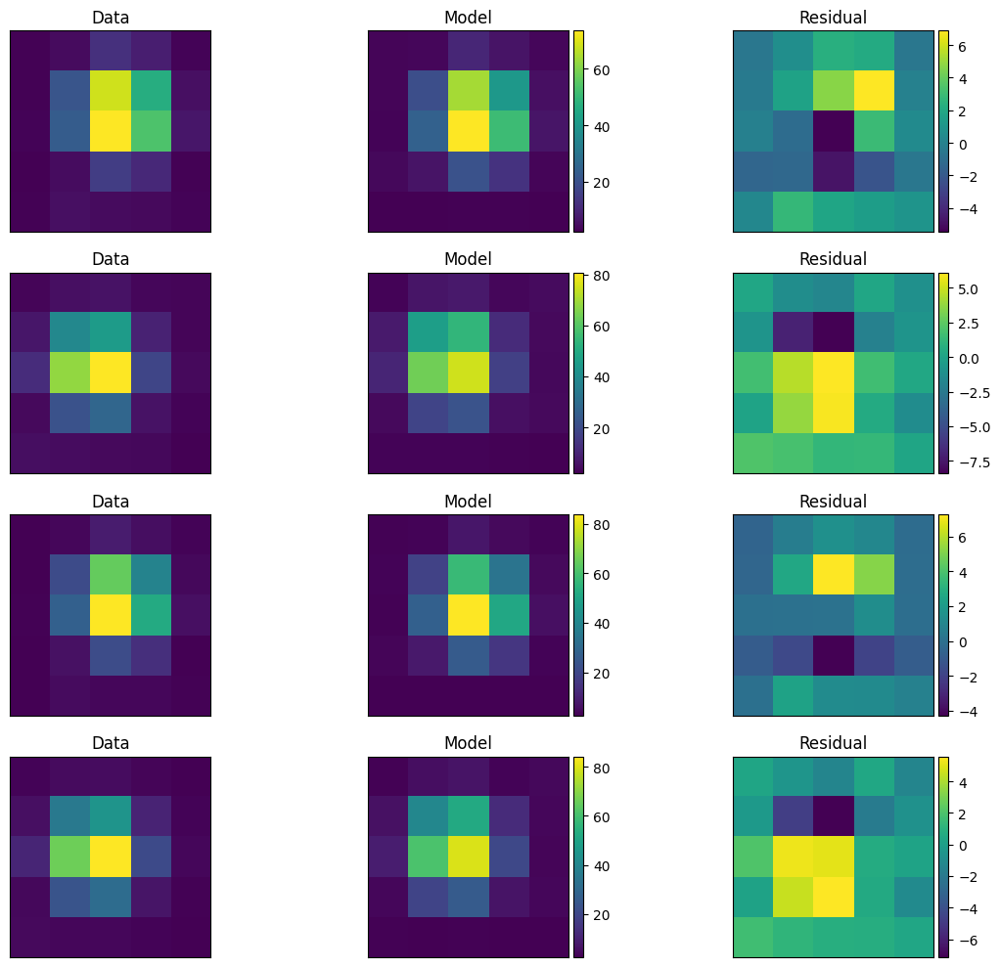

Elapsed Time for Photometry: 37.69532649600001
Starting 8.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72134618, -69.44277393)>


[1.9285976984921622, 1.8641873090163523, 1.9269168845723184, 1.8905765748860541]


Finished PSF psf_photometry with median residuals of 0.41%


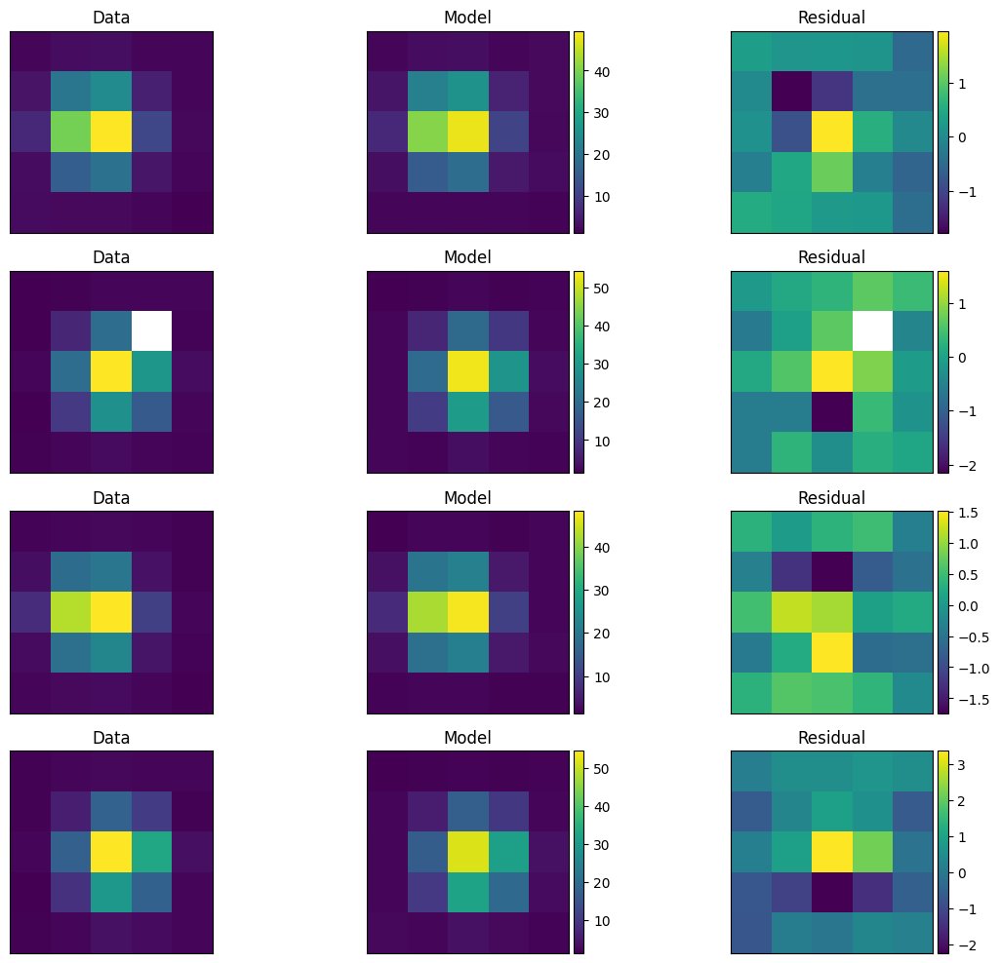

Finished PSF psf_photometry with median residuals of 0.41%


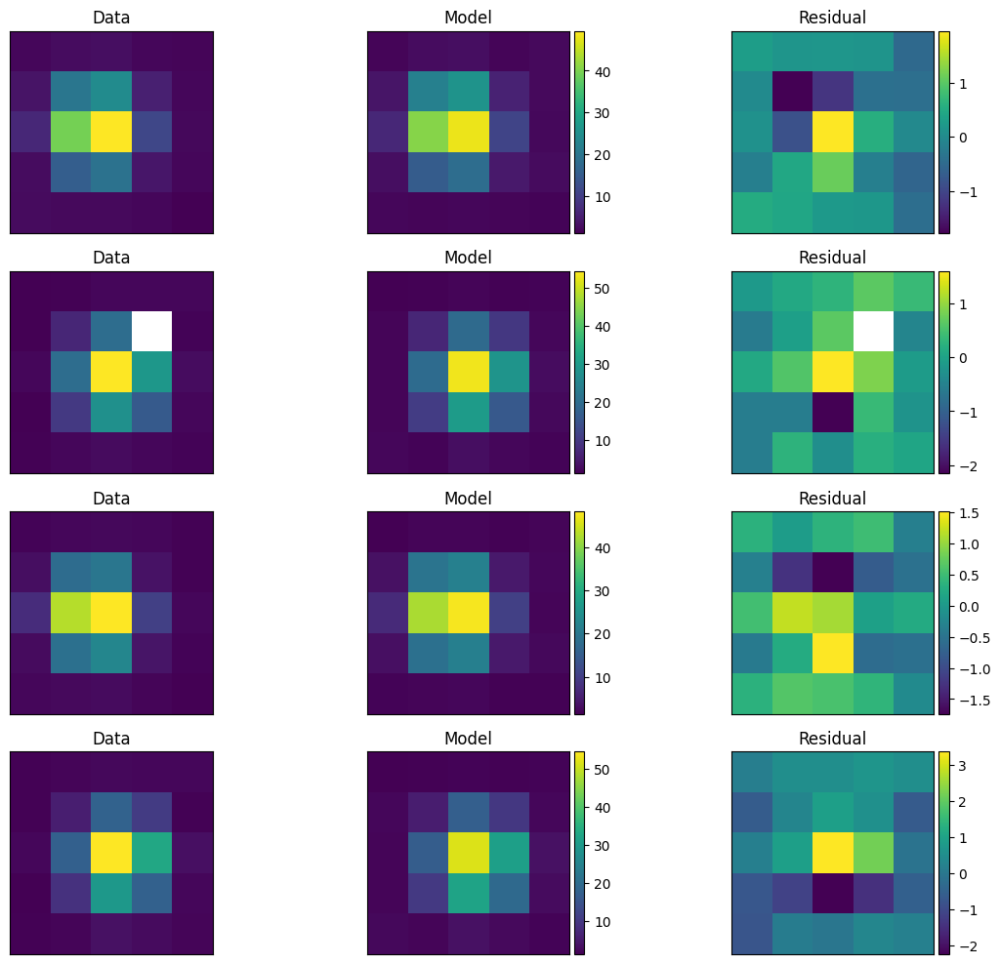

Elapsed Time for Photometry: 30.684884652999926
Starting 9.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72825455, -69.44591833)>


[1.84141688927626, 1.7936298903695782, 1.8419053048023337, 1.898898235350981]


Finished PSF psf_photometry with median residuals of 2.13%


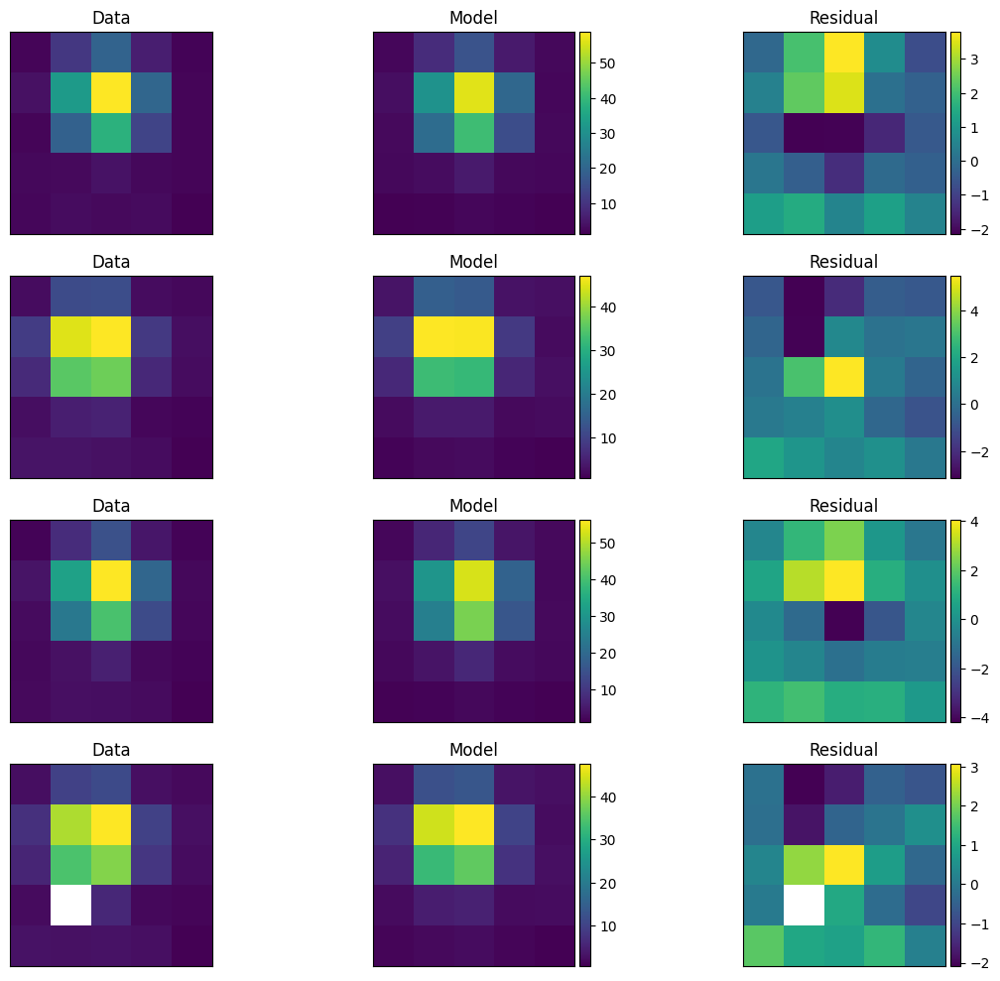

Finished PSF psf_photometry with median residuals of 1.55%


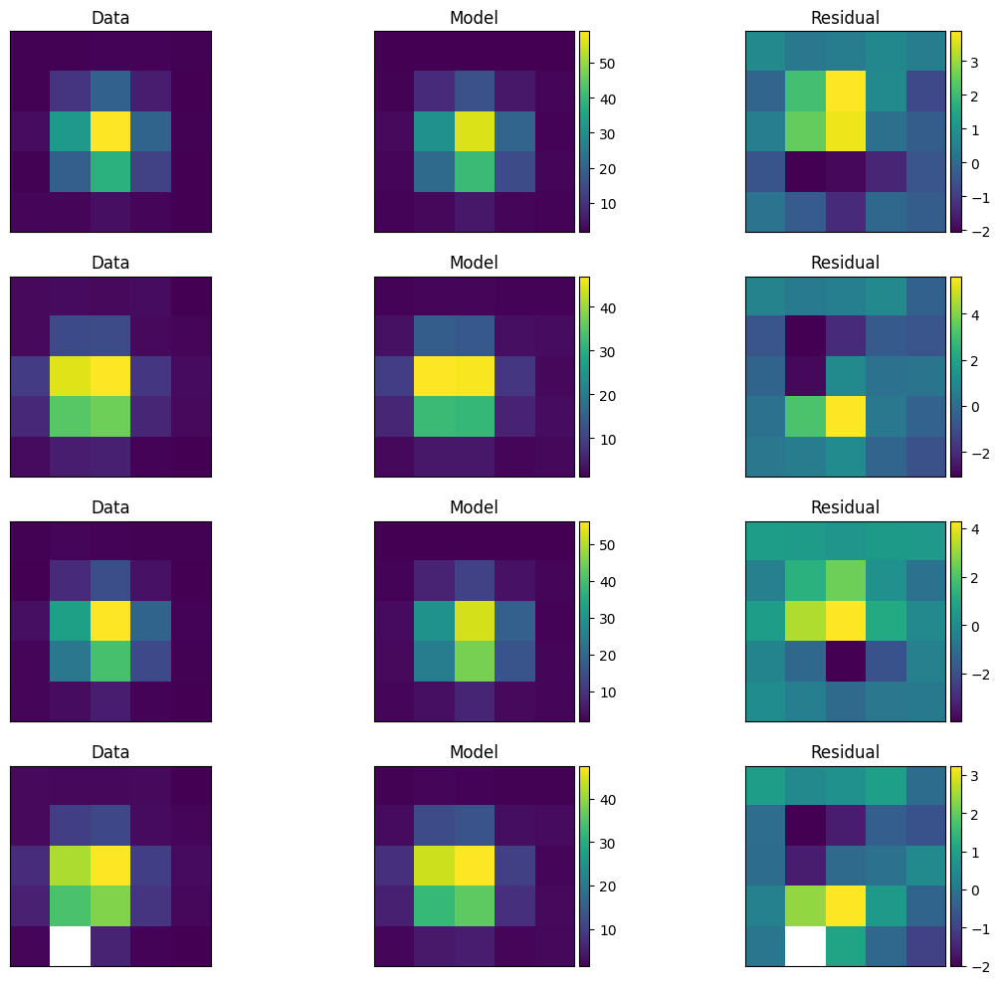

Elapsed Time for Photometry: 29.807825353999988
Starting 10.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.73139968, -69.44867714)>


[1.8579865136454181, 1.8863315108780547, 1.9026257471384738, 1.9372216368143538]


Finished PSF psf_photometry with median residuals of 3.64%


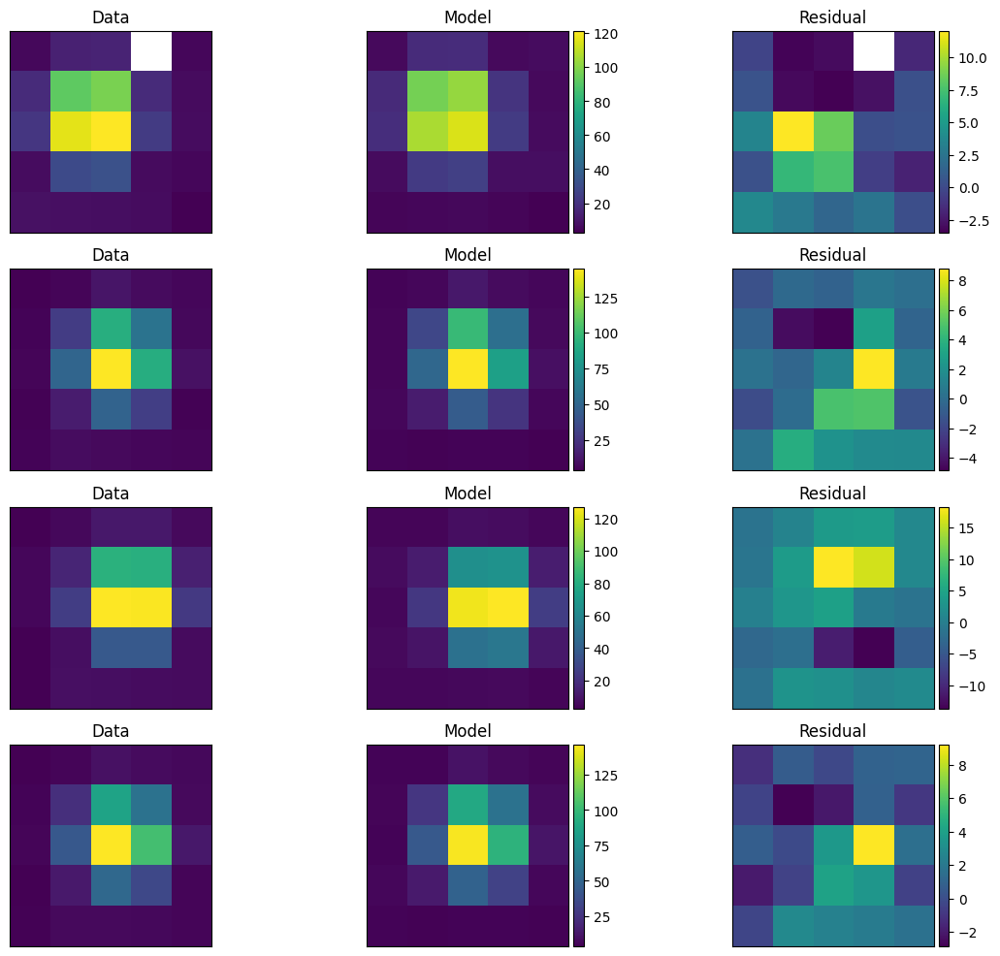

Finished PSF psf_photometry with median residuals of 3.52%


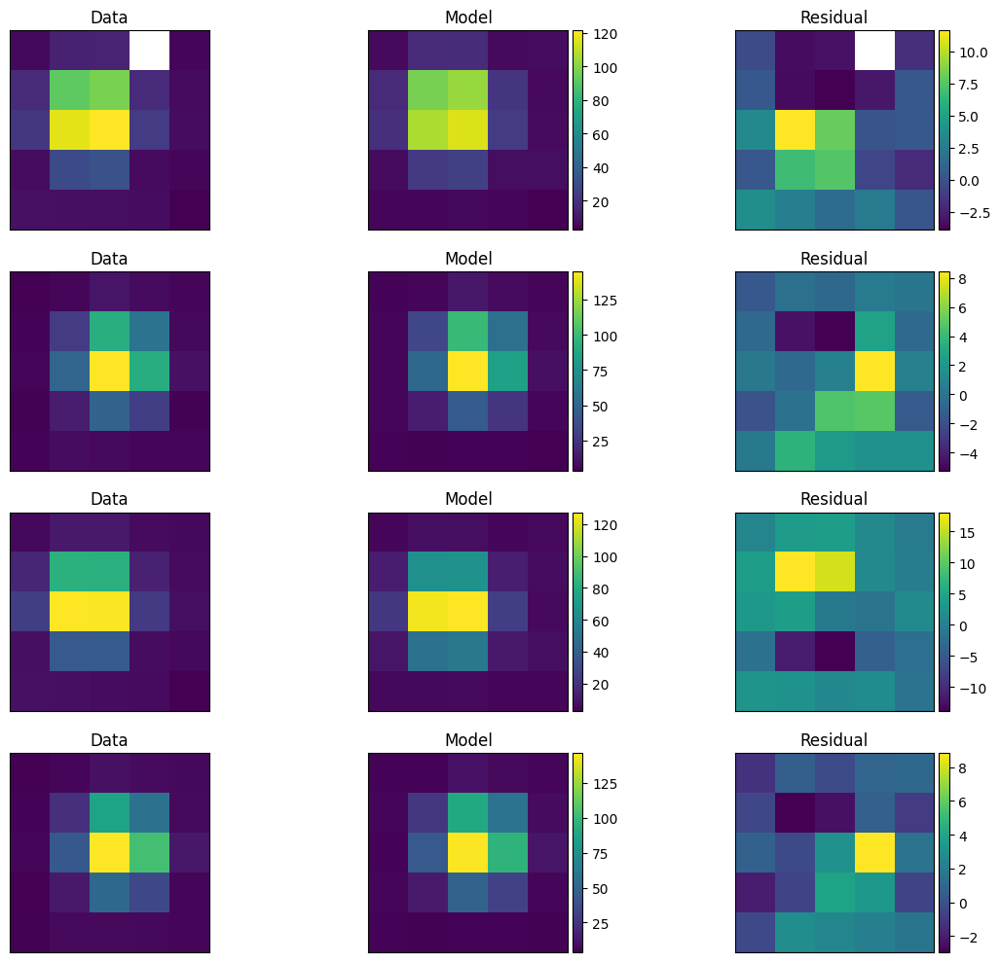

Elapsed Time for Photometry: 34.846156638000025
Starting 11.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.72803699, -69.45133844)>


[1.7678997491160011, 1.7850290745363107, 1.7748173095028976, 1.8868650197982788]


Finished PSF psf_photometry with median residuals of 2.11%


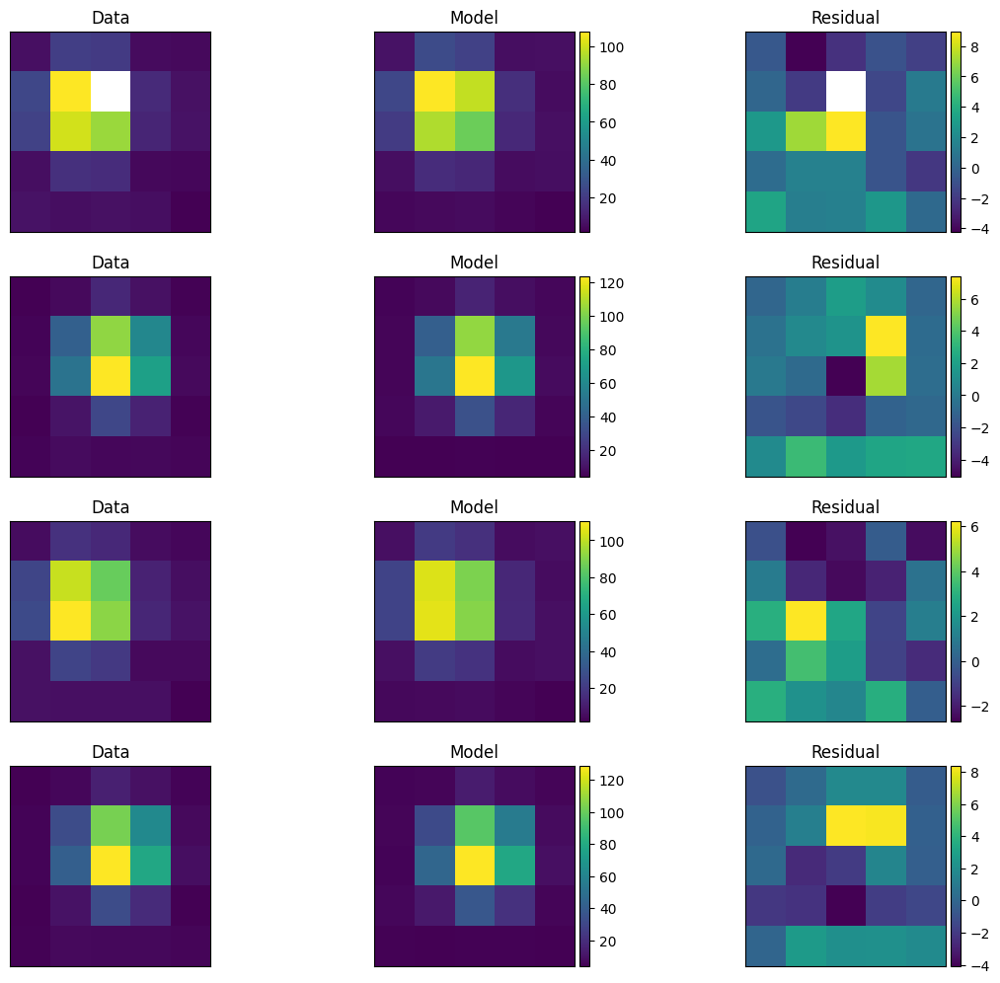

Finished PSF psf_photometry with median residuals of 2.32%


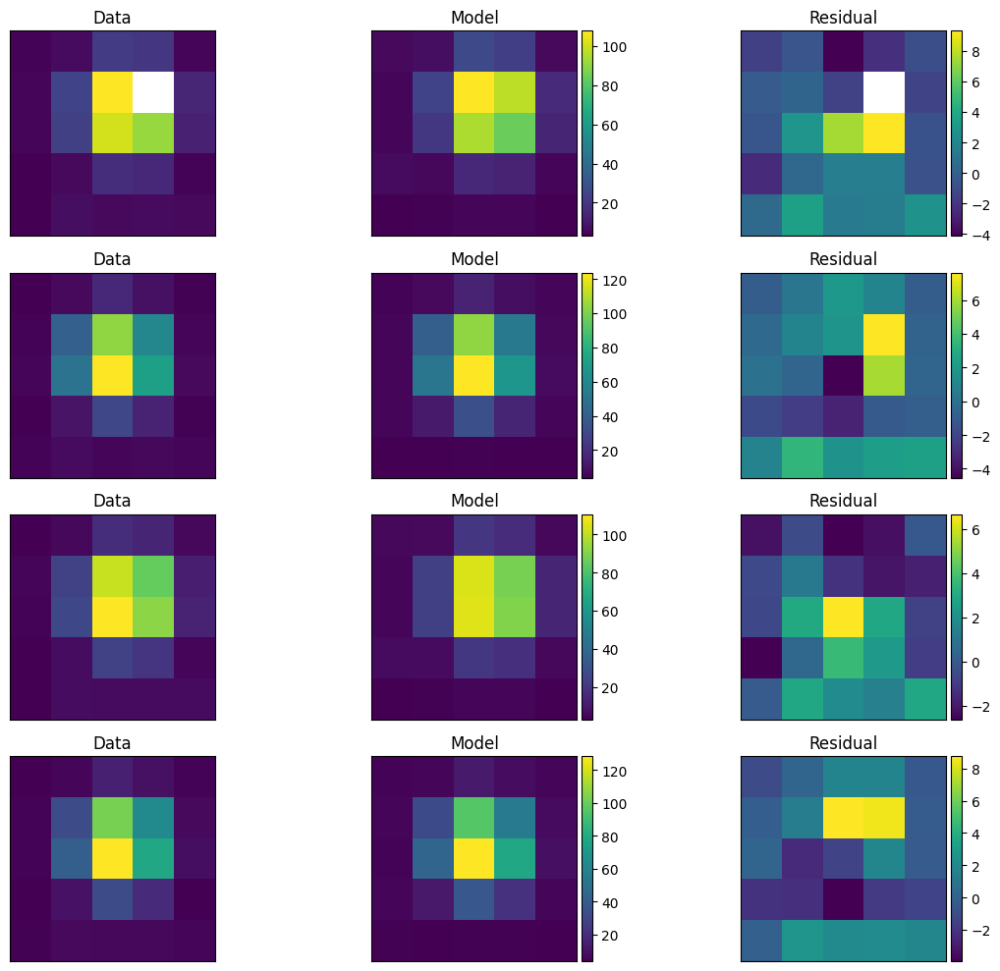

Elapsed Time for Photometry: 34.89746904799995
Starting 12.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.7374627, -69.44890937)>


[1.8077051193817804, 1.816236440996522, 1.8916719631336663, 1.9208566810361187]


Finished PSF psf_photometry with median residuals of 1.53%


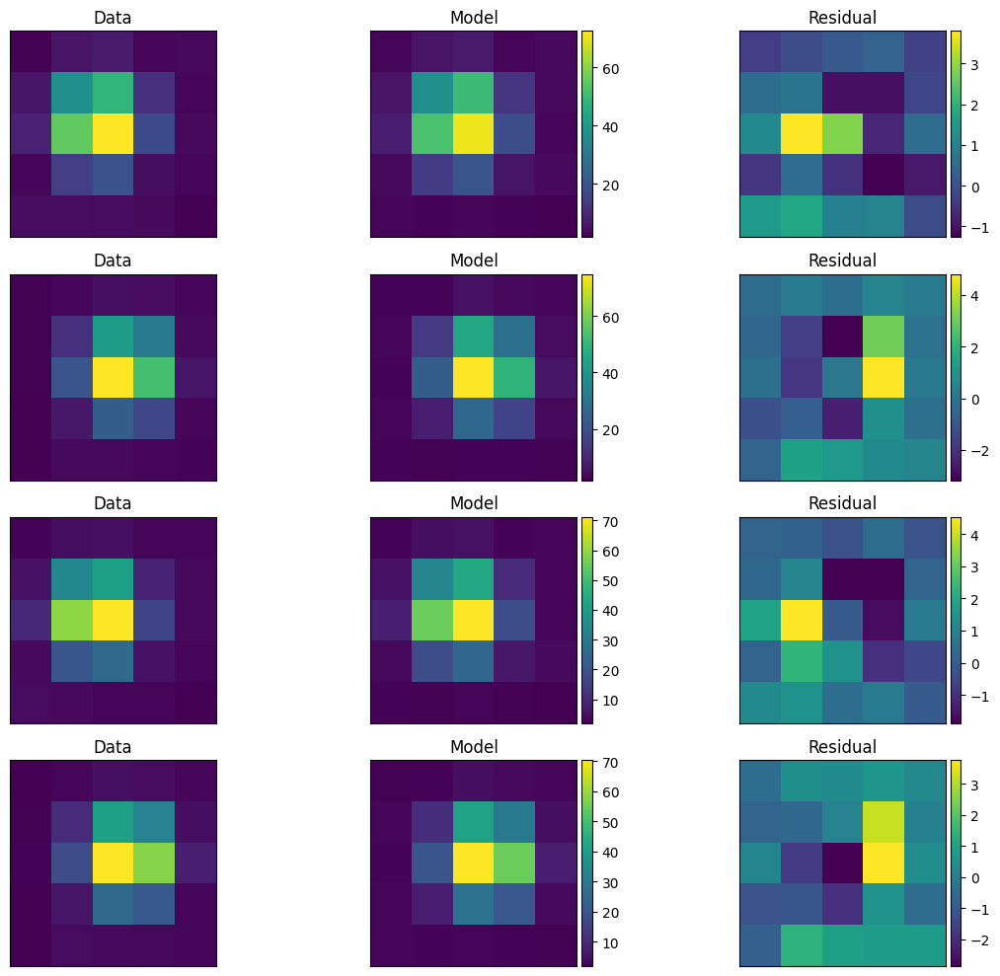

Finished PSF psf_photometry with median residuals of 1.53%


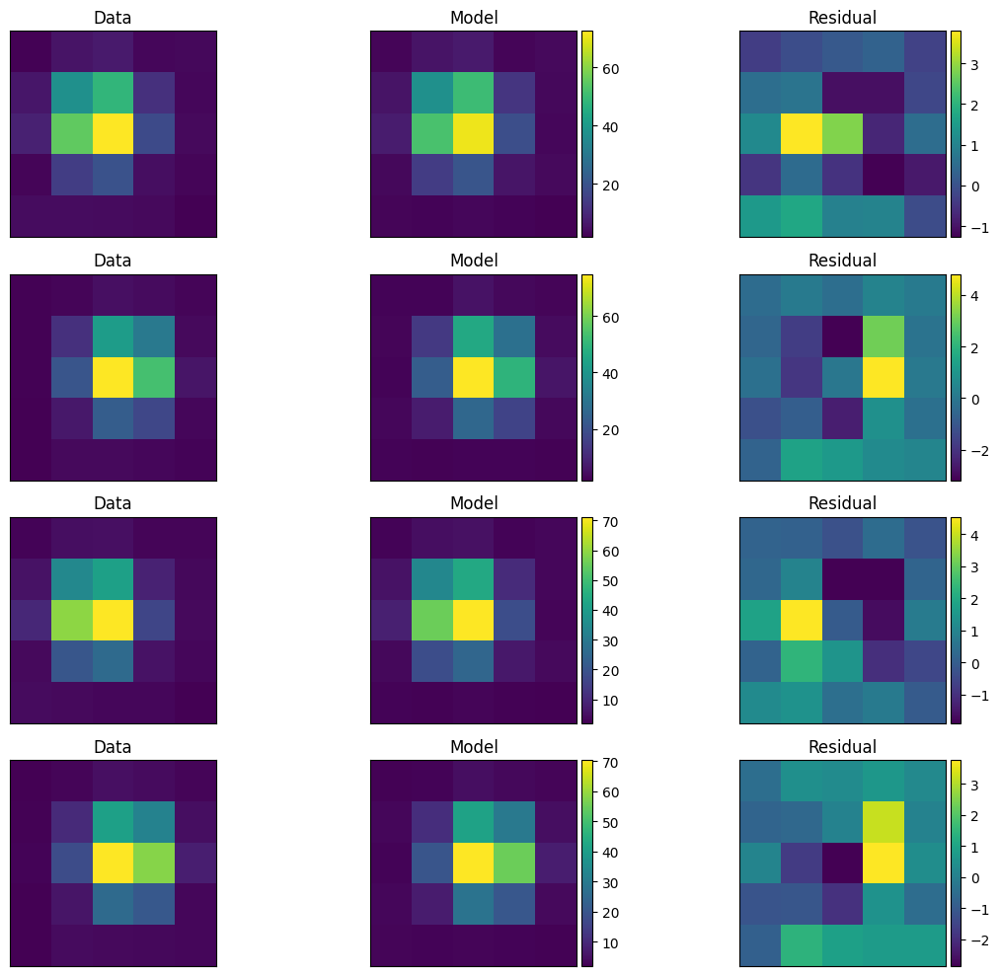

Elapsed Time for Photometry: 30.545299899999918
Starting 13.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.74189341, -69.44834497)>


[1.9374462342956695, 1.8818280295113832, 2.02440093926021, 1.8681333922051095]


Finished PSF psf_photometry with median residuals of 1.80%


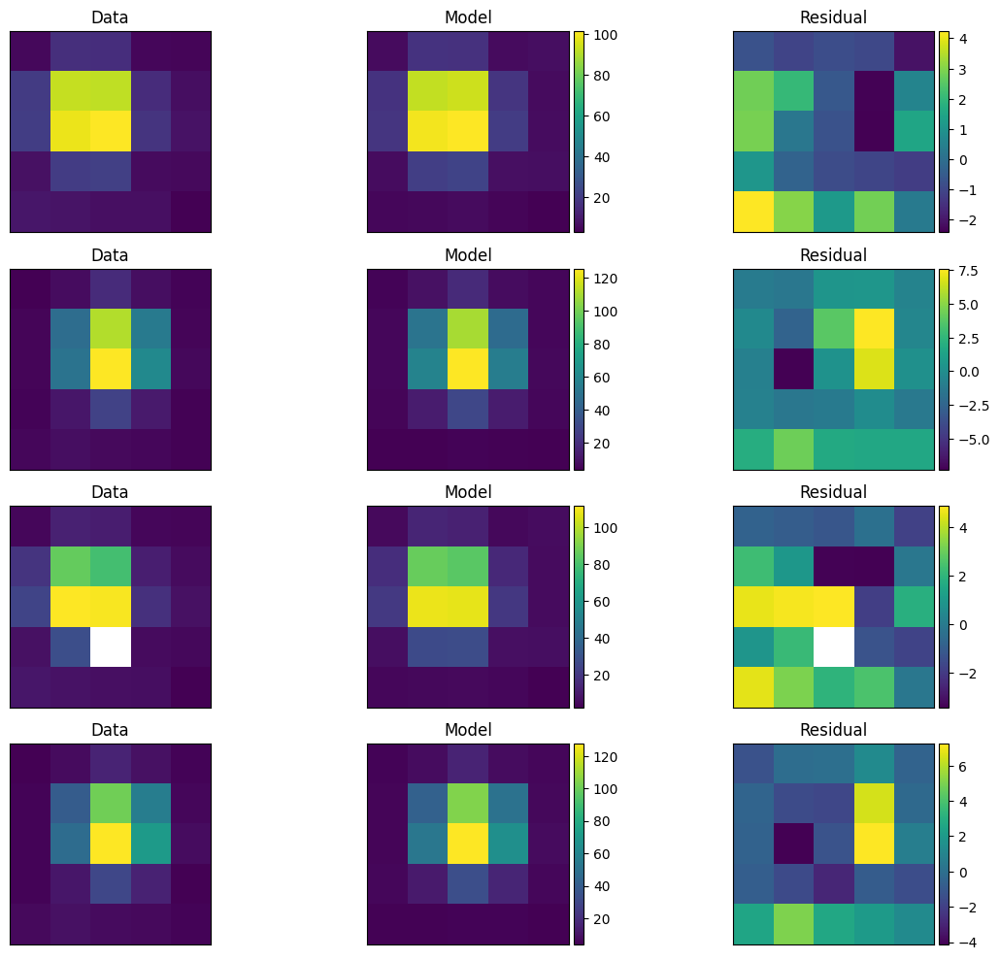

Finished PSF psf_photometry with median residuals of 1.82%


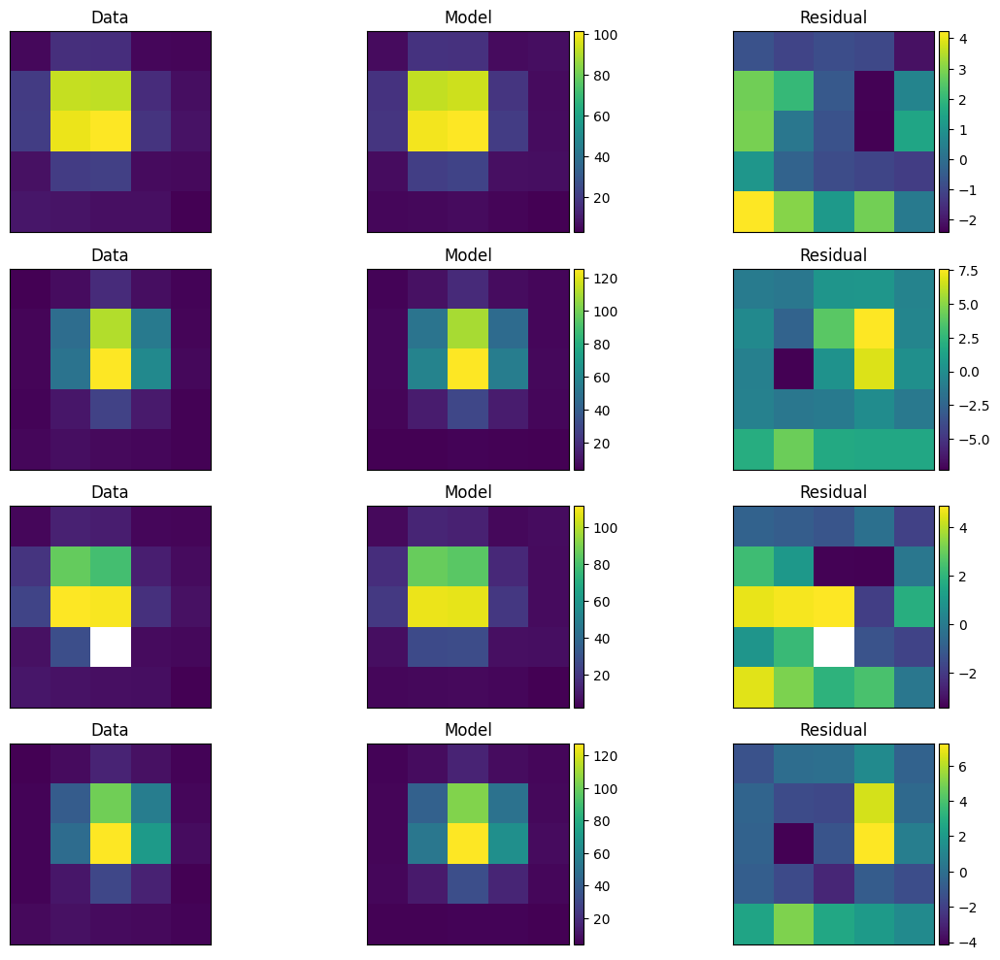

Elapsed Time for Photometry: 30.445656781000025


In [63]:
# Now Loop Through All Stars and Build Photometry Table
# Readers should refer to all diagnostics discussed above. 
# It should be noted that empty plots correspond to LVL2 files with dither positions that do not cover that particular coordinate.
warnings.simplefilter('ignore')
counter = 0.
badindex = []

jwst_obs = space_phot.observation2(lvl2)
localbkg_estimator = LocalBackground(5, 10, bkg_estimator=MMMBackground())

for source_location in skycoords:
    tic = time.perf_counter()
    print('Starting', counter+1., ' of', len(skycoords), ':', source_location)
    psfs = space_phot.util.get_jwst_psf_from_grid(jwst_obs, source_location, grid)
    xys = [jwst_obs.wcs_list[i].world_to_pixel(source_location) for i in range(jwst_obs.n_exposures)]
    bkg = [localbkg_estimator(jwst_obs.data_arr_pam[i], xys[i][0], xys[i][0]) for i in range(jwst_obs.n_exposures)]
    print(bkg)
    jwst_obs.psf_photometry(
        psfs,
        source_location,
        bounds={
            'flux': [-100000, 100000],
            'centroid': [-2.0, 2.0],
        },
        fit_width=5,
        fit_bkg=False,
        fit_centroid='wcs',
        background=bkg,
        fit_flux='single',
        maxiter=None
    )
    
    jwst_obs.plot_psf_fit()
    plt.show()
    ra = jwst_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst_obs.psf_result.phot_cal_table['dec'][0]

    fit_location = SkyCoord(ra, dec, unit=u.deg)
     
    jwst_obs.psf_photometry(
        psfs,
        fit_location,
        bounds={
            'flux': [-100000, 100000],
            'centroid': [-2.0, 2.0],
        },
        fit_width=5,
        fit_bkg=False,
        background=bkg,
        fit_centroid='fixed',
        fit_flux='single',
        maxiter=None
    )

    jwst_obs.plot_psf_fit()
    plt.show()
    ra = jwst_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst_obs.psf_result.phot_cal_table['dec'][0]
    mag_arr = jwst_obs.psf_result.phot_cal_table['mag']
    magerr_arr = jwst_obs.psf_result.phot_cal_table['magerr']
    mag_lvl2psf = np.mean(mag_arr)
    magerr_lvl2psf = math.sqrt(sum(p**2 for p in magerr_arr))

    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]), columns=['ra', 'dec', 'mag', 'magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl2psf, magerr_lvl2psf]]), columns=['ra', 'dec', 'mag', 'magerr'])], ignore_index=True)
    counter = counter + 1.
    
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [64]:
xys

[(array(665.76055802), array(668.62800217)),
 (array(627.68124922), array(622.10846201)),
 (array(664.87310868), array(665.57020268)),
 (array(626.71526424), array(619.17865679))]

In [65]:
df

,ra,dec,mag,magerr
0,80.687509,-69.445224,18.898150,0.006949
1,80.705194,-69.437533,19.404382,0.006111
2,80.699469,-69.443578,18.680336,0.004366
3,80.700771,-69.443234,18.924007,0.005539
4,80.704797,-69.441542,19.128008,0.004758
5,80.698003,-69.447549,19.901387,0.010868
6,80.706848,-69.444346,18.445790,0.004019
7,80.721346,-69.442773,19.008238,0.005646
8,80.728236,-69.445924,18.900170,0.004508
9,80.731416,-69.448676,17.868632,0.003254


In [66]:
# Write to File
df.to_csv('miri_photometry_space_phot_lvl2.txt', index=False)  

### 5.2<font color='white'>-</font>Single, Level3 Mosaicked File<a class="anchor" id="lmc3"></a> ###

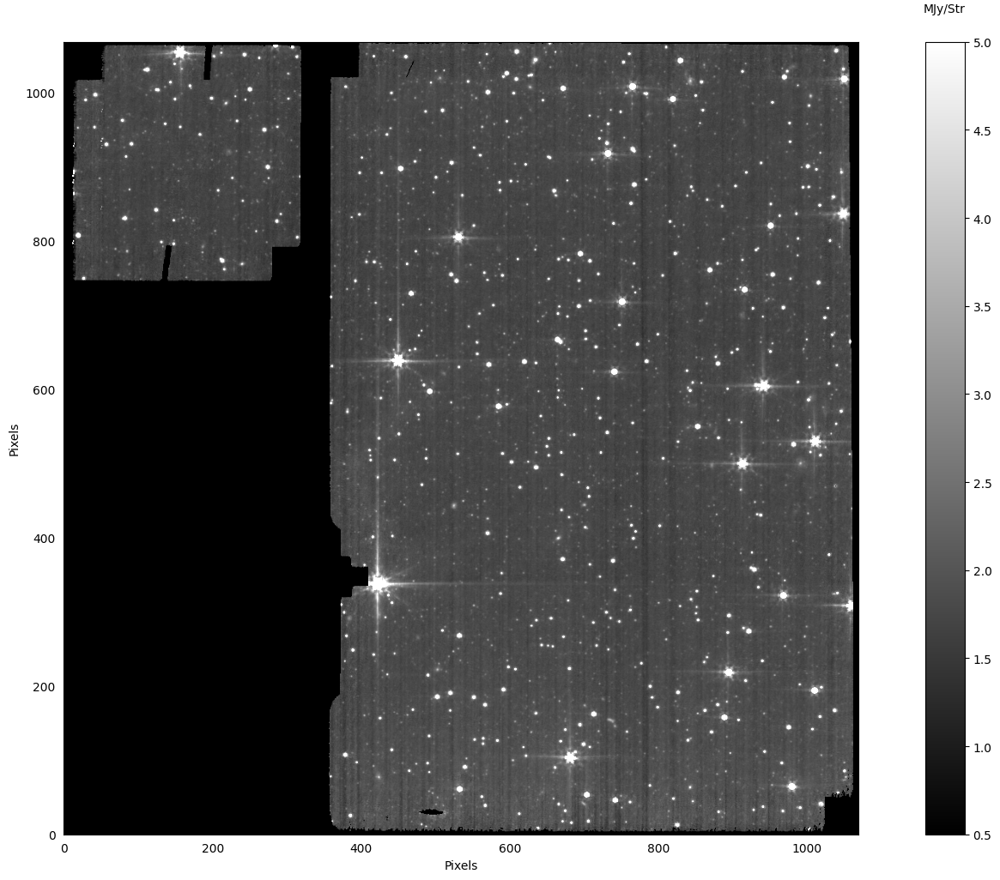

In [67]:
# Now do the same photometry on the Level 3 Data
ref_image = lvl3[0]

ref_fits = ImageModel(ref_image)
ref_data = ref_fits.data
norm1 = simple_norm(ref_data, stretch='linear', min_cut=0.5, max_cut=5)

plt.figure(figsize=(20, 12))
plt.imshow(ref_data, origin='lower', norm=norm1, cmap='gray')
clb = plt.colorbar()
clb.set_label('MJy/Str', labelpad=-40, y=1.05, rotation=0)
plt.gca().tick_params(axis='both', color='none')
plt.xlabel('Pixels')
plt.ylabel('Pixels')
plt.show()

In [68]:
# Get PSF from WebbPSF and drizzle it to the source location
jwst3_obs = space_phot.observation3(lvl3[0])

In [69]:
lvl3[0]

'./mast/01171/jw01171-o004_t001_miri_f560w_i2d.fits'

In [70]:
skycoords

<SkyCoord (ICRS): (ra, dec) in deg
    [(80.68751895, -69.44522201), (80.70519786, -69.43753355),
     (80.69947281, -69.44357619), (80.70076349, -69.44322912),
     (80.70480666, -69.44154063), (80.69801844, -69.44754524),
     (80.70685609, -69.4443474 ), (80.72134618, -69.44277393),
     (80.72825455, -69.44591833), (80.73139968, -69.44867714),
     (80.72803699, -69.45133844), (80.7374627 , -69.44890937),
     (80.74189341, -69.44834497)]>

#### Readers should refer to all diagnostics discussed above. In general, this loop shows the difficulty in doing PSF photometry on a wide variety of stars (brightness, distribution on the detector, etc) without visual inspection. Especially when dealing with low SNR sources.This is true for all photometry packages. Users should inspect the associated metrics and consider optimizing the parameters for specific stars of interest. Nonetheless, the success of the fits can always be quantified in with the associated error bars.


Starting 1.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.70519786, -69.43753355)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits



MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(123.53744224), array(699.5595544)) pixels


    Position 1/1 centroid: (201.34368596613945, 201.7628797397261)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(76.29823152), array(661.82205941)) pixels


    Position 1/1 centroid: (201.32154273036554, 201.80099578112635)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(120.43679282), array(698.68358418)) pixels


    Position 1/1 centroid: (201.34212605742846, 201.76493480669592)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(73.31069299), array(660.86952362)) pixels


    Position 1/1 centroid: (201.31952743828327, 201.80291255054078)


2024-12-10 20:25:57,919 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-12-10 20:25:57,920 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-12-10 20:25:57,923 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-12-10 20:25:57,925 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-12-10 20:25:57,926 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-12-10 20:25:57,928 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-12-10 20:25:57,929 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-12-10 20:25:58,175 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2024-12-10 20:25:58,189 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2024-12-10 20:25:58,189 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-12-10 20:25:58,691 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c5831c710>,).


2024-12-10 20:25:58,692 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2024-12-10 20:25:59,612 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c5831c710>,).


2024-12-10 20:25:59,613 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2024-12-10 20:25:59,923 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c5831c710>,).


2024-12-10 20:25:59,923 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2024-12-10 20:26:00,254 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c5831c710>,).


2024-12-10 20:26:00,256 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:00,257 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:00,257 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:00,257 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:00,261 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:00,261 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:00,261 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:00,262 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:00,264 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:00,265 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:00,265 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:00,266 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:00,268 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:00,268 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:00,268 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:00,269 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:00,271 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-12-10 20:26:00,271 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-12-10 20:26:00,271 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-12-10 20:26:00,272 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-12-10 20:26:00,272 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2024-12-10 20:26:00,365 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-12-10 20:26:00,923 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:01,697 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:02,510 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:03,280 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:03,946 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-12-10 20:26:03,949 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,951 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,952 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,952 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,953 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,954 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,954 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,955 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,955 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,956 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,957 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,957 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:03,984 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660247821 -69.452654203 80.735784316 -69.472169218 80.791372770 -69.445623664 80.715879065 -69.426132741


2024-12-10 20:26:04,426 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2024-12-10 20:26:04,427 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-12-10 20:26:04,651 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2024-12-10 20:26:04,652 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2024-12-10 20:26:04,657 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-12-10 20:26:04,658 - stpipe - INFO - Results used jwst version: 1.16.1


[2.1097325677365326]


2024-12-10 20:26:06,117 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.


Finished PSF psf_photometry with median residuals of 4.34%


2024-12-10 20:26:06,885 - CRDS - INFO -  Calibration SW Found: jwst 1.16.1 (/opt/hostedtoolcache/Python/3.11.11/x64/lib/python3.11/site-packages/jwst-1.16.1.dist-info)


2024-12-10 20:26:07,092 - CRDS - INFO -  Fetching  mappings/jwst/jwst_system_datalvl_0002.rmap                  694 bytes  (1 / 200 files) (0 / 717.9 K bytes)


2024-12-10 20:26:07,155 - CRDS - INFO -  Fetching  mappings/jwst/jwst_system_calver_0044.rmap                 5.0 K bytes  (2 / 200 files) (694 / 717.9 K bytes)


2024-12-10 20:26:07,227 - CRDS - INFO -  Fetching  mappings/jwst/jwst_system_0043.imap                          385 bytes  (3 / 200 files) (5.7 K / 717.9 K bytes)


2024-12-10 20:26:07,289 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_wavelengthrange_0024.rmap       1.4 K bytes  (4 / 200 files) (6.1 K / 717.9 K bytes)


2024-12-10 20:26:07,363 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_wavecorr_0005.rmap                884 bytes  (5 / 200 files) (7.5 K / 717.9 K bytes)


2024-12-10 20:26:07,414 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_superbias_0074.rmap            33.8 K bytes  (6 / 200 files) (8.3 K / 717.9 K bytes)


2024-12-10 20:26:07,504 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_sflat_0026.rmap                20.6 K bytes  (7 / 200 files) (42.1 K / 717.9 K bytes)


2024-12-10 20:26:07,568 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_saturation_0018.rmap            2.0 K bytes  (8 / 200 files) (62.7 K / 717.9 K bytes)


2024-12-10 20:26:07,646 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_refpix_0015.rmap                1.6 K bytes  (9 / 200 files) (64.7 K / 717.9 K bytes)


2024-12-10 20:26:07,714 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_readnoise_0025.rmap             2.6 K bytes  (10 / 200 files) (66.3 K / 717.9 K bytes)


2024-12-10 20:26:07,780 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_photom_0013.rmap                  958 bytes  (11 / 200 files) (68.9 K / 717.9 K bytes)


2024-12-10 20:26:07,845 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pathloss_0007.rmap              1.1 K bytes  (12 / 200 files) (69.8 K / 717.9 K bytes)


2024-12-10 20:26:07,895 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-whitelightstep_0001.rmap      777 bytes  (13 / 200 files) (70.9 K / 717.9 K bytes)


2024-12-10 20:26:07,949 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-spec2pipeline_0013.rmap    2.1 K bytes  (14 / 200 files) (71.7 K / 717.9 K bytes)


2024-12-10 20:26:08,010 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-resamplespecstep_0002.rmap      709 bytes  (15 / 200 files) (73.8 K / 717.9 K bytes)


2024-12-10 20:26:08,073 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-outlierdetectionstep_0003.rmap    1.1 K bytes  (16 / 200 files) (74.6 K / 717.9 K bytes)


2024-12-10 20:26:08,125 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-jumpstep_0005.rmap           810 bytes  (17 / 200 files) (75.7 K / 717.9 K bytes)


2024-12-10 20:26:08,176 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-image2pipeline_0008.rmap    1.0 K bytes  (18 / 200 files) (76.5 K / 717.9 K bytes)


2024-12-10 20:26:08,249 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-detector1pipeline_0003.rmap    1.1 K bytes  (19 / 200 files) (77.5 K / 717.9 K bytes)


2024-12-10 20:26:08,335 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-darkpipeline_0003.rmap       872 bytes  (20 / 200 files) (78.6 K / 717.9 K bytes)


2024-12-10 20:26:08,400 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_pars-darkcurrentstep_0001.rmap      622 bytes  (21 / 200 files) (79.4 K / 717.9 K bytes)


2024-12-10 20:26:08,500 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_ote_0030.rmap                   1.3 K bytes  (22 / 200 files) (80.1 K / 717.9 K bytes)


2024-12-10 20:26:08,572 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_msaoper_0014.rmap               1.4 K bytes  (23 / 200 files) (81.3 K / 717.9 K bytes)


2024-12-10 20:26:08,646 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_msa_0027.rmap                   1.3 K bytes  (24 / 200 files) (82.7 K / 717.9 K bytes)


2024-12-10 20:26:08,710 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_mask_0039.rmap                  2.7 K bytes  (25 / 200 files) (84.0 K / 717.9 K bytes)


2024-12-10 20:26:08,820 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_linearity_0017.rmap             1.6 K bytes  (26 / 200 files) (86.7 K / 717.9 K bytes)


2024-12-10 20:26:08,913 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_ipc_0006.rmap                     876 bytes  (27 / 200 files) (88.2 K / 717.9 K bytes)


2024-12-10 20:26:08,989 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_ifuslicer_0017.rmap             1.5 K bytes  (28 / 200 files) (89.1 K / 717.9 K bytes)


2024-12-10 20:26:09,055 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_ifupost_0019.rmap               1.5 K bytes  (29 / 200 files) (90.7 K / 717.9 K bytes)


2024-12-10 20:26:09,153 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_ifufore_0017.rmap               1.5 K bytes  (30 / 200 files) (92.2 K / 717.9 K bytes)


2024-12-10 20:26:09,232 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_gain_0023.rmap                  1.8 K bytes  (31 / 200 files) (93.7 K / 717.9 K bytes)


2024-12-10 20:26:09,404 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_fpa_0028.rmap                   1.3 K bytes  (32 / 200 files) (95.4 K / 717.9 K bytes)


2024-12-10 20:26:09,484 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_fore_0026.rmap                  5.0 K bytes  (33 / 200 files) (96.7 K / 717.9 K bytes)


2024-12-10 20:26:09,573 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_flat_0015.rmap                  3.8 K bytes  (34 / 200 files) (101.6 K / 717.9 K bytes)


2024-12-10 20:26:09,647 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_fflat_0026.rmap                 7.2 K bytes  (35 / 200 files) (105.5 K / 717.9 K bytes)


2024-12-10 20:26:09,726 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_extract1d_0018.rmap             2.3 K bytes  (36 / 200 files) (112.7 K / 717.9 K bytes)


2024-12-10 20:26:09,780 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_disperser_0028.rmap             5.7 K bytes  (37 / 200 files) (115.0 K / 717.9 K bytes)


2024-12-10 20:26:09,837 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_dflat_0007.rmap                 1.1 K bytes  (38 / 200 files) (120.7 K / 717.9 K bytes)


2024-12-10 20:26:09,905 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_dark_0069.rmap                 32.6 K bytes  (39 / 200 files) (121.8 K / 717.9 K bytes)


2024-12-10 20:26:09,984 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_cubepar_0015.rmap                 966 bytes  (40 / 200 files) (154.4 K / 717.9 K bytes)


2024-12-10 20:26:10,042 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_collimator_0026.rmap            1.3 K bytes  (41 / 200 files) (155.3 K / 717.9 K bytes)


2024-12-10 20:26:10,110 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_camera_0026.rmap                1.3 K bytes  (42 / 200 files) (156.7 K / 717.9 K bytes)


2024-12-10 20:26:10,163 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_barshadow_0007.rmap             1.8 K bytes  (43 / 200 files) (158.0 K / 717.9 K bytes)


2024-12-10 20:26:10,219 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_area_0018.rmap                  6.3 K bytes  (44 / 200 files) (159.8 K / 717.9 K bytes)


2024-12-10 20:26:10,287 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_apcorr_0009.rmap                5.6 K bytes  (45 / 200 files) (166.0 K / 717.9 K bytes)


2024-12-10 20:26:10,340 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nirspec_0383.imap                       5.6 K bytes  (46 / 200 files) (171.6 K / 717.9 K bytes)


2024-12-10 20:26:10,435 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_wfssbkg_0007.rmap                3.1 K bytes  (47 / 200 files) (177.2 K / 717.9 K bytes)


2024-12-10 20:26:10,513 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_wavemap_0008.rmap                2.2 K bytes  (48 / 200 files) (180.3 K / 717.9 K bytes)


2024-12-10 20:26:10,579 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_wavelengthrange_0006.rmap          862 bytes  (49 / 200 files) (182.6 K / 717.9 K bytes)


2024-12-10 20:26:10,630 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_trappars_0004.rmap                 753 bytes  (50 / 200 files) (183.4 K / 717.9 K bytes)


2024-12-10 20:26:10,690 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_trapdensity_0005.rmap              705 bytes  (51 / 200 files) (184.2 K / 717.9 K bytes)


2024-12-10 20:26:10,767 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_throughput_0005.rmap             1.3 K bytes  (52 / 200 files) (184.9 K / 717.9 K bytes)


2024-12-10 20:26:10,886 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_superbias_0028.rmap              6.5 K bytes  (53 / 200 files) (186.1 K / 717.9 K bytes)


2024-12-10 20:26:10,941 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_specwcs_0014.rmap                3.1 K bytes  (54 / 200 files) (192.6 K / 717.9 K bytes)


2024-12-10 20:26:10,994 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_spectrace_0008.rmap              2.3 K bytes  (55 / 200 files) (195.8 K / 717.9 K bytes)


2024-12-10 20:26:11,069 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_specprofile_0008.rmap            2.4 K bytes  (56 / 200 files) (198.1 K / 717.9 K bytes)


2024-12-10 20:26:11,182 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_speckernel_0006.rmap             1.0 K bytes  (57 / 200 files) (200.4 K / 717.9 K bytes)


2024-12-10 20:26:11,281 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_saturation_0015.rmap               829 bytes  (58 / 200 files) (201.5 K / 717.9 K bytes)


2024-12-10 20:26:11,338 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_readnoise_0011.rmap                987 bytes  (59 / 200 files) (202.3 K / 717.9 K bytes)


2024-12-10 20:26:11,393 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_photom_0035.rmap                 1.3 K bytes  (60 / 200 files) (203.3 K / 717.9 K bytes)


2024-12-10 20:26:11,468 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_persat_0007.rmap                   674 bytes  (61 / 200 files) (204.5 K / 717.9 K bytes)


2024-12-10 20:26:11,545 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pathloss_0003.rmap                 758 bytes  (62 / 200 files) (205.2 K / 717.9 K bytes)


2024-12-10 20:26:11,597 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pastasoss_0004.rmap                818 bytes  (63 / 200 files) (206.0 K / 717.9 K bytes)


2024-12-10 20:26:11,662 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-undersamplecorrectionstep_0001.rmap      904 bytes  (64 / 200 files) (206.8 K / 717.9 K bytes)


2024-12-10 20:26:11,721 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-tweakregstep_0012.rmap      3.1 K bytes  (65 / 200 files) (207.7 K / 717.9 K bytes)


2024-12-10 20:26:11,786 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-spec2pipeline_0008.rmap       984 bytes  (66 / 200 files) (210.8 K / 717.9 K bytes)


2024-12-10 20:26:11,839 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-sourcecatalogstep_0002.rmap    2.3 K bytes  (67 / 200 files) (211.8 K / 717.9 K bytes)


2024-12-10 20:26:11,896 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-resamplestep_0002.rmap        687 bytes  (68 / 200 files) (214.1 K / 717.9 K bytes)


2024-12-10 20:26:11,947 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-outlierdetectionstep_0004.rmap    2.7 K bytes  (69 / 200 files) (214.8 K / 717.9 K bytes)


2024-12-10 20:26:11,998 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-jumpstep_0007.rmap          6.4 K bytes  (70 / 200 files) (217.5 K / 717.9 K bytes)


2024-12-10 20:26:12,062 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-image2pipeline_0005.rmap    1.0 K bytes  (71 / 200 files) (223.8 K / 717.9 K bytes)


2024-12-10 20:26:12,122 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-detector1pipeline_0002.rmap    1.0 K bytes  (72 / 200 files) (224.9 K / 717.9 K bytes)


2024-12-10 20:26:12,183 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-darkpipeline_0002.rmap        868 bytes  (73 / 200 files) (225.9 K / 717.9 K bytes)


2024-12-10 20:26:12,233 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-darkcurrentstep_0001.rmap      591 bytes  (74 / 200 files) (226.8 K / 717.9 K bytes)


2024-12-10 20:26:12,285 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_pars-chargemigrationstep_0004.rmap    5.7 K bytes  (75 / 200 files) (227.4 K / 717.9 K bytes)


2024-12-10 20:26:12,340 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_nrm_0002.rmap                      663 bytes  (76 / 200 files) (233.0 K / 717.9 K bytes)


2024-12-10 20:26:12,391 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_mask_0020.rmap                     859 bytes  (77 / 200 files) (233.7 K / 717.9 K bytes)


2024-12-10 20:26:12,443 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_linearity_0022.rmap                961 bytes  (78 / 200 files) (234.5 K / 717.9 K bytes)


2024-12-10 20:26:12,493 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_ipc_0007.rmap                      651 bytes  (79 / 200 files) (235.5 K / 717.9 K bytes)


2024-12-10 20:26:12,544 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_gain_0011.rmap                     797 bytes  (80 / 200 files) (236.2 K / 717.9 K bytes)


2024-12-10 20:26:12,596 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_flat_0023.rmap                   5.9 K bytes  (81 / 200 files) (236.9 K / 717.9 K bytes)


2024-12-10 20:26:12,648 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_filteroffset_0010.rmap             853 bytes  (82 / 200 files) (242.8 K / 717.9 K bytes)


2024-12-10 20:26:12,698 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_extract1d_0007.rmap                905 bytes  (83 / 200 files) (243.7 K / 717.9 K bytes)


2024-12-10 20:26:12,748 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_drizpars_0004.rmap                 519 bytes  (84 / 200 files) (244.6 K / 717.9 K bytes)


2024-12-10 20:26:12,802 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_distortion_0025.rmap             3.4 K bytes  (85 / 200 files) (245.1 K / 717.9 K bytes)


2024-12-10 20:26:12,854 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_dark_0031.rmap                   6.8 K bytes  (86 / 200 files) (248.5 K / 717.9 K bytes)


2024-12-10 20:26:12,906 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_area_0014.rmap                   2.7 K bytes  (87 / 200 files) (255.3 K / 717.9 K bytes)


2024-12-10 20:26:12,956 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_apcorr_0010.rmap                 4.3 K bytes  (88 / 200 files) (258.0 K / 717.9 K bytes)


2024-12-10 20:26:13,006 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_abvegaoffset_0004.rmap           1.4 K bytes  (89 / 200 files) (262.3 K / 717.9 K bytes)


2024-12-10 20:26:13,060 - CRDS - INFO -  Fetching  mappings/jwst/jwst_niriss_0261.imap                        5.7 K bytes  (90 / 200 files) (263.6 K / 717.9 K bytes)


2024-12-10 20:26:13,126 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_wfssbkg_0004.rmap                7.2 K bytes  (91 / 200 files) (269.3 K / 717.9 K bytes)


2024-12-10 20:26:13,177 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_wavelengthrange_0010.rmap          996 bytes  (92 / 200 files) (276.5 K / 717.9 K bytes)


2024-12-10 20:26:13,227 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_tsophot_0003.rmap                  896 bytes  (93 / 200 files) (277.5 K / 717.9 K bytes)


2024-12-10 20:26:13,277 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_trappars_0003.rmap               1.6 K bytes  (94 / 200 files) (278.4 K / 717.9 K bytes)


2024-12-10 20:26:13,329 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_trapdensity_0003.rmap            1.6 K bytes  (95 / 200 files) (280.0 K / 717.9 K bytes)


2024-12-10 20:26:13,388 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_superbias_0018.rmap             16.2 K bytes  (96 / 200 files) (281.7 K / 717.9 K bytes)


2024-12-10 20:26:13,446 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_specwcs_0022.rmap                7.1 K bytes  (97 / 200 files) (297.8 K / 717.9 K bytes)


2024-12-10 20:26:13,503 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_saturation_0010.rmap             2.2 K bytes  (98 / 200 files) (305.0 K / 717.9 K bytes)


2024-12-10 20:26:13,554 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_readnoise_0025.rmap             23.2 K bytes  (99 / 200 files) (307.1 K / 717.9 K bytes)


2024-12-10 20:26:13,616 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_psfmask_0008.rmap               28.4 K bytes  (100 / 200 files) (330.3 K / 717.9 K bytes)


2024-12-10 20:26:13,681 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_photom_0028.rmap                 3.4 K bytes  (101 / 200 files) (358.7 K / 717.9 K bytes)


2024-12-10 20:26:13,731 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_persat_0005.rmap                 1.6 K bytes  (102 / 200 files) (362.0 K / 717.9 K bytes)


2024-12-10 20:26:13,794 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-whitelightstep_0003.rmap    1.5 K bytes  (103 / 200 files) (363.6 K / 717.9 K bytes)


2024-12-10 20:26:13,845 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-tweakregstep_0003.rmap      4.5 K bytes  (104 / 200 files) (365.1 K / 717.9 K bytes)


2024-12-10 20:26:13,898 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-spec2pipeline_0008.rmap       984 bytes  (105 / 200 files) (369.5 K / 717.9 K bytes)


2024-12-10 20:26:13,950 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-sourcecatalogstep_0002.rmap    4.6 K bytes  (106 / 200 files) (370.5 K / 717.9 K bytes)


2024-12-10 20:26:14,005 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-resamplestep_0002.rmap        687 bytes  (107 / 200 files) (375.2 K / 717.9 K bytes)


2024-12-10 20:26:14,056 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-outlierdetectionstep_0003.rmap      940 bytes  (108 / 200 files) (375.8 K / 717.9 K bytes)


2024-12-10 20:26:14,105 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-jumpstep_0005.rmap            806 bytes  (109 / 200 files) (376.8 K / 717.9 K bytes)


2024-12-10 20:26:14,159 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-image2pipeline_0003.rmap    1.0 K bytes  (110 / 200 files) (377.6 K / 717.9 K bytes)


2024-12-10 20:26:14,209 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-detector1pipeline_0003.rmap    1.0 K bytes  (111 / 200 files) (378.6 K / 717.9 K bytes)


2024-12-10 20:26:14,260 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-darkpipeline_0002.rmap        868 bytes  (112 / 200 files) (379.6 K / 717.9 K bytes)


2024-12-10 20:26:14,312 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_pars-darkcurrentstep_0001.rmap      618 bytes  (113 / 200 files) (380.5 K / 717.9 K bytes)


2024-12-10 20:26:14,363 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_mask_0011.rmap                   3.5 K bytes  (114 / 200 files) (381.1 K / 717.9 K bytes)


2024-12-10 20:26:14,415 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_linearity_0011.rmap              2.4 K bytes  (115 / 200 files) (384.6 K / 717.9 K bytes)


2024-12-10 20:26:14,465 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_ipc_0003.rmap                    2.0 K bytes  (116 / 200 files) (387.0 K / 717.9 K bytes)


2024-12-10 20:26:14,517 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_gain_0016.rmap                   2.1 K bytes  (117 / 200 files) (389.0 K / 717.9 K bytes)


2024-12-10 20:26:14,580 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_flat_0027.rmap                  51.7 K bytes  (118 / 200 files) (391.1 K / 717.9 K bytes)


2024-12-10 20:26:14,656 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_filteroffset_0004.rmap           1.4 K bytes  (119 / 200 files) (442.8 K / 717.9 K bytes)


2024-12-10 20:26:14,706 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_extract1d_0004.rmap                842 bytes  (120 / 200 files) (444.2 K / 717.9 K bytes)


2024-12-10 20:26:14,756 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_drizpars_0001.rmap                 519 bytes  (121 / 200 files) (445.1 K / 717.9 K bytes)


2024-12-10 20:26:14,808 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_distortion_0033.rmap            53.4 K bytes  (122 / 200 files) (445.6 K / 717.9 K bytes)


2024-12-10 20:26:14,882 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_dark_0045.rmap                  26.3 K bytes  (123 / 200 files) (499.0 K / 717.9 K bytes)


2024-12-10 20:26:14,949 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_area_0012.rmap                  33.5 K bytes  (124 / 200 files) (525.3 K / 717.9 K bytes)


2024-12-10 20:26:15,014 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_apcorr_0008.rmap                 4.3 K bytes  (125 / 200 files) (558.8 K / 717.9 K bytes)


2024-12-10 20:26:15,065 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_abvegaoffset_0003.rmap           1.3 K bytes  (126 / 200 files) (563.1 K / 717.9 K bytes)


2024-12-10 20:26:15,115 - CRDS - INFO -  Fetching  mappings/jwst/jwst_nircam_0297.imap                        5.5 K bytes  (127 / 200 files) (564.4 K / 717.9 K bytes)


2024-12-10 20:26:15,167 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_wavelengthrange_0027.rmap            929 bytes  (128 / 200 files) (569.8 K / 717.9 K bytes)


2024-12-10 20:26:15,217 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_tsophot_0004.rmap                    882 bytes  (129 / 200 files) (570.8 K / 717.9 K bytes)


2024-12-10 20:26:15,268 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_straymask_0009.rmap                  987 bytes  (130 / 200 files) (571.6 K / 717.9 K bytes)


2024-12-10 20:26:15,316 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_specwcs_0042.rmap                  5.8 K bytes  (131 / 200 files) (572.6 K / 717.9 K bytes)


2024-12-10 20:26:15,366 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_saturation_0015.rmap               1.2 K bytes  (132 / 200 files) (578.4 K / 717.9 K bytes)


2024-12-10 20:26:15,415 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_rscd_0008.rmap                     1.0 K bytes  (133 / 200 files) (579.6 K / 717.9 K bytes)


2024-12-10 20:26:15,464 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_resol_0006.rmap                      790 bytes  (134 / 200 files) (580.6 K / 717.9 K bytes)


2024-12-10 20:26:15,517 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_reset_0026.rmap                    3.9 K bytes  (135 / 200 files) (581.4 K / 717.9 K bytes)


2024-12-10 20:26:15,569 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_regions_0033.rmap                  5.2 K bytes  (136 / 200 files) (585.3 K / 717.9 K bytes)


2024-12-10 20:26:15,620 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_readnoise_0023.rmap                1.6 K bytes  (137 / 200 files) (590.5 K / 717.9 K bytes)


2024-12-10 20:26:15,671 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_psfmask_0009.rmap                  2.1 K bytes  (138 / 200 files) (592.1 K / 717.9 K bytes)


2024-12-10 20:26:15,722 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_photom_0056.rmap                   3.7 K bytes  (139 / 200 files) (594.2 K / 717.9 K bytes)


2024-12-10 20:26:15,778 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pathloss_0005.rmap                   866 bytes  (140 / 200 files) (598.0 K / 717.9 K bytes)


2024-12-10 20:26:15,828 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-whitelightstep_0003.rmap        912 bytes  (141 / 200 files) (598.9 K / 717.9 K bytes)


2024-12-10 20:26:15,878 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-tweakregstep_0003.rmap        1.8 K bytes  (142 / 200 files) (599.8 K / 717.9 K bytes)


2024-12-10 20:26:15,929 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-spec3pipeline_0008.rmap         816 bytes  (143 / 200 files) (601.6 K / 717.9 K bytes)


2024-12-10 20:26:15,979 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-spec2pipeline_0012.rmap       1.3 K bytes  (144 / 200 files) (602.4 K / 717.9 K bytes)


2024-12-10 20:26:16,034 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-sourcecatalogstep_0003.rmap    1.9 K bytes  (145 / 200 files) (603.7 K / 717.9 K bytes)


2024-12-10 20:26:16,084 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-resamplestep_0002.rmap          677 bytes  (146 / 200 files) (605.6 K / 717.9 K bytes)


2024-12-10 20:26:16,134 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-resamplespecstep_0002.rmap      706 bytes  (147 / 200 files) (606.3 K / 717.9 K bytes)


2024-12-10 20:26:16,188 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-outlierdetectionstep_0017.rmap    3.4 K bytes  (148 / 200 files) (607.0 K / 717.9 K bytes)


2024-12-10 20:26:16,245 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-jumpstep_0009.rmap            1.4 K bytes  (149 / 200 files) (610.4 K / 717.9 K bytes)


2024-12-10 20:26:16,295 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-image2pipeline_0007.rmap        983 bytes  (150 / 200 files) (611.8 K / 717.9 K bytes)


2024-12-10 20:26:16,346 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-extract1dstep_0002.rmap         728 bytes  (151 / 200 files) (612.8 K / 717.9 K bytes)


2024-12-10 20:26:16,395 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-emicorrstep_0002.rmap           796 bytes  (152 / 200 files) (613.6 K / 717.9 K bytes)


2024-12-10 20:26:16,445 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-detector1pipeline_0009.rmap    1.4 K bytes  (153 / 200 files) (614.4 K / 717.9 K bytes)


2024-12-10 20:26:16,496 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-darkpipeline_0002.rmap          860 bytes  (154 / 200 files) (615.8 K / 717.9 K bytes)


2024-12-10 20:26:16,546 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_pars-darkcurrentstep_0002.rmap       683 bytes  (155 / 200 files) (616.6 K / 717.9 K bytes)


2024-12-10 20:26:16,604 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_mrsxartcorr_0002.rmap              2.2 K bytes  (156 / 200 files) (617.3 K / 717.9 K bytes)


2024-12-10 20:26:16,657 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_mrsptcorr_0005.rmap                2.0 K bytes  (157 / 200 files) (619.5 K / 717.9 K bytes)


2024-12-10 20:26:16,707 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_mask_0023.rmap                     3.5 K bytes  (158 / 200 files) (621.4 K / 717.9 K bytes)


2024-12-10 20:26:16,757 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_linearity_0018.rmap                2.8 K bytes  (159 / 200 files) (624.9 K / 717.9 K bytes)


2024-12-10 20:26:16,809 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_ipc_0008.rmap                        700 bytes  (160 / 200 files) (627.7 K / 717.9 K bytes)


2024-12-10 20:26:16,869 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_gain_0013.rmap                     3.9 K bytes  (161 / 200 files) (628.4 K / 717.9 K bytes)


2024-12-10 20:26:16,922 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_fringefreq_0003.rmap               1.4 K bytes  (162 / 200 files) (632.4 K / 717.9 K bytes)


2024-12-10 20:26:16,972 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_fringe_0019.rmap                   3.9 K bytes  (163 / 200 files) (633.8 K / 717.9 K bytes)


2024-12-10 20:26:17,021 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_flat_0065.rmap                    15.5 K bytes  (164 / 200 files) (637.7 K / 717.9 K bytes)


2024-12-10 20:26:17,079 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_filteroffset_0025.rmap             2.5 K bytes  (165 / 200 files) (653.2 K / 717.9 K bytes)


2024-12-10 20:26:17,130 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_extract1d_0020.rmap                1.4 K bytes  (166 / 200 files) (655.7 K / 717.9 K bytes)


2024-12-10 20:26:17,182 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_emicorr_0003.rmap                    663 bytes  (167 / 200 files) (657.1 K / 717.9 K bytes)


2024-12-10 20:26:17,234 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_drizpars_0002.rmap                   511 bytes  (168 / 200 files) (657.7 K / 717.9 K bytes)


2024-12-10 20:26:17,285 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_distortion_0040.rmap               4.9 K bytes  (169 / 200 files) (658.2 K / 717.9 K bytes)


2024-12-10 20:26:17,336 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_dark_0036.rmap                     4.4 K bytes  (170 / 200 files) (663.1 K / 717.9 K bytes)


2024-12-10 20:26:17,387 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_cubepar_0017.rmap                    800 bytes  (171 / 200 files) (667.5 K / 717.9 K bytes)


2024-12-10 20:26:17,436 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_area_0015.rmap                       866 bytes  (172 / 200 files) (668.3 K / 717.9 K bytes)


2024-12-10 20:26:17,487 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_apcorr_0019.rmap                   5.0 K bytes  (173 / 200 files) (669.2 K / 717.9 K bytes)


2024-12-10 20:26:17,540 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_abvegaoffset_0002.rmap             1.3 K bytes  (174 / 200 files) (674.1 K / 717.9 K bytes)


2024-12-10 20:26:17,590 - CRDS - INFO -  Fetching  mappings/jwst/jwst_miri_0416.imap                          5.7 K bytes  (175 / 200 files) (675.4 K / 717.9 K bytes)


2024-12-10 20:26:17,642 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_trappars_0004.rmap                    903 bytes  (176 / 200 files) (681.1 K / 717.9 K bytes)


2024-12-10 20:26:17,692 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_trapdensity_0006.rmap                 930 bytes  (177 / 200 files) (682.0 K / 717.9 K bytes)


2024-12-10 20:26:17,743 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_superbias_0017.rmap                 3.8 K bytes  (178 / 200 files) (682.9 K / 717.9 K bytes)


2024-12-10 20:26:17,793 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_saturation_0009.rmap                  779 bytes  (179 / 200 files) (686.7 K / 717.9 K bytes)


2024-12-10 20:26:17,846 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_readnoise_0011.rmap                 1.3 K bytes  (180 / 200 files) (687.5 K / 717.9 K bytes)


2024-12-10 20:26:17,895 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_photom_0014.rmap                    1.1 K bytes  (181 / 200 files) (688.8 K / 717.9 K bytes)


2024-12-10 20:26:17,947 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_persat_0006.rmap                      884 bytes  (182 / 200 files) (689.9 K / 717.9 K bytes)


2024-12-10 20:26:17,998 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-tweakregstep_0002.rmap           850 bytes  (183 / 200 files) (690.8 K / 717.9 K bytes)


2024-12-10 20:26:18,049 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-sourcecatalogstep_0001.rmap      636 bytes  (184 / 200 files) (691.6 K / 717.9 K bytes)


2024-12-10 20:26:18,098 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-outlierdetectionstep_0001.rmap      654 bytes  (185 / 200 files) (692.2 K / 717.9 K bytes)


2024-12-10 20:26:18,148 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-image2pipeline_0005.rmap         974 bytes  (186 / 200 files) (692.9 K / 717.9 K bytes)


2024-12-10 20:26:18,197 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-detector1pipeline_0002.rmap    1.0 K bytes  (187 / 200 files) (693.9 K / 717.9 K bytes)


2024-12-10 20:26:18,246 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_pars-darkpipeline_0002.rmap           856 bytes  (188 / 200 files) (694.9 K / 717.9 K bytes)


2024-12-10 20:26:18,297 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_mask_0023.rmap                      1.1 K bytes  (189 / 200 files) (695.8 K / 717.9 K bytes)


2024-12-10 20:26:18,347 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_linearity_0015.rmap                   925 bytes  (190 / 200 files) (696.8 K / 717.9 K bytes)


2024-12-10 20:26:18,398 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_ipc_0003.rmap                         614 bytes  (191 / 200 files) (697.7 K / 717.9 K bytes)


2024-12-10 20:26:18,448 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_gain_0010.rmap                        890 bytes  (192 / 200 files) (698.4 K / 717.9 K bytes)


2024-12-10 20:26:18,502 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_flat_0009.rmap                      1.1 K bytes  (193 / 200 files) (699.2 K / 717.9 K bytes)


2024-12-10 20:26:18,551 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_distortion_0011.rmap                1.2 K bytes  (194 / 200 files) (700.4 K / 717.9 K bytes)


2024-12-10 20:26:18,602 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_dark_0017.rmap                      4.3 K bytes  (195 / 200 files) (701.6 K / 717.9 K bytes)


2024-12-10 20:26:18,653 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_area_0010.rmap                      1.2 K bytes  (196 / 200 files) (705.9 K / 717.9 K bytes)


2024-12-10 20:26:18,704 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_apcorr_0004.rmap                    4.0 K bytes  (197 / 200 files) (707.1 K / 717.9 K bytes)


2024-12-10 20:26:18,754 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_abvegaoffset_0002.rmap              1.3 K bytes  (198 / 200 files) (711.0 K / 717.9 K bytes)


2024-12-10 20:26:18,807 - CRDS - INFO -  Fetching  mappings/jwst/jwst_fgs_0117.imap                           5.0 K bytes  (199 / 200 files) (712.3 K / 717.9 K bytes)


2024-12-10 20:26:18,859 - CRDS - INFO -  Fetching  mappings/jwst/jwst_1303.pmap                                 580 bytes  (200 / 200 files) (717.3 K / 717.9 K bytes)


2024-12-10 20:26:19,059 - CRDS - INFO -  Fetching  references/jwst/miri/jwst_miri_apcorr_0014.fits           25.9 K bytes  (1 / 1 files) (0 / 25.9 K bytes)


2024-12-10 20:26:19,125 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: references/jwst/miri/jwst_miri_apcorr_0014.fits


2024-12-10 20:26:19,134 - CRDS - INFO -  Fetching  references/jwst/miri/jwst_miri_abvegaoffset_0001.asdf      1.7 K bytes  (1 / 1 files) (0 / 1.7 K bytes)


2024-12-10 20:26:19,188 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: references/jwst/miri/jwst_miri_abvegaoffset_0001.asdf


2024-12-10 20:26:19,188 - stpipe - INFO - Instrument: MIRI


2024-12-10 20:26:19,189 - stpipe - INFO - Detector: MIRIMAGE


2024-12-10 20:26:19,189 - stpipe - INFO - Filter: F560W


2024-12-10 20:26:19,190 - stpipe - INFO - Subarray: FULL


       mag        
------------------
19.311847986449415


Finished PSF psf_photometry with median residuals of 5.19%


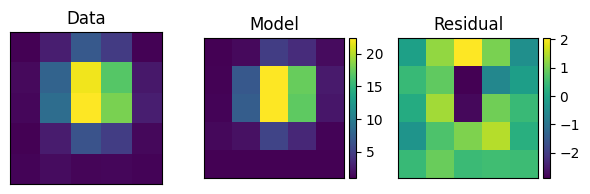

Elapsed Time for Photometry: 42.25848327899985
Starting 2.0  of 13 : <SkyCoord (ICRS): (ra, dec) in deg
    (80.69947281, -69.44357619)>
Setting up sim to match ./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits

MAST OPD query around UTC: 2022-04-13T03:08:10.578
                        MJD: 59682.13067798611

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022041201-NRCA3_FP1-2.fits
	Date (MJD):	 59681.7791
	Delta time:	 -0.3516 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022041301-NRCA3_FP1-1.fits
	Date (MJD):	 59682.8401
	Delta time:	 0.7094 days
User requested choosing OPD time closest in time to 2022-04-13T03:08:10.578, which is R2022041201-NRCA3_FP1-2.fits, delta time -0.352 days
Importing and format-converting OPD from ./webbpsf-data/webbpsf-data/MAST_JWST_WSS_OPDs/R2022041201-NRCA3_FP1-2.fits


Backing out SI WFE and OTE field dependence at the WF sensing field point



Configured simulation instrument for:
    Instrument: MIRI
    Filter: F560W
    Detector: MIRIM
    Apername: MIRIM_FULL
    Det. Pos.: (693, 512) 
    Image plane mask: None
    Pupil plane mask: None
    

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(187.37414158), array(502.80262111)) pixels


    Position 1/1 centroid: (201.43616932953458, 201.73577860812014)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(140.42082679), array(465.07722232)) pixels


    Position 1/1 centroid: (201.40301794781075, 201.76236638868846)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(184.2927142), array(501.92870851)) pixels


    Position 1/1 centroid: (201.4341768144819, 201.7376011650385)

Running instrument: MIRI, filter: F560W
  Running detector: MIRIM
    Position 1/1: (array(137.45242516), array(464.12546009)) pixels


    Position 1/1 centroid: (201.4006941341772, 201.76403586364324)


2024-12-10 20:26:40,213 - stpipe.Image3Pipeline - INFO - Image3Pipeline instance created.


2024-12-10 20:26:40,214 - stpipe.Image3Pipeline.assign_mtwcs - INFO - AssignMTWcsStep instance created.


2024-12-10 20:26:40,217 - stpipe.Image3Pipeline.tweakreg - INFO - TweakRegStep instance created.


2024-12-10 20:26:40,218 - stpipe.Image3Pipeline.skymatch - INFO - SkyMatchStep instance created.


2024-12-10 20:26:40,220 - stpipe.Image3Pipeline.outlier_detection - INFO - OutlierDetectionStep instance created.


2024-12-10 20:26:40,221 - stpipe.Image3Pipeline.resample - INFO - ResampleStep instance created.


2024-12-10 20:26:40,223 - stpipe.Image3Pipeline.source_catalog - INFO - SourceCatalogStep instance created.


2024-12-10 20:26:40,491 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline running with args ('./temp_psf_dir/cal_data_asn.json',).


2024-12-10 20:26:40,505 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: ./temp_psf_dir
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  in_memory: True
  steps:
    assign_mtwcs:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: False
      suffix: assign_mtwcs
      search_output_file: True
      input_dir: ''
    tweakreg:
      pre_hooks: []
      post_hooks: []
      output_file: None
      output_dir: None
      output_ext: .fits
      output_use_model: True
      output_use_index: True
      save_results: False
      skip: True
      suffix: None
      search_output_file: True
      input_dir: ''
      save_catalogs: False


2024-12-10 20:26:40,505 - stpipe.Image3Pipeline - INFO - Starting calwebb_image3 ...


2024-12-10 20:26:41,031 - stpipe.Image3Pipeline.tweakreg - INFO - Step tweakreg running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66d1b990>,).


2024-12-10 20:26:41,031 - stpipe.Image3Pipeline.tweakreg - INFO - Step skipped.


2024-12-10 20:26:42,047 - stpipe.Image3Pipeline.skymatch - INFO - Step skymatch running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66d1b990>,).


2024-12-10 20:26:42,048 - stpipe.Image3Pipeline.skymatch - INFO - Step skipped.


2024-12-10 20:26:42,290 - stpipe.Image3Pipeline.outlier_detection - INFO - Step outlier_detection running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66d1b990>,).


2024-12-10 20:26:42,291 - stpipe.Image3Pipeline.outlier_detection - INFO - Step skipped.


2024-12-10 20:26:42,512 - stpipe.Image3Pipeline.resample - INFO - Step resample running with args (<jwst.datamodels.library.ModelLibrary object at 0x7f3c66d1b990>,).


2024-12-10 20:26:42,513 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:42,513 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:42,514 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:42,514 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:42,516 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:42,516 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:42,517 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:42,518 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:42,519 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:42,520 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:42,520 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:42,520 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:42,522 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'err'


2024-12-10 20:26:42,523 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_rnoise'


2024-12-10 20:26:42,523 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_poisson'


2024-12-10 20:26:42,524 - stpipe.Image3Pipeline.resample - WARNING - Mismatched data shapes; skipping invalid data updates for extension 'var_flat'


2024-12-10 20:26:42,525 - stpipe.Image3Pipeline.resample - INFO - Driz parameter kernel: square


2024-12-10 20:26:42,526 - stpipe.Image3Pipeline.resample - INFO - Driz parameter pixfrac: 1.0


2024-12-10 20:26:42,526 - stpipe.Image3Pipeline.resample - INFO - Driz parameter fillval: NAN


2024-12-10 20:26:42,526 - stpipe.Image3Pipeline.resample - INFO - Driz parameter weight_type: ivm


2024-12-10 20:26:42,527 - stpipe.Image3Pipeline.resample - INFO - Output pixel scale: 0.11082930390039995 arcsec.


2024-12-10 20:26:42,613 - stpipe.Image3Pipeline.resample - INFO - Resampling science data


2024-12-10 20:26:43,140 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:43,943 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:44,707 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:45,494 - stpipe.Image3Pipeline.resample - INFO - Drizzling (1024, 1032) --> (1069, 1070)


2024-12-10 20:26:46,147 - stpipe.Image3Pipeline.resample - INFO - Resampling variance components


2024-12-10 20:26:46,149 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,150 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,151 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00004_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,151 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,152 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,153 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00003_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,153 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,154 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,155 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00002_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,155 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_rnoise' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,156 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_poisson' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,156 - stpipe.Image3Pipeline.resample - WARNING - Data shape mismatch for 'var_flat' for model 'jw01171004001_02101_00001_mirimage_cal.fits'. Skipping ...


2024-12-10 20:26:46,176 - stpipe.Image3Pipeline.resample - INFO - Update S_REGION to POLYGON ICRS  80.660247821 -69.452654203 80.735784316 -69.472169218 80.791372770 -69.445623664 80.715879065 -69.426132741


2024-12-10 20:26:46,614 - stpipe.Image3Pipeline.resample - INFO - Saved model in ./temp_psf_dir/temp_psf_cals_i2d.fits


2024-12-10 20:26:46,614 - stpipe.Image3Pipeline.resample - INFO - Step resample done


2024-12-10 20:26:46,838 - stpipe.Image3Pipeline.source_catalog - INFO - Step source_catalog running with args (<ImageModel(1069, 1070) from temp_psf_cals_i2d.fits>,).


2024-12-10 20:26:46,839 - stpipe.Image3Pipeline.source_catalog - INFO - Step skipped.


2024-12-10 20:26:46,843 - stpipe.Image3Pipeline - INFO - Step Image3Pipeline done


2024-12-10 20:26:46,843 - stpipe - INFO - Results used jwst version: 1.16.1


[1.99883175423715]


2024-12-10 20:26:48,594 - stpipe.SourceCatalogStep - INFO - SourceCatalogStep instance created.


Finished PSF psf_photometry with median residuals of 16.21%


2024-12-10 20:26:48,901 - stpipe.SourceCatalogStep - INFO - Using APCORR reference file: references/jwst/miri/jwst_miri_apcorr_0014.fits


2024-12-10 20:26:48,910 - stpipe.SourceCatalogStep - INFO - Using ABVEGAOFFSET reference file: references/jwst/miri/jwst_miri_abvegaoffset_0001.asdf


2024-12-10 20:26:48,911 - stpipe - INFO - Instrument: MIRI


2024-12-10 20:26:48,911 - stpipe - INFO - Detector: MIRIMAGE


2024-12-10 20:26:48,911 - stpipe - INFO - Filter: F560W


2024-12-10 20:26:48,912 - stpipe - INFO - Subarray: FULL


       mag        
------------------
18.768115389182704


Finished PSF psf_photometry with median residuals of 16.23%


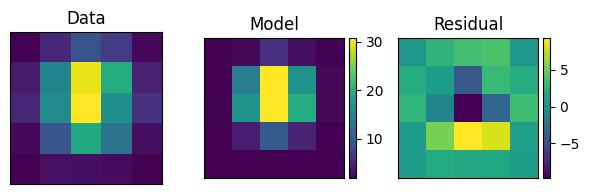

Elapsed Time for Photometry: 29.722019793999834


In [71]:
# Now Loop Through All Stars and Build Photometry Table
counter = 0.
badindex = []

for source_location in skycoords[1:3]:
    tic = time.perf_counter()
    print('Starting', counter+1., ' of', len(skycoords), ':', source_location)
    psf3 = space_phot.get_jwst3_psf(jwst_obs, jwst3_obs, source_location, num_psfs=4)
    xys = [jwst3_obs.wcs.world_to_pixel(source_location)]
    bkg = [localbkg_estimator(jwst3_obs.data, xys[0][0], xys[0][1])]
    print(bkg)
    jwst3_obs.psf_photometry(
        psf3,
        source_location,
        bounds={
            'flux': [-100000, 100000],
            'centroid': [-2.0, 2.0],
        },
        fit_width=5,
        fit_bkg=False,
        background=bkg,
        fit_flux=True
    )

    ra = jwst3_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst3_obs.psf_result.phot_cal_table['dec'][0]
    fit_location = SkyCoord(ra, dec, unit=u.deg)
    jwst3_obs.aperture_photometry(fit_location, encircled_energy=70)
    print(jwst3_obs.aperture_result.phot_cal_table['mag'])
    
    jwst3_obs.psf_photometry(
        psf3,
        fit_location,
        bounds={
            'flux': [-100000, 100000],
            'centroid': [-2.0, 2.0],
        },
        fit_width=5,
        fit_bkg=False,
        fit_centroid=False,
        background=bkg,
        fit_flux=True
    )

    jwst3_obs.plot_psf_fit()
    plt.show()

    ra = jwst3_obs.psf_result.phot_cal_table['ra'][0]
    dec = jwst3_obs.psf_result.phot_cal_table['dec'][0]
    mag_lvl3psf = jwst3_obs.psf_result.phot_cal_table['mag'][0]
    magerr_lvl3psf = jwst3_obs.psf_result.phot_cal_table['magerr'][0]

    if counter == 0:
        df = pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]), columns=['ra', 'dec', 'mag', 'magerr'])
    else:
        df = pd.concat([df, pd.DataFrame(np.array([[ra, dec, mag_lvl3psf, magerr_lvl3psf]]), columns=['ra', 'dec', 'mag', 'magerr'])], ignore_index=True)
    counter = counter + 1.
    toc = time.perf_counter()
    print("Elapsed Time for Photometry:", toc - tic)

In [72]:
lvl2

['./mast/01171/jw01171004001_02101_00004_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00003_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00002_mirimage_cal.fits',
 './mast/01171/jw01171004001_02101_00001_mirimage_cal.fits']

**Important Note**: When not to use. Due to the sensitivity of the space_phot parameters, this tool is not meant to be used for a large sample of stars (i.e., Section 5 below). If a user would like to use space_phot on more than one source, they should carefully construct a table of parameters that are carefully refined for each source.

In [73]:
df

,ra,dec,mag,magerr
0,80.705198,-69.437526,19.515115,0.00304
1,80.699469,-69.443574,19.133434,0.00251


<hr style="border:1px solid gray"> </hr>

<img style="float: center;" src="https://raw.githubusercontent.com/spacetelescope/notebooks/master/assets/stsci_pri_combo_mark_horizonal_white_bkgd.png" alt="Space Telescope Logo" width="200px"/>